# Advanced Regression Assignment

## Aim of this case study

A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.

The company is looking at prospective properties to buy to enter the market. You are required to build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.

The company wants to know:
- Which variables are significant in predicting the price of a house, and
- How well those variables describe the price of a house

Also, we need determine the optimal value of lambda for ridge and lasso regression.

We will work with available independent variables to understand how exactly the demands vary with different features so that management can manipulate the business strategy.

We will go through following steps to acheive our business goal:

#### Steps
1. Importing and Understanding Data
1. Hypothesis Testing
1. Data Preparation
1. Building the model 
    1. Automatic Selection using REF 
    1. Fine tune with Manual Selection
1. Residual Analysis
1. Making Predictions Using the Final Model of Liner Regression
1. Regularization
    1. Ridge Regression
    1. Lasso Regression
1. Model Evaluation
1. Conclusion

## 1. Importing and Understanding Data

Importing required libraries and loading csv data into data frame

In [1]:
# Let's import all the necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import sklearn
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import PolynomialFeatures, MinMaxScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.feature_selection import RFE

import statsmodels
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Importing train.csv 
house = pd.read_csv('train.csv',na_values='NAN')

Now we will check basic information of data such as shape, info, description etc

In [3]:
house.shape

(1460, 81)

In [4]:
house

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


In [5]:
house.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [6]:
house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

<font color='blue'>**Observation**</font> : There are missing values in 19 columns, which we have to look and correct or drop the columns

<font color='blue'>**Observation**</font> : We have a total of 81 columns and 1460 records and records are a mix of int64, float64 and object.

### 1.1 Data Cleaning
Now we need to analyze data and perform cleaning on it

Based on our observation of data and details given in data dictionary we can see that following variables are not required for our model building:
**'Id','Alley','PoolQC' and 'MiscFeature'** : More than 90% columns are null hence droping them

In [7]:
house.drop(['Id','Alley','PoolQC','MiscFeature'],axis=1,inplace=True)

In [8]:
pd.set_option('display.max_rows', 100)

In [9]:
house.nunique().sort_values()

Street              2
Utilities           2
CentralAir          2
PavedDrive          3
HalfBath            3
BsmtHalfBath        3
GarageFinish        3
LandSlope           3
BsmtQual            4
BsmtCond            4
BsmtExposure        4
ExterQual           4
KitchenQual         4
BsmtFullBath        4
FullBath            4
MasVnrType          4
Fireplaces          4
KitchenAbvGr        4
Fence               4
LotShape            4
LandContour         4
HeatingQC           5
FireplaceQu         5
GarageCars          5
LotConfig           5
BldgType            5
Electrical          5
GarageQual          5
GarageCond          5
YrSold              5
MSZoning            5
ExterCond           5
Foundation          6
SaleCondition       6
BsmtFinType1        6
BsmtFinType2        6
GarageType          6
RoofStyle           6
Heating             6
Functional          7
PoolArea            8
Condition2          8
HouseStyle          8
BedroomAbvGr        8
RoofMatl            8
OverallCon

In [10]:
house.Street.value_counts()

Pave    1454
Grvl       6
Name: Street, dtype: int64

In [11]:
house[house.Street=='Grvl']

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
52,90,RM,110.0,8472,Grvl,IR2,Bnk,AllPub,Corner,Mod,...,0,0,0,NaN,0,5,2010,WD,Normal,110000
335,190,RL,NaN,164660,Grvl,IR1,HLS,AllPub,Corner,Sev,...,0,0,0,NaN,700,8,2008,WD,Normal,228950
582,90,RL,81.0,11841,Grvl,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,NaN,0,5,2007,WD,Normal,118500
812,20,C (all),66.0,8712,Grvl,Reg,Bnk,AllPub,Inside,Mod,...,0,0,0,NaN,54,6,2010,WD,Alloca,55993
1061,30,C (all),120.0,18000,Grvl,Reg,Low,AllPub,Inside,Gtl,...,0,0,0,NaN,560,8,2008,ConLD,Normal,81000
1184,20,RL,50.0,35133,Grvl,Reg,Lvl,AllPub,Inside,Mod,...,0,263,0,NaN,0,5,2007,WD,Normal,186700


In [12]:
house.Utilities.value_counts()

AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64

In [13]:
house[house.Utilities=='NoSeWa']

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
944,20,RL,NaN,14375,Pave,IR1,Lvl,NoSeWa,CulDSac,Gtl,...,0,233,0,NaN,0,1,2009,COD,Abnorml,137500


In [14]:
house.CentralAir.value_counts()

Y    1365
N      95
Name: CentralAir, dtype: int64

In [15]:
house.PavedDrive.value_counts()

Y    1340
N      90
P      30
Name: PavedDrive, dtype: int64

In [16]:
house.HalfBath.value_counts()

0    913
1    535
2     12
Name: HalfBath, dtype: int64

In [17]:
house.BsmtHalfBath.value_counts()

0    1378
1      80
2       2
Name: BsmtHalfBath, dtype: int64

In [18]:
house.GarageFinish.value_counts()

Unf    605
RFn    422
Fin    352
Name: GarageFinish, dtype: int64

In [19]:
house.LandSlope.value_counts()

Gtl    1382
Mod      65
Sev      13
Name: LandSlope, dtype: int64

<font color='blue'>**Observation**</font> : **Street and Utilities** : will not have any impact of the model hence dropping them

In [20]:
house.drop(['Street','Utilities'],axis=1,inplace=True)

In [21]:
pd.set_option('display.max_rows', 10)

In [22]:
house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 75 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   LotShape       1460 non-null   object 
 5   LandContour    1460 non-null   object 
 6   LotConfig      1460 non-null   object 
 7   LandSlope      1460 non-null   object 
 8   Neighborhood   1460 non-null   object 
 9   Condition1     1460 non-null   object 
 10  Condition2     1460 non-null   object 
 11  BldgType       1460 non-null   object 
 12  HouseStyle     1460 non-null   object 
 13  OverallQual    1460 non-null   int64  
 14  OverallCond    1460 non-null   int64  
 15  YearBuilt      1460 non-null   int64  
 16  YearRemodAdd   1460 non-null   int64  
 17  RoofStyle      1460 non-null   object 
 18  RoofMatl

### 1.1 Treating Missing Value
Now we need to treat missing values

In [23]:
house[house['LotFrontage'].isna()]

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,...,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
7,60,RL,NaN,10382,IR1,Lvl,Corner,Gtl,NWAmes,PosN,...,0,0,0,NaN,350,11,2009,WD,Normal,200000
12,20,RL,NaN,12968,IR2,Lvl,Inside,Gtl,Sawyer,Norm,...,0,176,0,NaN,0,9,2008,WD,Normal,144000
14,20,RL,NaN,10920,IR1,Lvl,Corner,Gtl,NAmes,Norm,...,0,0,0,GdWo,0,5,2008,WD,Normal,157000
16,20,RL,NaN,11241,IR1,Lvl,CulDSac,Gtl,NAmes,Norm,...,0,0,0,NaN,700,3,2010,WD,Normal,149000
24,20,RL,NaN,8246,IR1,Lvl,Inside,Gtl,Sawyer,Norm,...,0,0,0,MnPrv,0,5,2010,WD,Normal,154000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1429,20,RL,NaN,12546,IR1,Lvl,Corner,Gtl,NWAmes,Norm,...,0,0,0,NaN,0,4,2007,WD,Normal,182900
1431,120,RL,NaN,4928,IR1,Lvl,Inside,Gtl,NPkVill,Norm,...,0,0,0,NaN,0,10,2009,WD,Normal,143750
1441,120,RM,NaN,4426,Reg,Lvl,Inside,Gtl,CollgCr,Norm,...,0,0,0,NaN,0,5,2008,WD,Normal,149300
1443,30,RL,NaN,8854,Reg,Lvl,Inside,Gtl,BrkSide,Norm,...,0,40,0,NaN,0,5,2009,WD,Normal,121000


In [24]:
house.LotFrontage.describe()

count    1201.000000
mean       70.049958
std        24.284752
min        21.000000
25%        59.000000
50%        69.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64

<font color='blue'>**Observation**</font> : Replacing missing values with median value (69)

In [25]:
house.LotFrontage = house.LotFrontage.fillna(house.LotFrontage.median())

In [26]:
house[house['MasVnrType'].isna()].MasVnrType

234     NaN
529     NaN
650     NaN
936     NaN
973     NaN
977     NaN
1243    NaN
1278    NaN
Name: MasVnrType, dtype: object

In [27]:
house.MasVnrType.value_counts(dropna=False)

None       864
BrkFace    445
Stone      128
BrkCmn      15
NaN          8
Name: MasVnrType, dtype: int64

In [28]:
house.MasVnrArea.value_counts(dropna=False)

0.0      861
NaN        8
72.0       8
108.0      8
180.0      8
        ... 
562.0      1
89.0       1
921.0      1
762.0      1
119.0      1
Name: MasVnrArea, Length: 328, dtype: int64

<font color='blue'>**Observation**</font> : Only 8 are Nan values for MasVnrType and MasVnrArea we will replace it with None and 0.0 respectively

In [29]:
house.MasVnrType = house.MasVnrType.fillna('None')
house.MasVnrArea = house.MasVnrArea.fillna(0.0)

In [30]:
house[house['BsmtQual'].isna()].BsmtQual.value_counts(dropna=False)

NaN    37
Name: BsmtQual, dtype: int64

<font color='blue'>**Observation**</font> : Here, after checking the file and data dictionary we cab see that value 'No Basement' which is represented by 'NA' is wrongly interpreted as NaN. We will change 'NA' to 'NB' to correctly represent No Basement. And it is applicable to 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1' and 'BsmtFinType2'.

In [31]:
house.BsmtQual = house.BsmtQual.fillna('NB')
house.BsmtCond = house.BsmtCond.fillna('NB')
house.BsmtExposure = house.BsmtExposure.fillna('NB')
house.BsmtFinType1 = house.BsmtFinType1.fillna('NB')
house.BsmtFinType2 = house.BsmtFinType2.fillna('NB')

In [32]:
house.Electrical.value_counts(dropna=False)

SBrkr    1334
FuseA      94
FuseF      27
FuseP       3
Mix         1
NaN         1
Name: Electrical, dtype: int64

<font color='blue'>**Observation**</font> : Will replace NA value with SBrkr for 'Electrical'

In [33]:
house.Electrical = house.Electrical.fillna('SBrkr')

In [34]:
house.Fireplaces.value_counts()

0    690
1    650
2    115
3      5
Name: Fireplaces, dtype: int64

In [35]:
house.FireplaceQu.value_counts(dropna=False)

NaN    690
Gd     380
TA     313
Fa      33
Ex      24
Po      20
Name: FireplaceQu, dtype: int64

<font color='blue'>**Observation**</font> : Based on dictionary and counts of FireplaceQu and Fireplaces we can conclude that NA for FireplaceQu is there because there are no fire place. Hence we will replace FireplaceQu NA with NF

In [36]:
house.FireplaceQu = house.FireplaceQu.fillna('NF')

In [37]:
house.GarageType.value_counts(dropna=False)

Attchd     870
Detchd     387
BuiltIn     88
NaN         81
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: int64

In [38]:
house.GarageYrBlt.value_counts(dropna=False)

NaN       81
2005.0    65
2006.0    59
2004.0    53
2003.0    50
          ..
1927.0     1
1900.0     1
1906.0     1
1908.0     1
1933.0     1
Name: GarageYrBlt, Length: 98, dtype: int64

In [39]:
house.GarageFinish.value_counts(dropna=False)

Unf    605
RFn    422
Fin    352
NaN     81
Name: GarageFinish, dtype: int64

In [40]:
house.GarageArea.value_counts(dropna=False)

0      81
440    49
576    47
240    38
484    34
       ..
320     1
594     1
831     1
878     1
192     1
Name: GarageArea, Length: 441, dtype: int64

In [41]:
house.GarageCars.value_counts(dropna=False)

2    824
1    369
3    181
0     81
4      5
Name: GarageCars, dtype: int64

In [42]:
house.GarageQual.value_counts(dropna=False)

TA     1311
NaN      81
Fa       48
Gd       14
Ex        3
Po        3
Name: GarageQual, dtype: int64

In [43]:
house.GarageCond.value_counts(dropna=False)

TA     1326
NaN      81
Fa       35
Gd        9
Po        7
Ex        2
Name: GarageCond, dtype: int64

<font color='blue'>**Observation**</font> : Based on 'GarageType', 'GarageCond', 'GarageQual', 'GarageCars', 'GarageArea', 'GarageFinish' and 'GarageYrBlt' we can see that NA does not represent missing value but it represent no garage since garage cars and garage area is present we will considere then as no garage is present for NA values and will replace it with NG and for 'GarageYrBlt' we will replace it with 0.0 to represent lowest value

In [44]:
house.GarageType = house.GarageType.fillna('NG')
house.GarageCond = house.GarageCond.fillna('NG')
house.GarageQual = house.GarageQual.fillna('NG')
house.GarageYrBlt = house.GarageYrBlt.fillna(0.0)
house.GarageFinish = house.GarageFinish.fillna('NG')

In [45]:
house.Fence.value_counts(dropna=False)

NaN      1179
MnPrv     157
GdPrv      59
GdWo       54
MnWw       11
Name: Fence, dtype: int64

<font color='blue'>**Observation**</font> : Here we will replace NaN with No fence ('NF') as per dictionary

In [46]:
house.Fence = house.Fence.fillna('NF')

In [47]:
house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 75 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1460 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   LotShape       1460 non-null   object 
 5   LandContour    1460 non-null   object 
 6   LotConfig      1460 non-null   object 
 7   LandSlope      1460 non-null   object 
 8   Neighborhood   1460 non-null   object 
 9   Condition1     1460 non-null   object 
 10  Condition2     1460 non-null   object 
 11  BldgType       1460 non-null   object 
 12  HouseStyle     1460 non-null   object 
 13  OverallQual    1460 non-null   int64  
 14  OverallCond    1460 non-null   int64  
 15  YearBuilt      1460 non-null   int64  
 16  YearRemodAdd   1460 non-null   int64  
 17  RoofStyle      1460 non-null   object 
 18  RoofMatl

<font color='blue'>**Observation**</font> : All fields and rows are now fixed, we could have done this in better and smarter way but this is how you learn. I discovered better way of fixing these values to considere NA values as legit values as follows

In [48]:
# Importing train.csv 
house_smart = pd.read_csv('train.csv', keep_default_na=False, na_values=['-1.#IND', '1.#QNAN', '1.#IND', '-1.#QNAN', '#N/A N/A', '#N/A', 'N/A', 'n/a', '<NA>', '#NA', 'NULL', 'null', 'NaN', '-NaN', 'nan', '-nan', ''])

In [49]:
house_smart.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Id             1460 non-null   int64 
 1   MSSubClass     1460 non-null   int64 
 2   MSZoning       1460 non-null   object
 3   LotFrontage    1460 non-null   object
 4   LotArea        1460 non-null   int64 
 5   Street         1460 non-null   object
 6   Alley          1460 non-null   object
 7   LotShape       1460 non-null   object
 8   LandContour    1460 non-null   object
 9   Utilities      1460 non-null   object
 10  LotConfig      1460 non-null   object
 11  LandSlope      1460 non-null   object
 12  Neighborhood   1460 non-null   object
 13  Condition1     1460 non-null   object
 14  Condition2     1460 non-null   object
 15  BldgType       1460 non-null   object
 16  HouseStyle     1460 non-null   object
 17  OverallQual    1460 non-null   int64 
 18  OverallCond    1460 non-null

<font color='blue'>**Observation**</font> : Here I have just dropped two values from default consideration NaN. ('NA' and 'None' which could have been identified from dictionary observation and this long process of replacing all fields would have been avoided)

In [50]:
pd.set_option('display.max_columns', None)

In [51]:
house

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NF,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NF,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Reg,Lvl,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NF,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,IR1,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NF,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,IR1,Lvl,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NF,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,IR1,Lvl,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NF,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Reg,Lvl,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NF,0,8,2007,WD,Normal,175000
1456,20,RL,85.0,13175,Reg,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,MnPrv,0,2,2010,WD,Normal,210000
1457,70,RL,66.0,9042,Reg,Lvl,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,GdPrv,2500,5,2010,WD,Normal,266500
1458,20,RL,68.0,9717,Reg,Lvl,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,Y,FuseA,1078,0,0,1078,1,0,1,0,2,1,Gd,5,Typ,0,NF,Attchd,1950.0,Unf,1,240,TA,TA,Y,366,0,112,0,0,0,NF,0,4,2010,WD,Normal,142125


<font color='blue'>**Observation**</font> : We will convert numerical values of categorical columns to string values to help us in encoding down the line <br>
These columns need these changes  : MSSubClass, OverallQual and OverallCond



In [52]:
house.MSSubClass = house.MSSubClass.astype('string')
house.OverallQual = house.OverallQual.astype('string')
house.OverallCond = house.OverallCond.astype('string')

In [53]:
house.MSSubClass = house.MSSubClass.apply(lambda x : x.replace(x,x+'MSSubClass'))
house.OverallQual = house.OverallQual.apply(lambda x : x.replace(x,x+'OverallQual'))
house.OverallCond = house.OverallCond.apply(lambda x : x.replace(x,x+'OverallCond'))

In [54]:
house[['MSSubClass','OverallQual','OverallCond']]

,MSSubClass,OverallQual,OverallCond
0,60MSSubClass,7OverallQual,5OverallCond
1,20MSSubClass,6OverallQual,8OverallCond
2,60MSSubClass,7OverallQual,5OverallCond
3,70MSSubClass,7OverallQual,5OverallCond
4,60MSSubClass,8OverallQual,5OverallCond
...,...,...,...
1455,60MSSubClass,6OverallQual,5OverallCond
1456,20MSSubClass,6OverallQual,6OverallCond
1457,70MSSubClass,7OverallQual,9OverallCond
1458,20MSSubClass,5OverallQual,6OverallCond


## 2. Hypothesis Testing

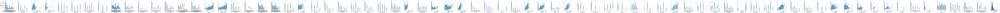

In [55]:
sns.pairplot(y_vars='SalePrice',x_vars=house.columns,data=house)

There is some correlation between SalePrice and LotFrontage, LotArea, LandSlope, OverallQual, YearBuilt, Bsmt Areas, Living areas, GarageArea and many more.

<font color='blue'>**Observation**</font> : Hence we can conclude that liner regression model can be applied to this data set

## 3. Data Preparation
Now we will prepare data for making data useful for RFE and Regularization

<font color='blue'>**Observation**</font> : We can figure out which columns are categorical or Numeric based on its data type and data readme sheet

In [56]:
categorical_columns = house.select_dtypes(include=['object']).columns.to_list()
numerical_columns = house.select_dtypes(exclude=['object']).columns.to_list()
print(categorical_columns)
print(numerical_columns)



['MSSubClass', 'MSZoning', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'Fence', 'SaleType', 'SaleCondition']
['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVa

In [57]:
house[categorical_columns]

,MSSubClass,MSZoning,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,Fence,SaleType,SaleCondition
0,60MSSubClass,RL,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7OverallQual,5OverallCond,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NF,Attchd,RFn,TA,TA,Y,NF,WD,Normal
1,20MSSubClass,RL,Reg,Lvl,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6OverallQual,8OverallCond,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NF,WD,Normal
2,60MSSubClass,RL,IR1,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7OverallQual,5OverallCond,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NF,WD,Normal
3,70MSSubClass,RL,IR1,Lvl,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7OverallQual,5OverallCond,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,NF,WD,Abnorml
4,60MSSubClass,RL,IR1,Lvl,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8OverallQual,5OverallCond,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NF,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60MSSubClass,RL,Reg,Lvl,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6OverallQual,5OverallCond,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,PConc,Gd,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NF,WD,Normal
1456,20MSSubClass,RL,Reg,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6OverallQual,6OverallCond,Gable,CompShg,Plywood,Plywood,Stone,TA,TA,CBlock,Gd,TA,No,ALQ,Rec,GasA,TA,Y,SBrkr,TA,Min1,TA,Attchd,Unf,TA,TA,Y,MnPrv,WD,Normal
1457,70MSSubClass,RL,Reg,Lvl,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7OverallQual,9OverallCond,Gable,CompShg,CemntBd,CmentBd,None,Ex,Gd,Stone,TA,Gd,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,GdPrv,WD,Normal
1458,20MSSubClass,RL,Reg,Lvl,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5OverallQual,6OverallCond,Hip,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,TA,TA,Mn,GLQ,Rec,GasA,Gd,Y,FuseA,Gd,Typ,NF,Attchd,Unf,TA,TA,Y,NF,WD,Normal


In [58]:
house[numerical_columns]

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,65.0,8450,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,80.0,9600,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,68.0,11250,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,60.0,9550,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,84.0,14260,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,62.0,7917,1999,2000,0.0,0,0,953,953,953,694,0,1647,0,0,2,1,3,1,7,1,1999.0,2,460,0,40,0,0,0,0,0,8,2007,175000
1456,85.0,13175,1978,1988,119.0,790,163,589,1542,2073,0,0,2073,1,0,2,0,3,1,7,2,1978.0,2,500,349,0,0,0,0,0,0,2,2010,210000
1457,66.0,9042,1941,2006,0.0,275,0,877,1152,1188,1152,0,2340,0,0,2,0,4,1,9,2,1941.0,1,252,0,60,0,0,0,0,2500,5,2010,266500
1458,68.0,9717,1950,1996,0.0,49,1029,0,1078,1078,0,0,1078,1,0,1,0,2,1,5,0,1950.0,1,240,366,0,112,0,0,0,0,4,2010,142125


### 3.1 Data Cleaning - Outlier Processing

#### Numeric variables treatment

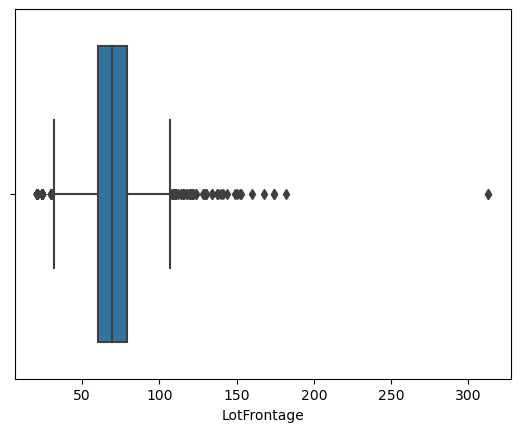

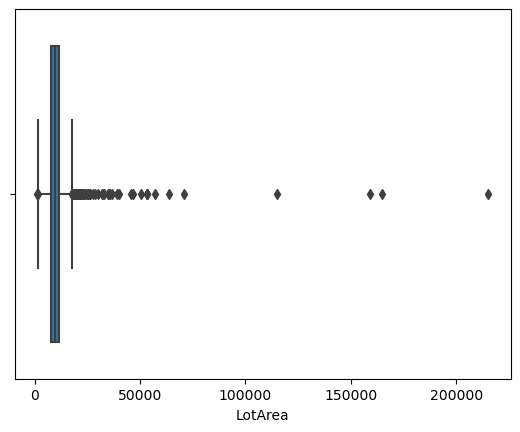

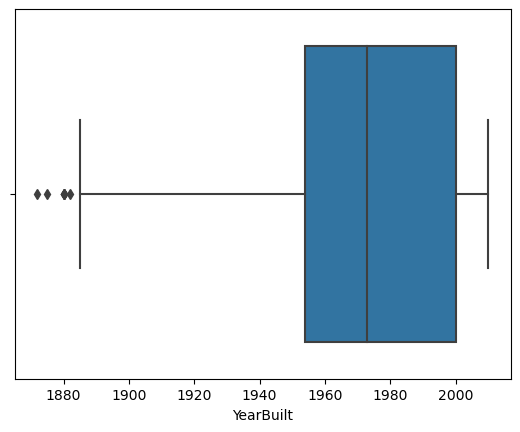

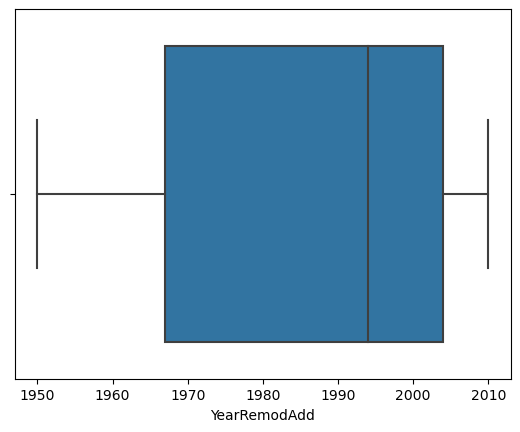

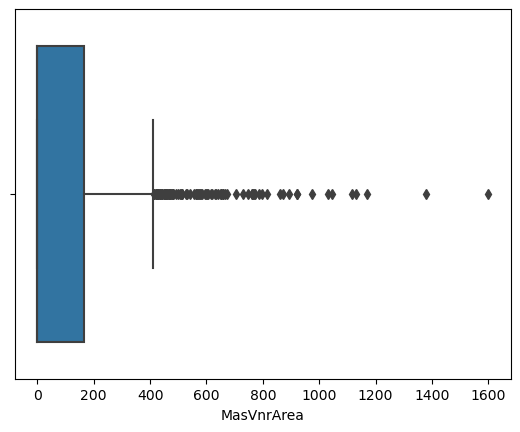

...

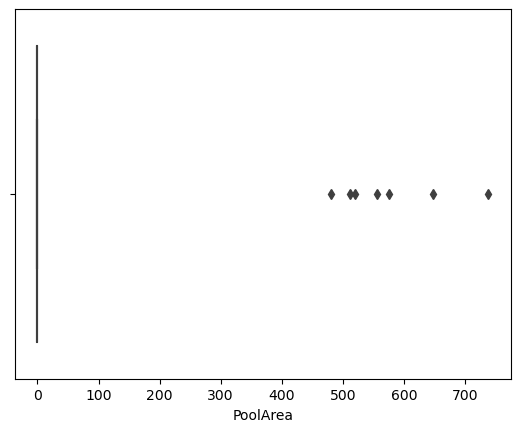

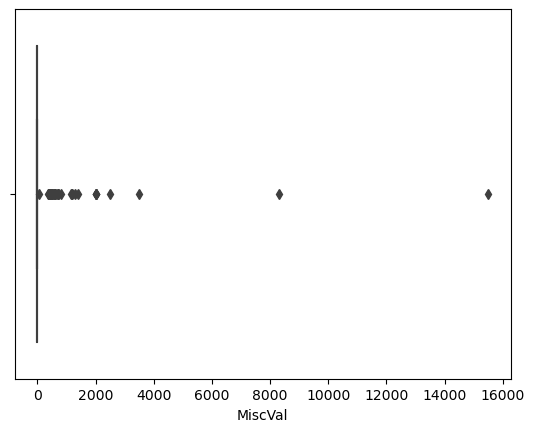

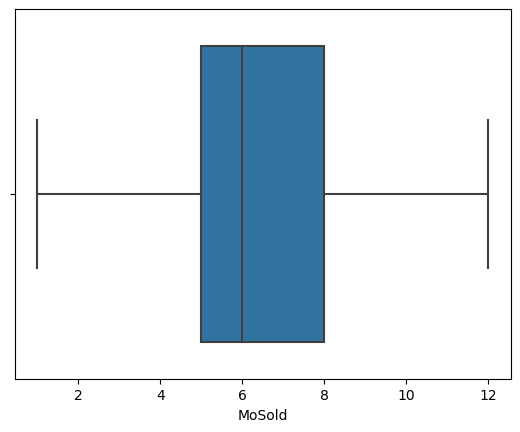

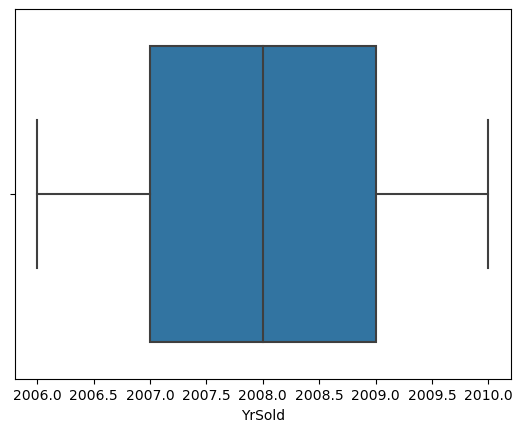

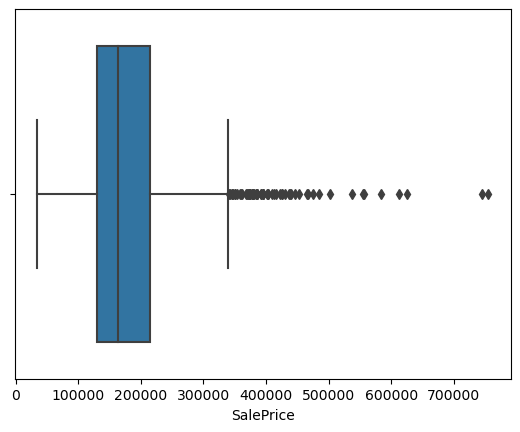

In [59]:
# Plotting all numeric variables in box plot
def box_plot(series):
    sns.boxplot(x=series)
    plt.show()


for column_name in numerical_columns:
    box_plot(house[column_name])

<font color='blue'>**Observation**</font> : We have 9 points above saleprice of 500,000. We will first drop these and observe other variables as mostly outliers associated with those would be same data point

In [60]:
house[house.SalePrice>500000]

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
178,20MSSubClass,RL,63.0,17423,IR1,Lvl,CulDSac,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9OverallQual,5OverallCond,2008,2009,Hip,CompShg,VinylSd,VinylSd,Stone,748.0,Ex,TA,PConc,Ex,TA,No,GLQ,1904,Unf,0,312,2216,GasA,Ex,Y,SBrkr,2234,0,0,2234,1,0,2,0,1,1,Ex,9,Typ,1,Gd,Attchd,2009.0,Fin,3,1166,TA,TA,Y,0,60,0,0,0,0,NF,0,7,2009,New,Partial,501837
440,20MSSubClass,RL,105.0,15431,Reg,Lvl,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,10OverallQual,5OverallCond,2008,2008,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Ex,TA,PConc,Ex,TA,Gd,GLQ,1767,ALQ,539,788,3094,GasA,Ex,Y,SBrkr,2402,0,0,2402,1,0,2,0,2,1,Ex,10,Typ,2,Gd,Attchd,2008.0,Fin,3,672,TA,TA,Y,0,72,0,0,170,0,NF,0,4,2009,WD,Normal,555000
691,60MSSubClass,RL,104.0,21535,IR1,Lvl,Corner,Gtl,NoRidge,Norm,Norm,1Fam,2Story,10OverallQual,6OverallCond,1994,1995,Gable,WdShngl,HdBoard,HdBoard,BrkFace,1170.0,Ex,TA,PConc,Ex,TA,Gd,GLQ,1455,Unf,0,989,2444,GasA,Ex,Y,SBrkr,2444,1872,0,4316,0,1,3,1,4,1,Ex,10,Typ,2,Ex,Attchd,1994.0,Fin,3,832,TA,TA,Y,382,50,0,0,0,0,NF,0,1,2007,WD,Normal,755000
769,60MSSubClass,RL,47.0,53504,IR2,HLS,CulDSac,Mod,StoneBr,Norm,Norm,1Fam,2Story,8OverallQual,5OverallCond,2003,2003,Hip,CompShg,CemntBd,Wd Shng,BrkFace,603.0,Ex,TA,PConc,Gd,TA,Gd,ALQ,1416,Unf,0,234,1650,GasA,Ex,Y,SBrkr,1690,1589,0,3279,1,0,3,1,4,1,Ex,12,Mod,1,Gd,BuiltIn,2003.0,Fin,3,841,TA,TA,Y,503,36,0,0,210,0,NF,0,6,2010,WD,Normal,538000
803,60MSSubClass,RL,107.0,13891,Reg,Lvl,Inside,Gtl,NridgHt,Norm,Norm,1Fam,2Story,9OverallQual,5OverallCond,2008,2009,Hip,CompShg,VinylSd,VinylSd,Stone,424.0,Ex,TA,PConc,Ex,TA,Gd,Unf,0,Unf,0,1734,1734,GasA,Ex,Y,SBrkr,1734,1088,0,2822,0,0,3,1,4,1,Ex,12,Typ,1,Gd,BuiltIn,2009.0,RFn,3,1020,TA,TA,Y,52,170,0,0,192,0,NF,0,1,2009,New,Partial,582933
898,20MSSubClass,RL,100.0,12919,IR1,Lvl,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,9OverallQual,5OverallCond,2009,2010,Hip,CompShg,VinylSd,VinylSd,Stone,760.0,Ex,TA,PConc,Ex,TA,Gd,GLQ,2188,Unf,0,142,2330,GasA,Ex,Y,SBrkr,2364,0,0,2364,1,0,2,1,2,1,Ex,11,Typ,2,Gd,Attchd,2009.0,Fin,3,820,TA,TA,Y,0,67,0,0,0,0,NF,0,3,2010,New,Partial,611657
1046,60MSSubClass,RL,85.0,16056,IR1,Lvl,Inside,Gtl,StoneBr,Norm,Norm,1Fam,2Story,9OverallQual,5OverallCond,2005,2006,Hip,CompShg,CemntBd,CmentBd,Stone,208.0,Gd,TA,PConc,Ex,TA,Av,GLQ,240,Unf,0,1752,1992,GasA,Ex,Y,SBrkr,1992,876,0,2868,0,0,3,1,4,1,Ex,11,Typ,1,Gd,BuiltIn,2005.0,Fin,3,716,TA,TA,Y,214,108,0,0,0,0,NF,0,7,2006,New,Partial,556581
1169,60MSSubClass,RL,118.0,35760,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,10OverallQual,5OverallCond,1995,1996,Hip,CompShg,HdBoard,HdBoard,BrkFace,1378.0,Gd,Gd,PConc,Ex,TA,Gd,GLQ,1387,Unf,0,543,1930,GasA,Ex,Y,SBrkr,1831,1796,0,3627,1,0,3,1,4,1,Gd,10,Typ,1,TA,Attchd,1995.0,Fin,3,807,TA,TA,Y,361,76,0,0,0,0,NF,0,7,2006,WD,Normal,625000
1182,60MSSubClass,RL,160.0,15623,IR1,Lvl,Corner,Gtl,NoRidge,Norm,Norm,1Fam,2Story,10OverallQual,5OverallCond,1996,1996,Hip,CompShg,Wd Sdng,ImStucc,None,0.0,Gd,TA,PConc,Ex,TA,Av,GLQ,2096,Unf,0,300,2396,GasA,Ex,Y,SBrkr,2411,2065,0,4476,1,0,3,1,4,1,Ex,10,Typ,2,TA,Attchd,1996.0,Fin,3,813,TA,TA,Y,171,78,0,0,0,555,MnPrv,0,7,2007,WD,Abnorml,745000


In [61]:
house = house[house.SalePrice<=500000]

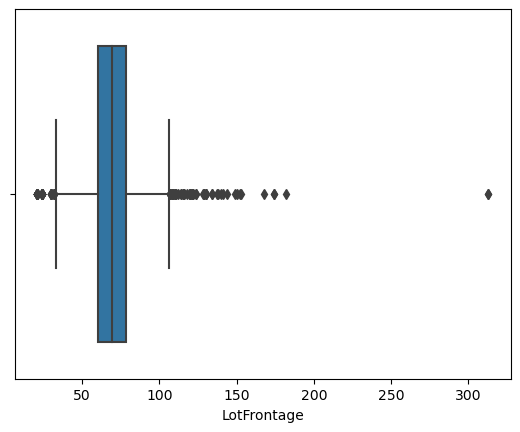

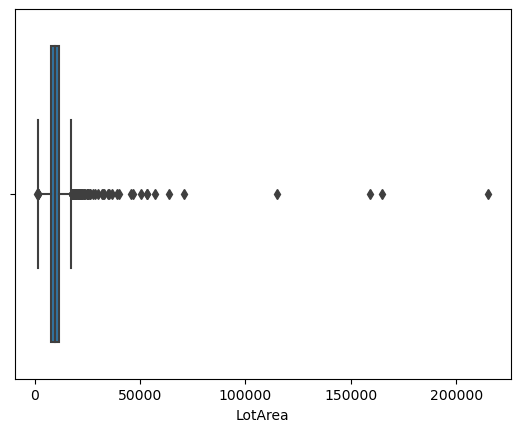

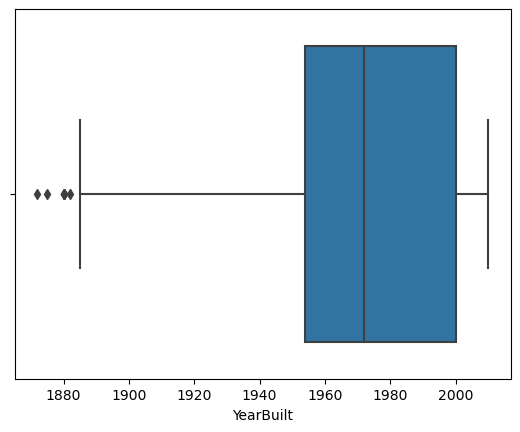

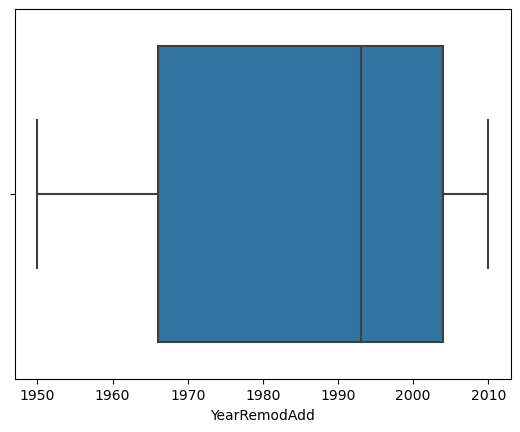

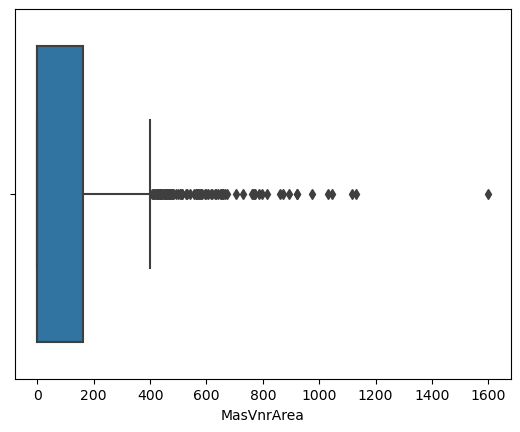

...

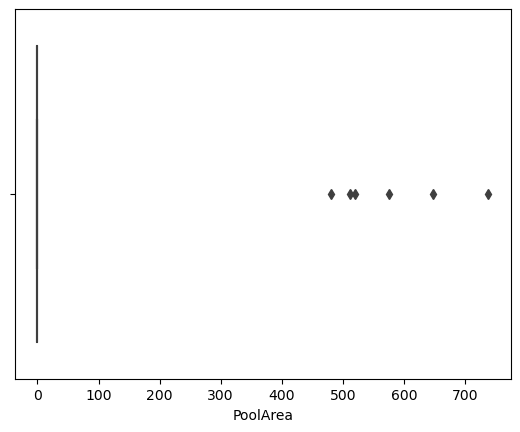

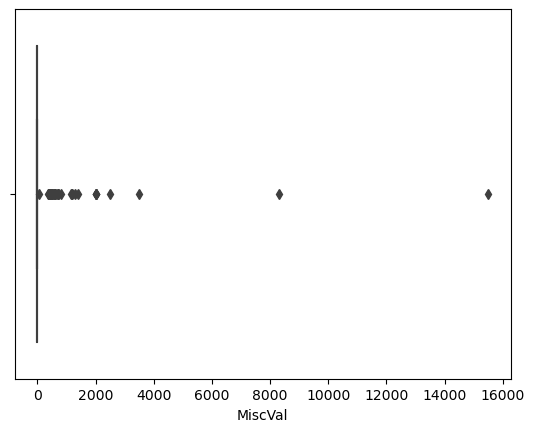

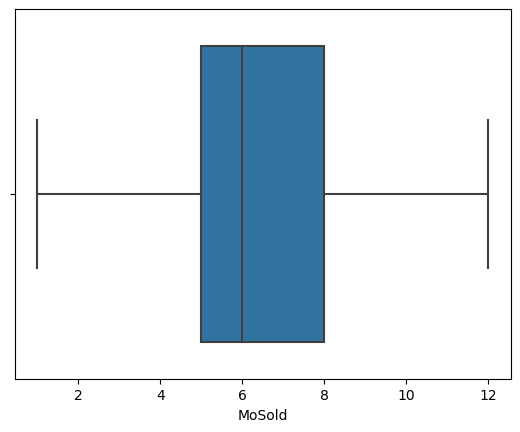

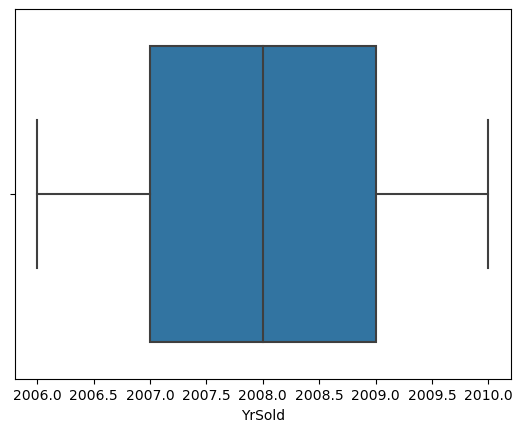

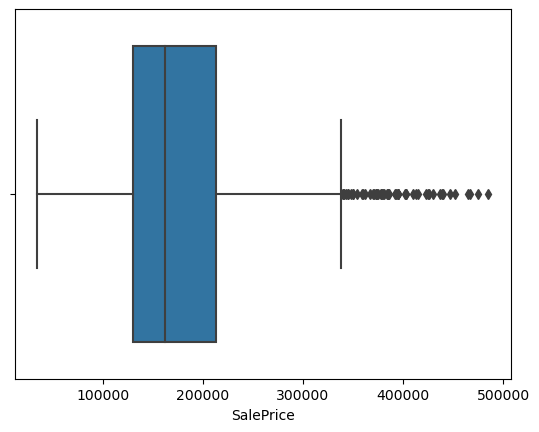

In [62]:
for column_name in numerical_columns:
    box_plot(house[column_name])

<font color='blue'>**Observation**</font> : TotalBsmtSF has three points above 3000 which we will drop

In [63]:
house = house[house.TotalBsmtSF<=3000]

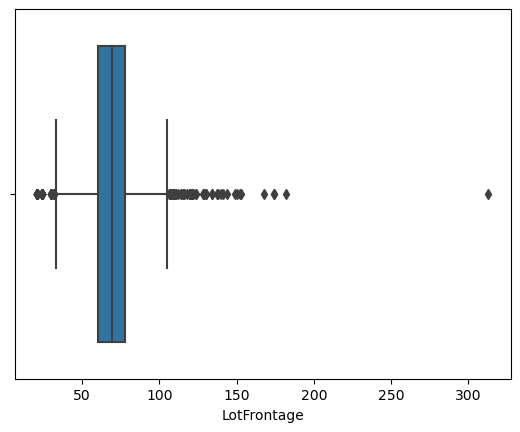

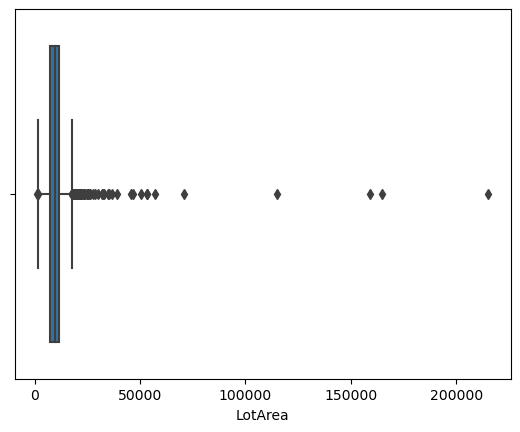

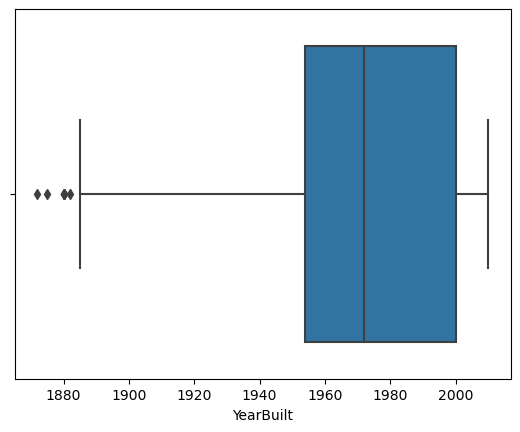

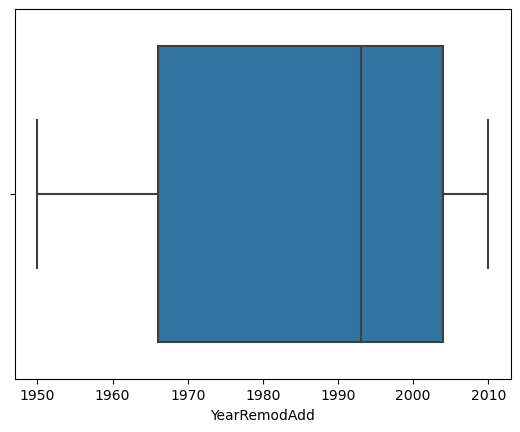

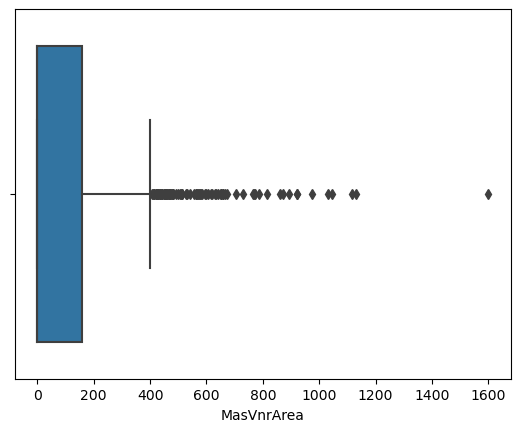

...

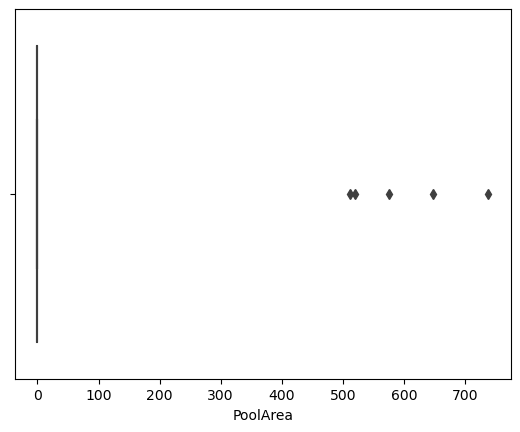

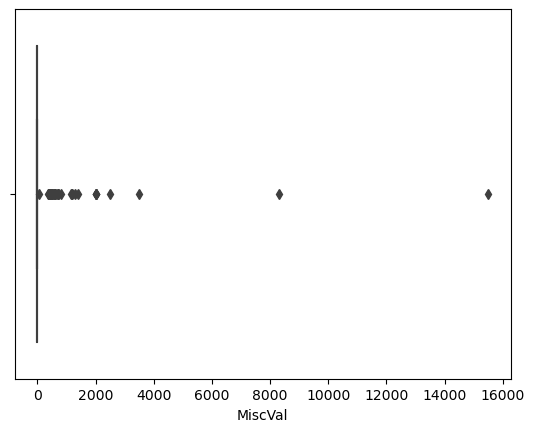

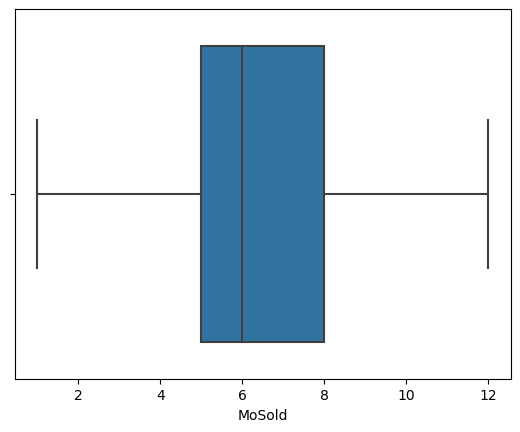

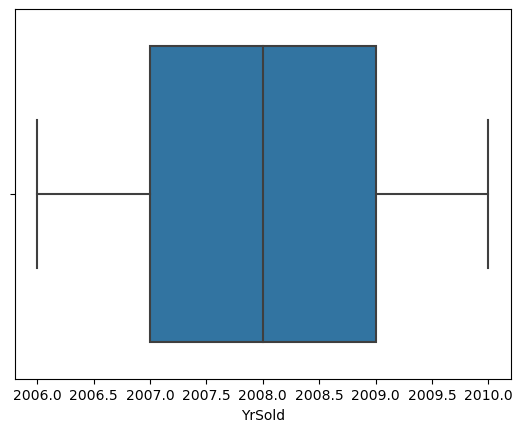

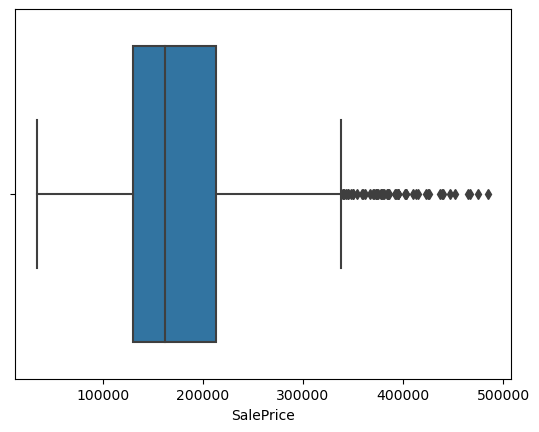

In [64]:
for column_name in numerical_columns:
    box_plot(house[column_name])

<font color='blue'>**Observation**</font> : GarageArea has 5 points above 1100 which we will drop

In [65]:
house = house[house.GarageArea<=1100]

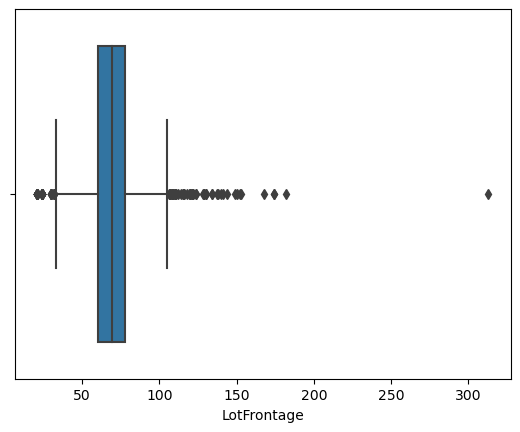

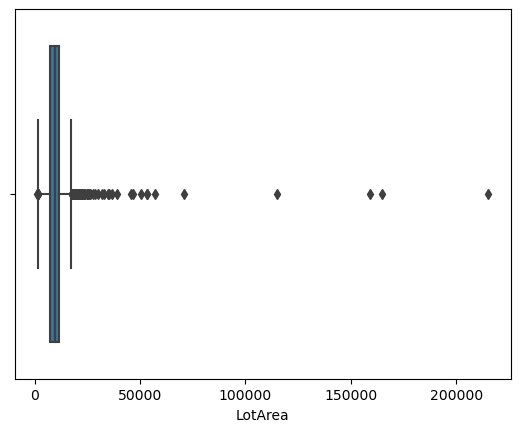

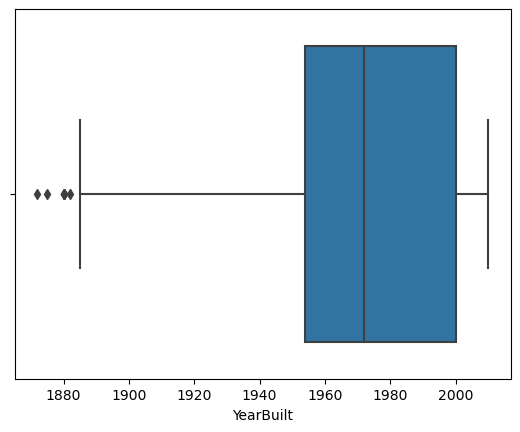

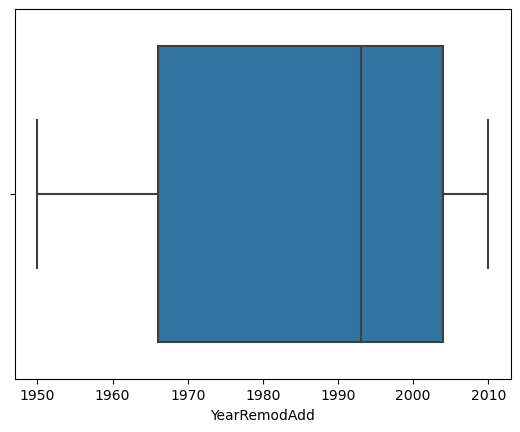

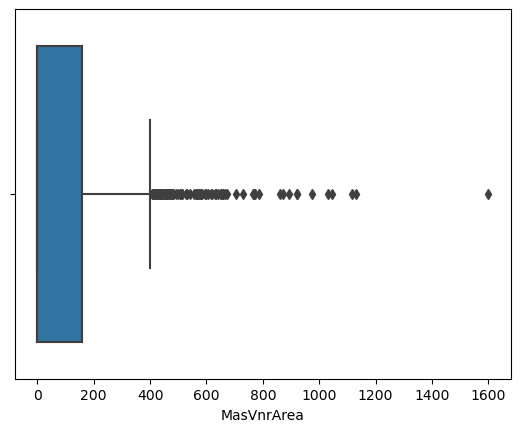

...

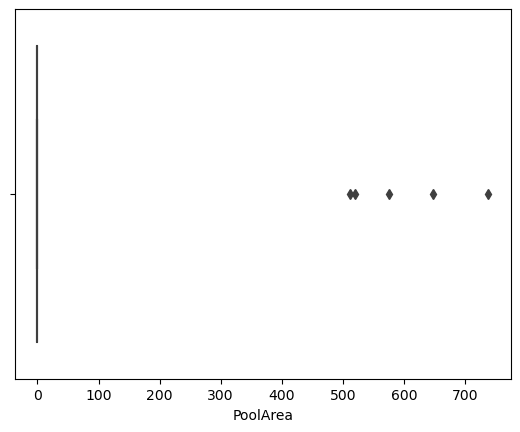

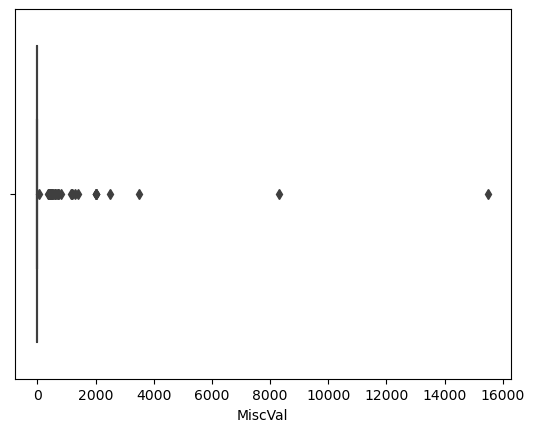

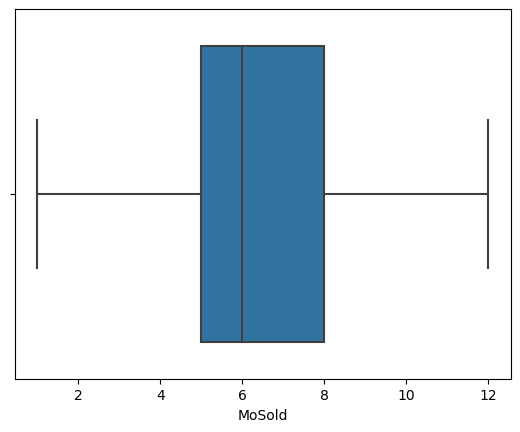

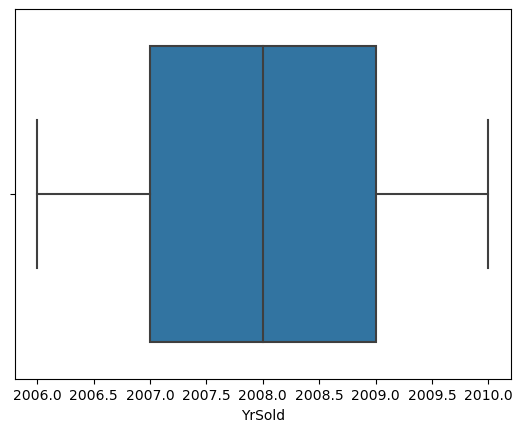

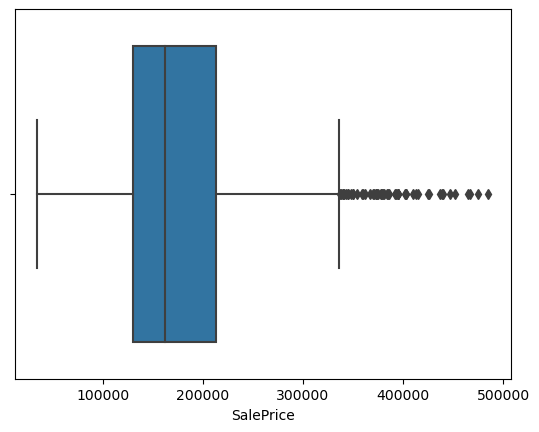

In [66]:
for column_name in numerical_columns:
    box_plot(house[column_name])

<font color='blue'>**Observation**</font> : GarageCars has 1 points above 3 which we will drop

In [67]:
house = house[house.GarageCars<=3]

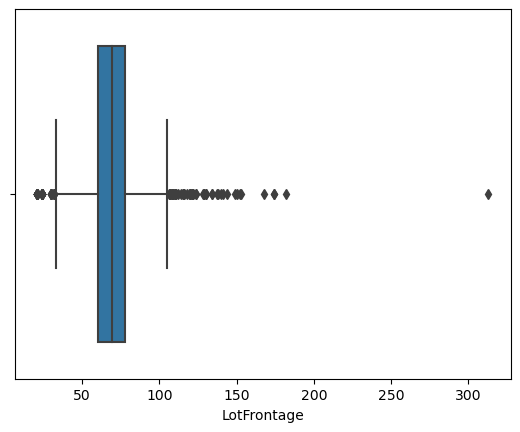

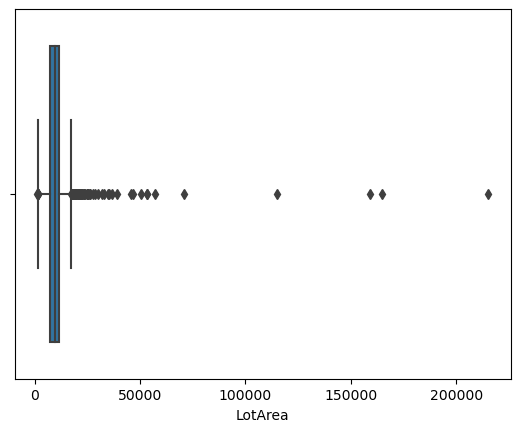

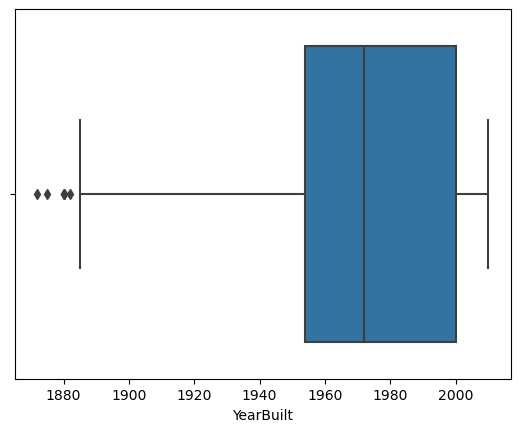

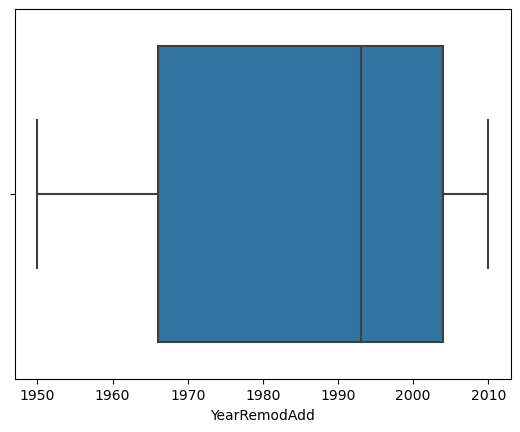

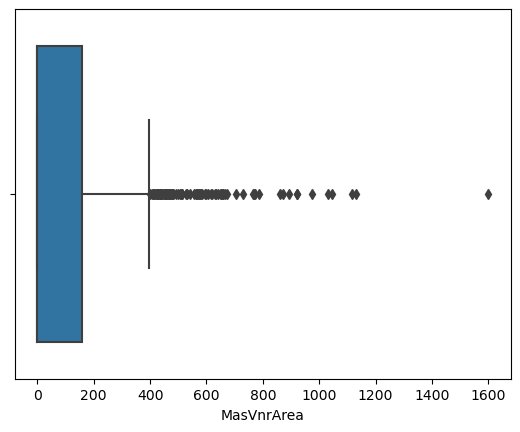

...

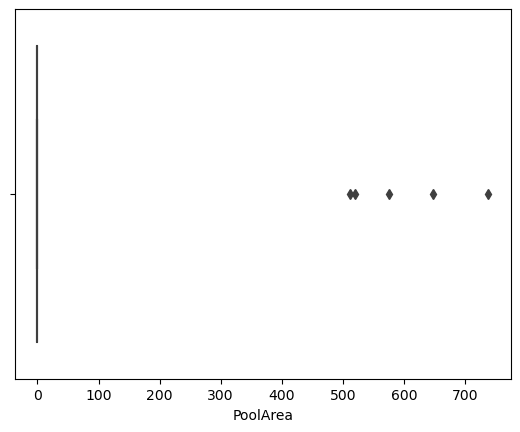

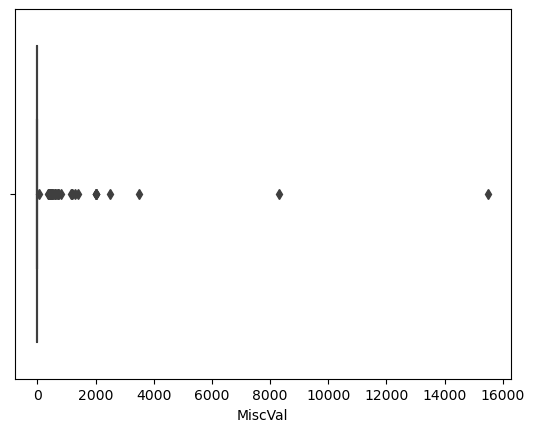

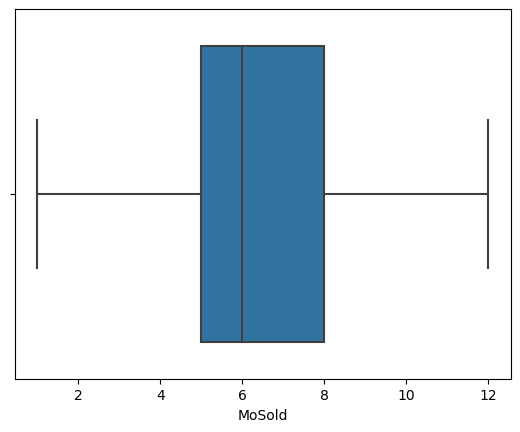

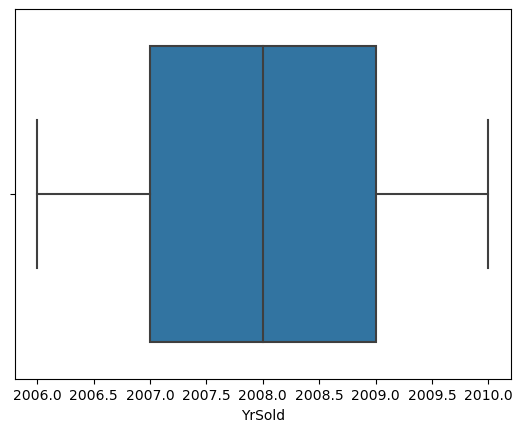

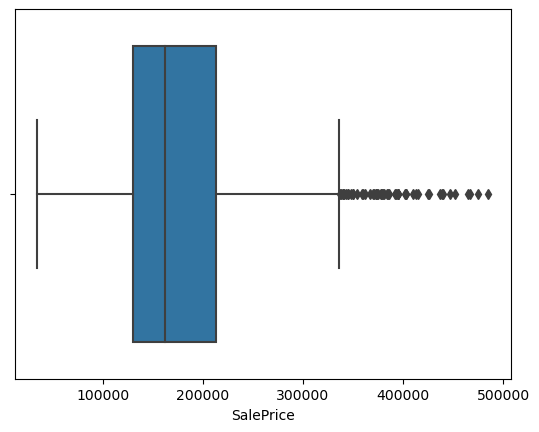

In [68]:
for column_name in numerical_columns:
    box_plot(house[column_name])

<font color='blue'>**Observation**</font> : Fireplaces has 1 points above 2 which we will drop

In [69]:
house = house[house.Fireplaces<=2]

<font color='blue'>**Observation**</font> : TotRmsAbvGrd has 3 points above 10 which we will drop

In [70]:
house = house[house.TotRmsAbvGrd<=10]

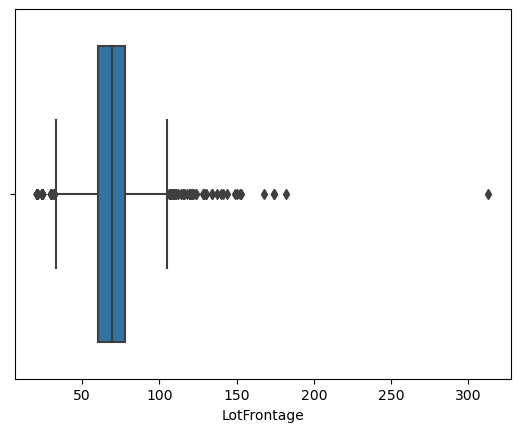

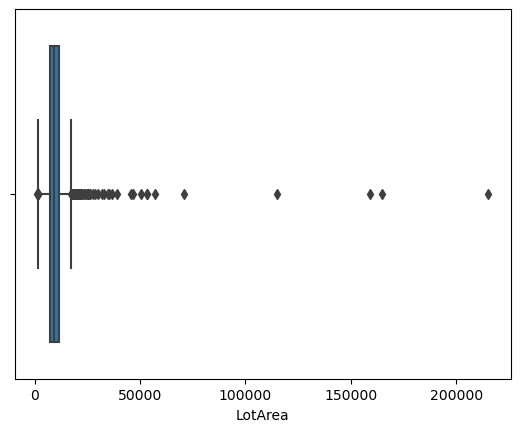

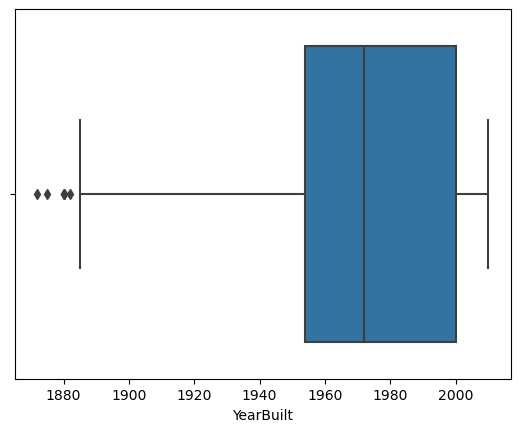

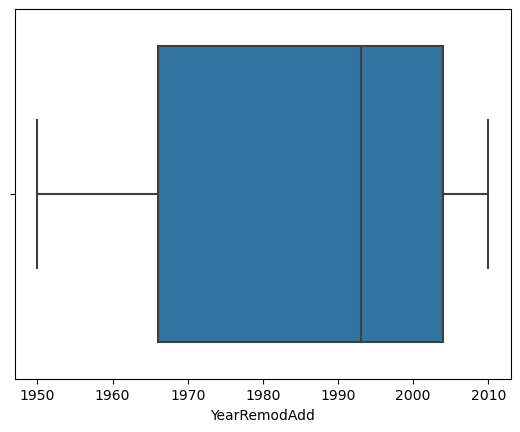

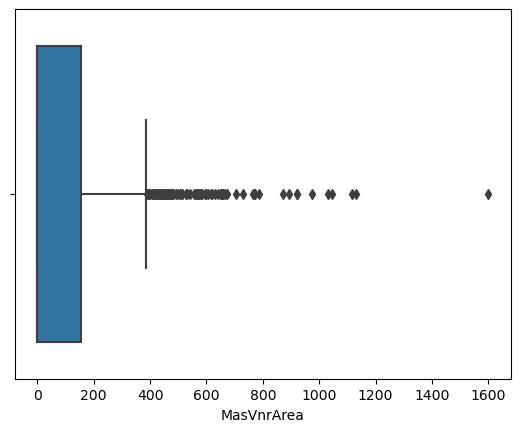

...

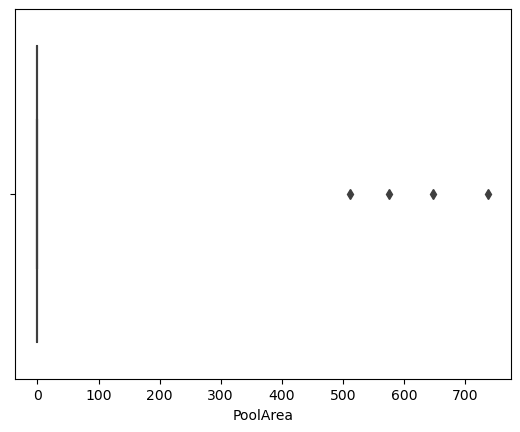

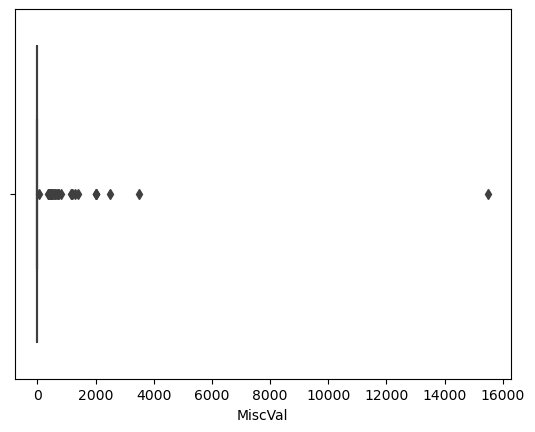

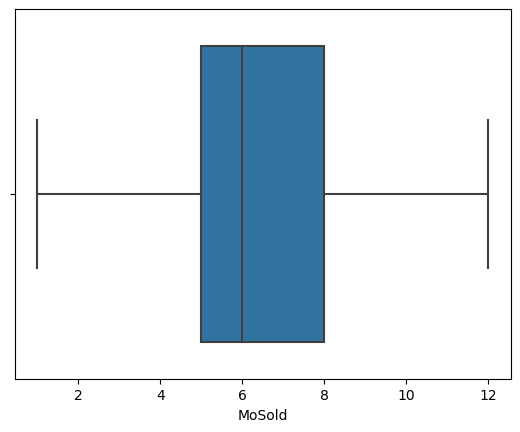

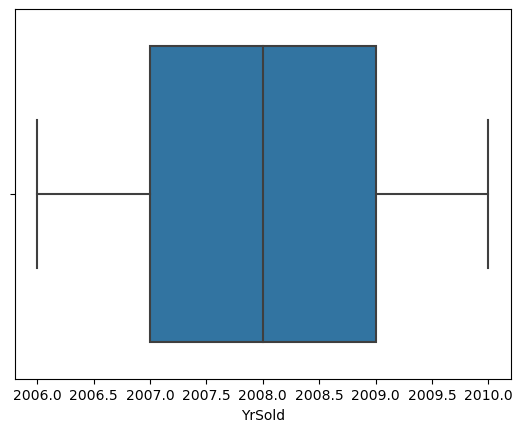

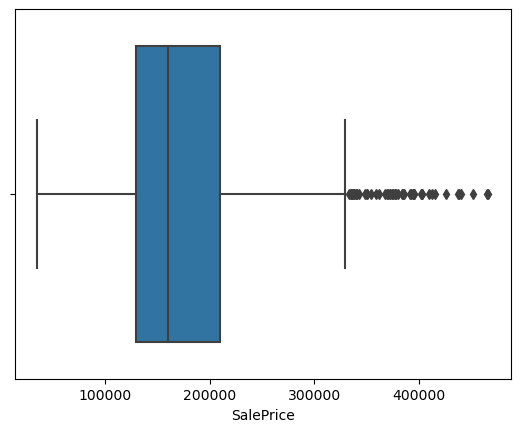

In [71]:
for column_name in numerical_columns:
    box_plot(house[column_name])

<font color='blue'>**Observation**</font> : LotFrontage has 5 points above 160 which we will drop

In [72]:
house = house[house.LotFrontage<=160]

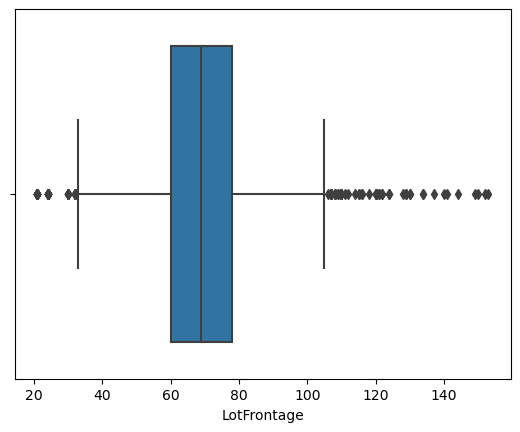

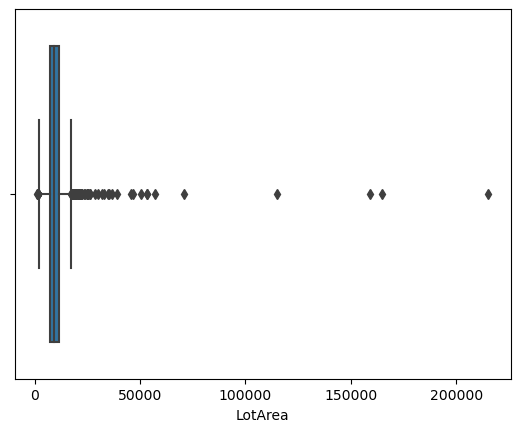

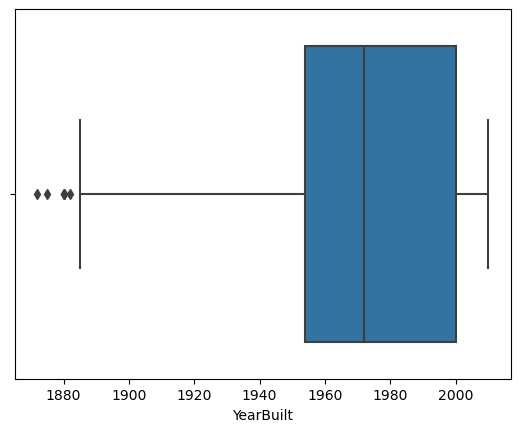

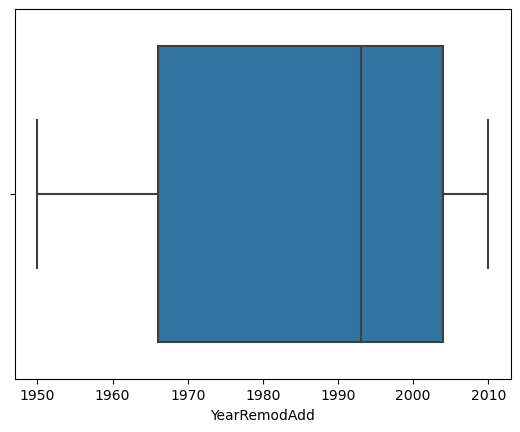

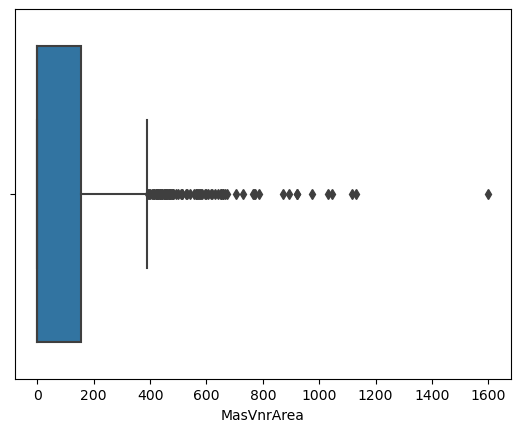

...

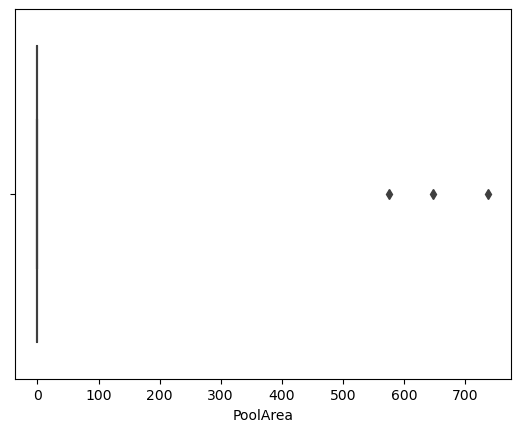

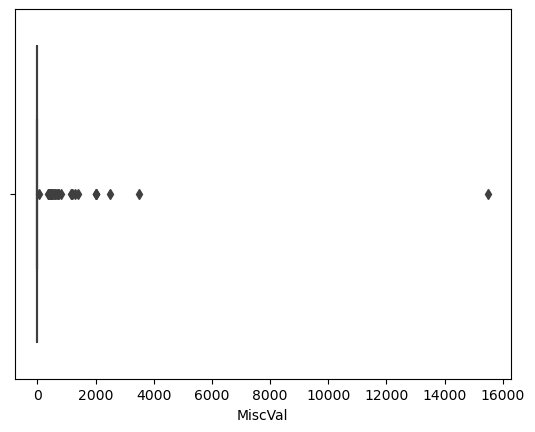

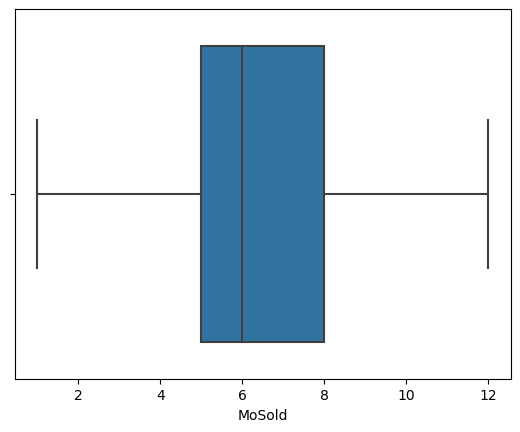

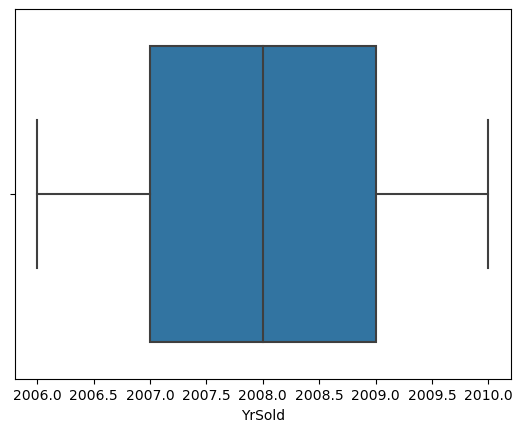

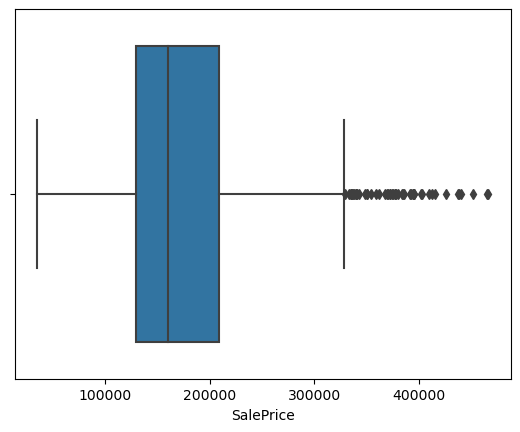

In [73]:
for column_name in numerical_columns:
    box_plot(house[column_name])

<font color='blue'>**Observation**</font> : LotArea has 5 points above 60000 which we will drop

In [74]:
house = house[house.LotArea<=60000]

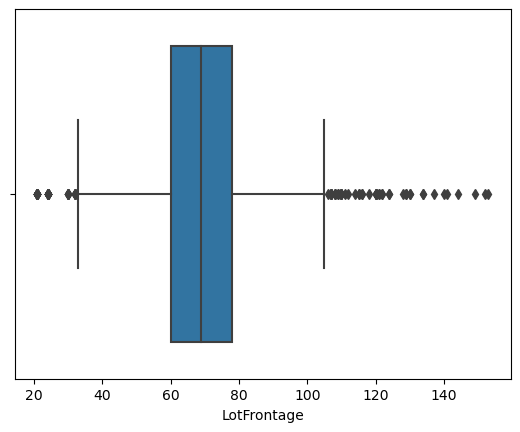

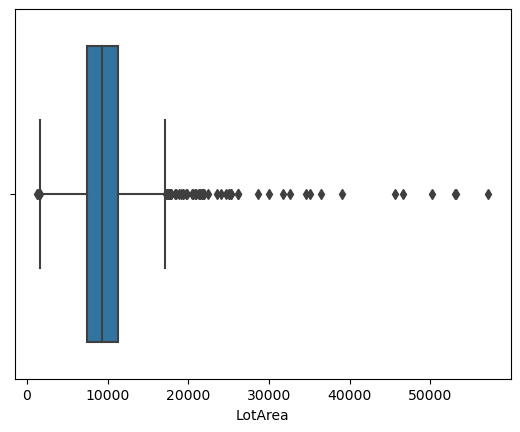

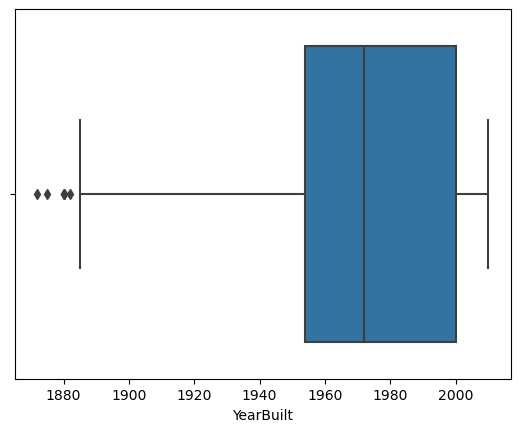

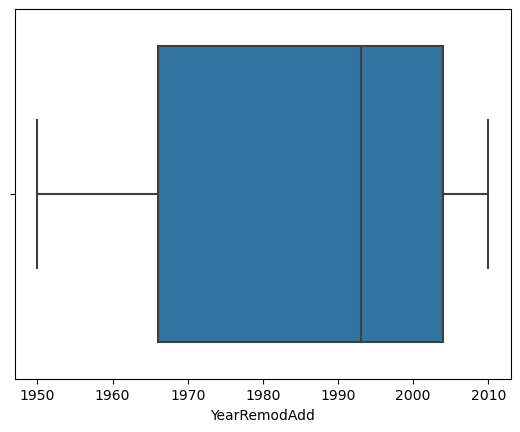

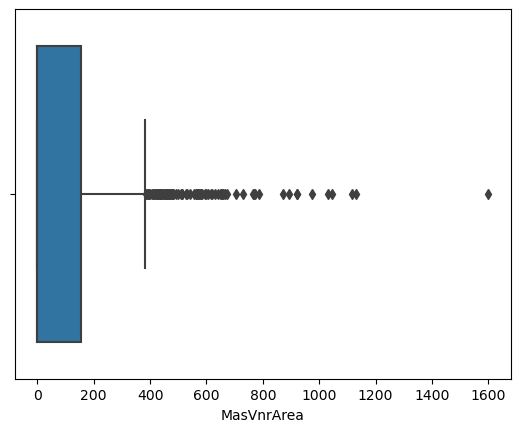

...

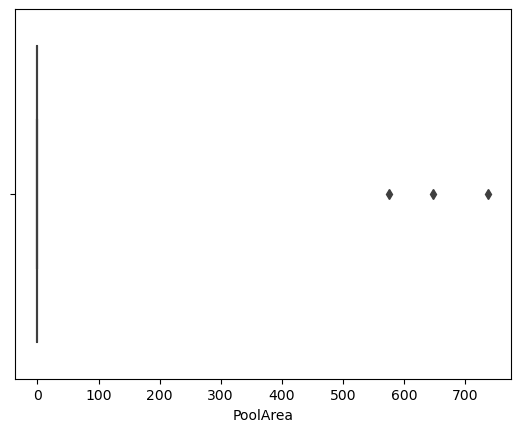

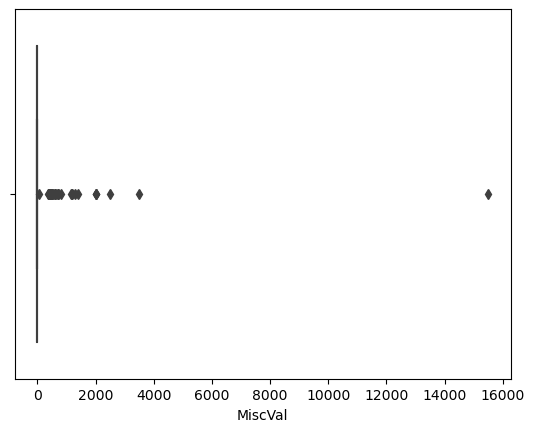

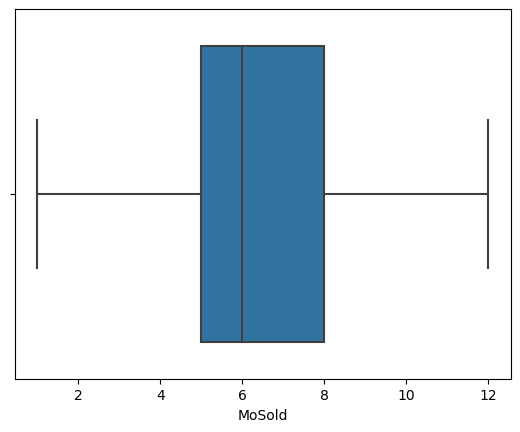

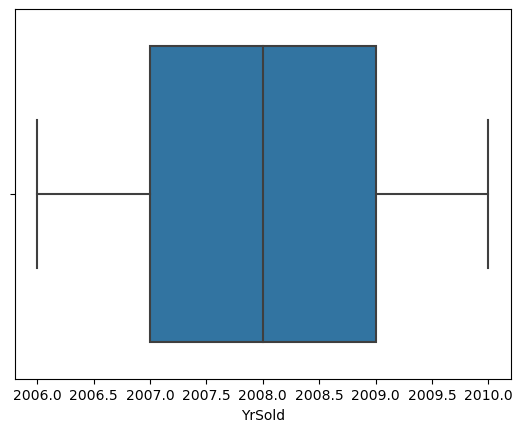

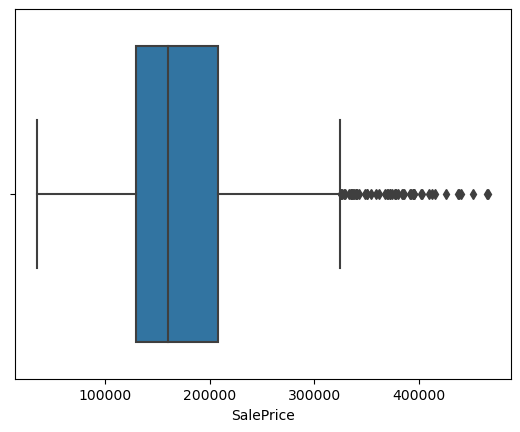

In [75]:
for column_name in numerical_columns:
    box_plot(house[column_name])

<font color='blue'>**Observation**</font> : MasVnrArea has 1 points above 1200 which we will drop

In [76]:
house = house[house.MasVnrArea<=1200]

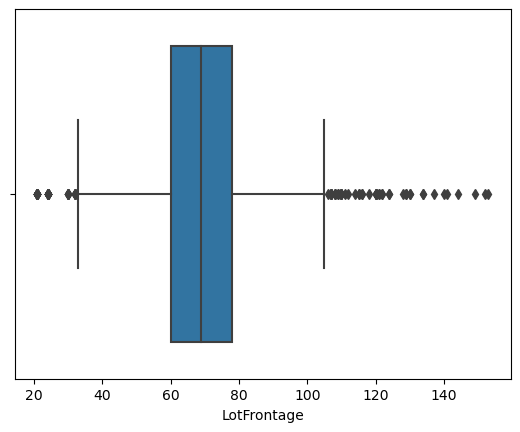

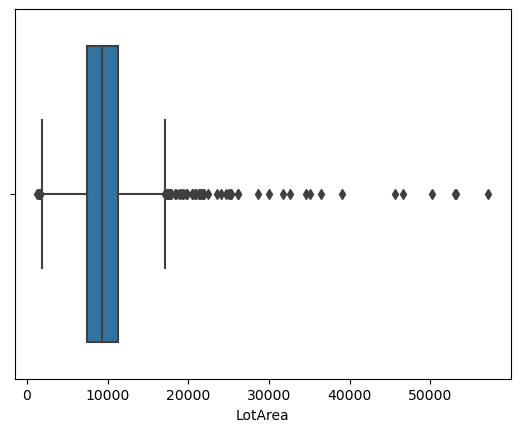

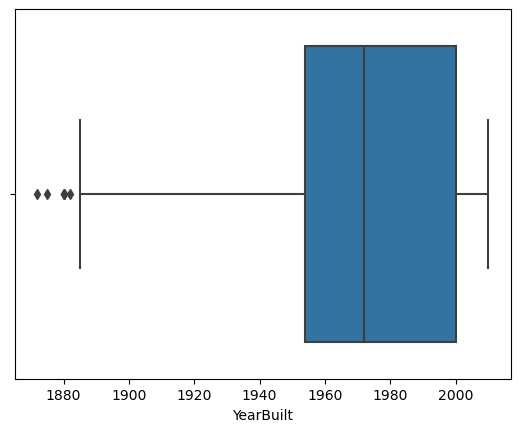

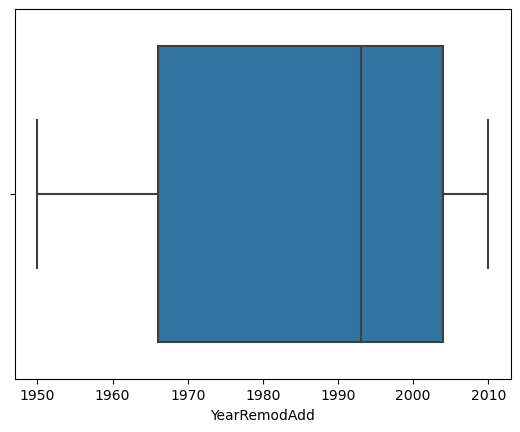

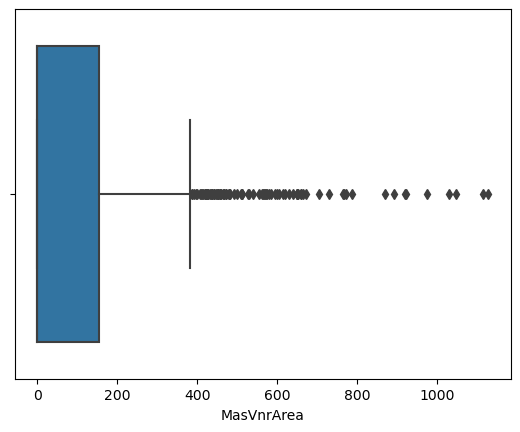

...

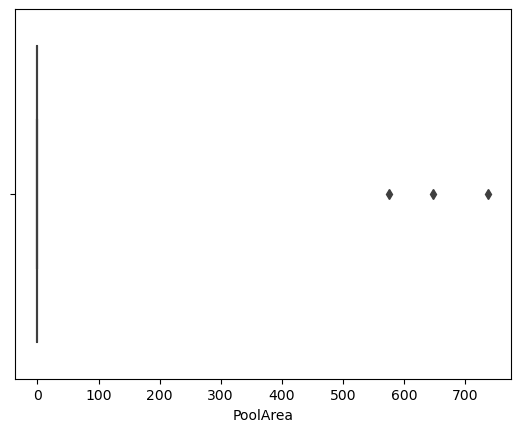

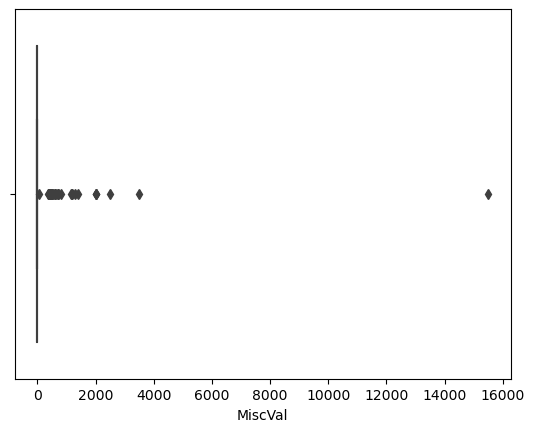

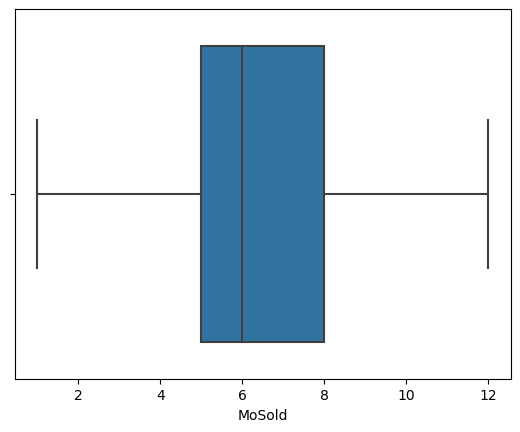

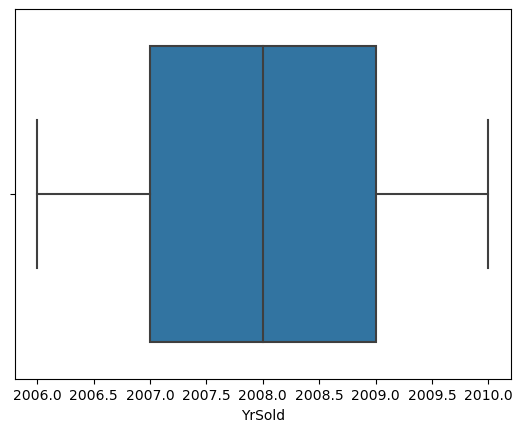

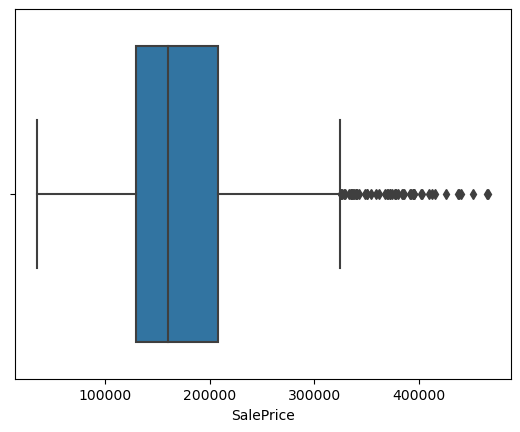

In [77]:
for column_name in numerical_columns:
    box_plot(house[column_name])

<font color='blue'>**Observation**</font> : WoodDeckSF has 5 points above 600 which we will drop

In [78]:
house = house[house.WoodDeckSF<=600]

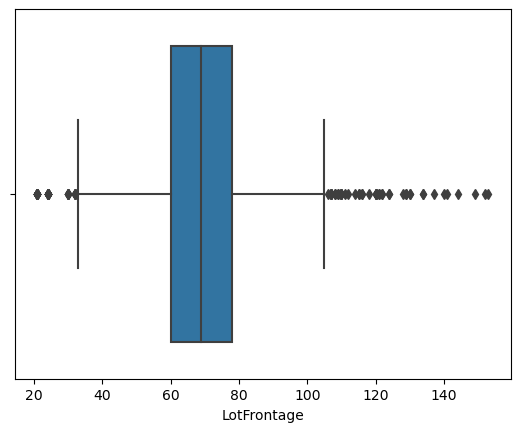

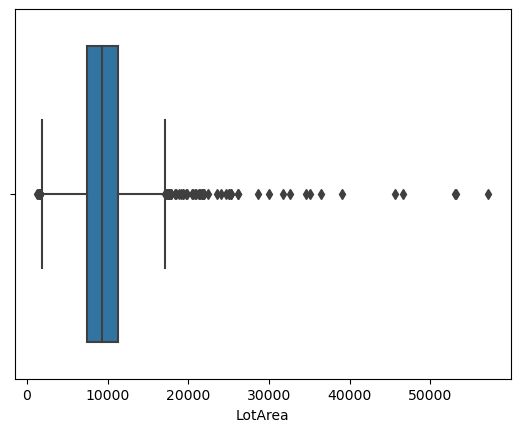

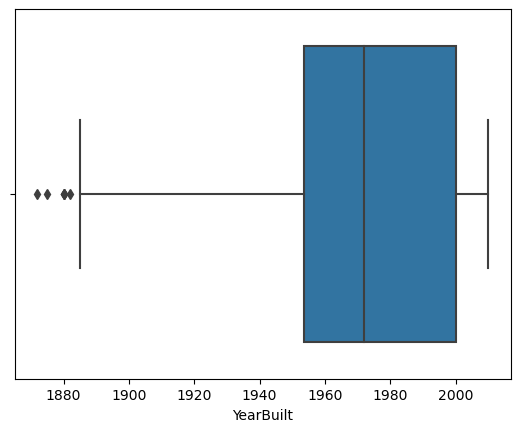

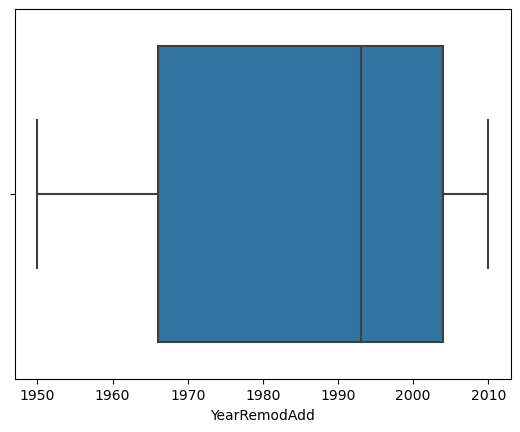

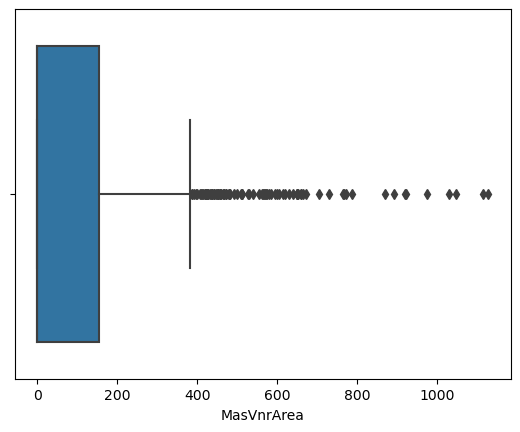

...

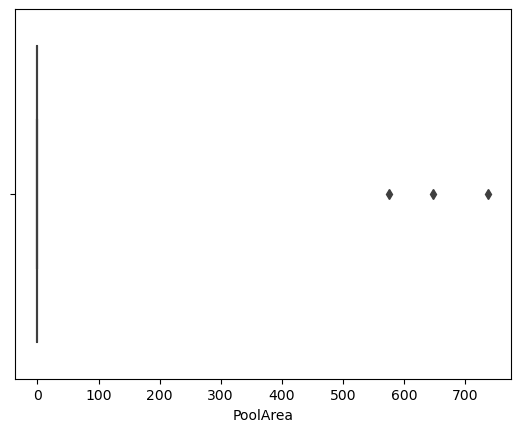

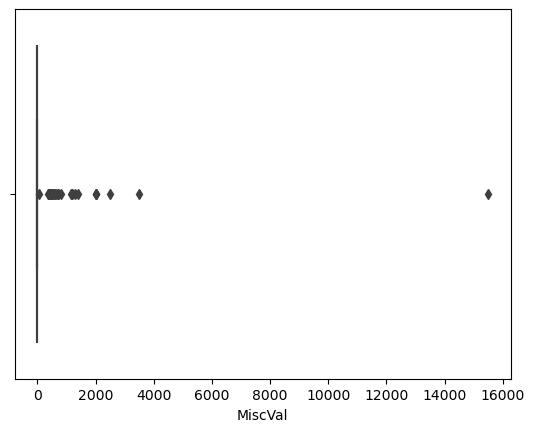

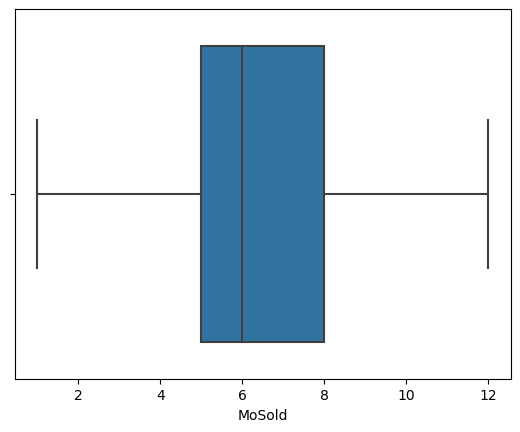

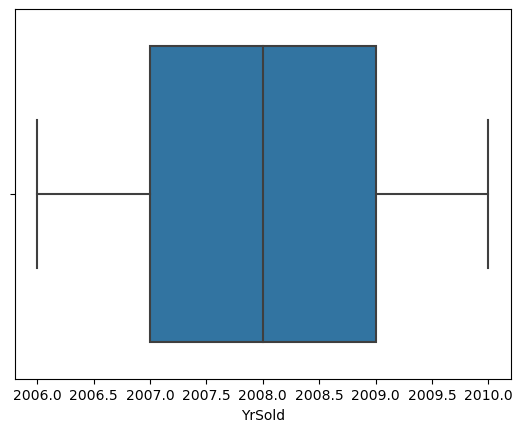

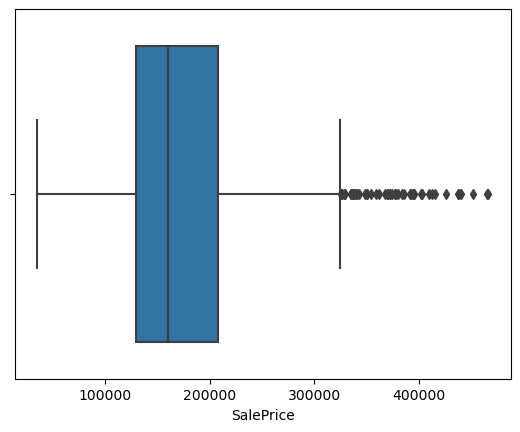

In [79]:
for column_name in numerical_columns:
    box_plot(house[column_name])

<font color='blue'>**Observation**</font> : BsmtFullBath has 1 points above 2 which we will drop

In [80]:
house = house[house.BsmtFullBath<=2]

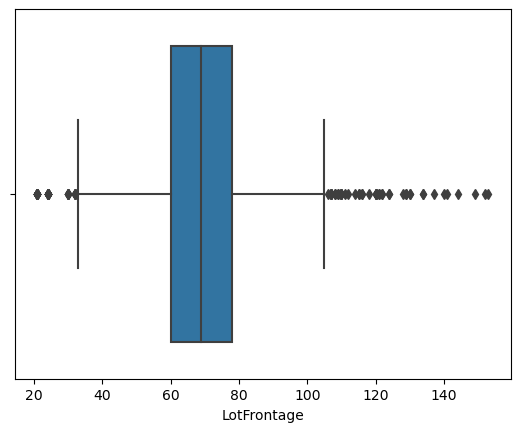

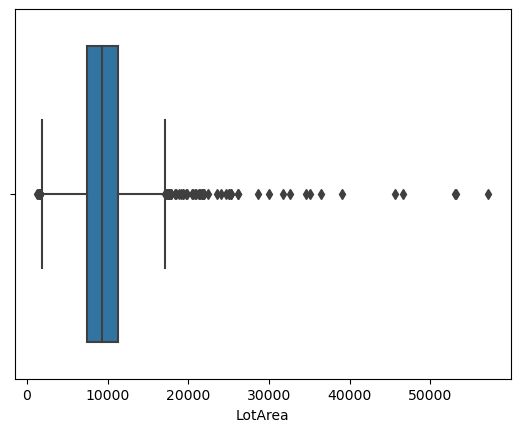

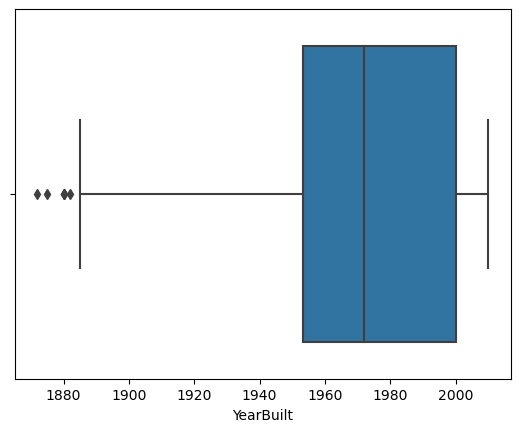

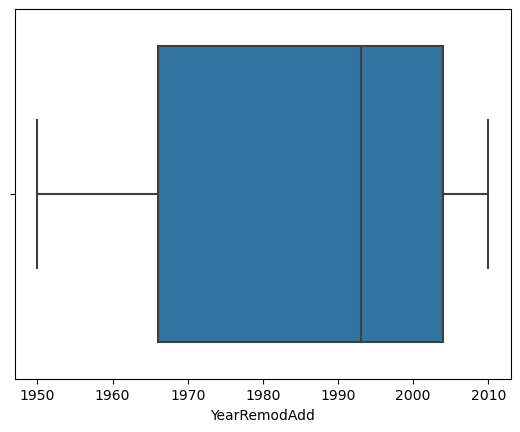

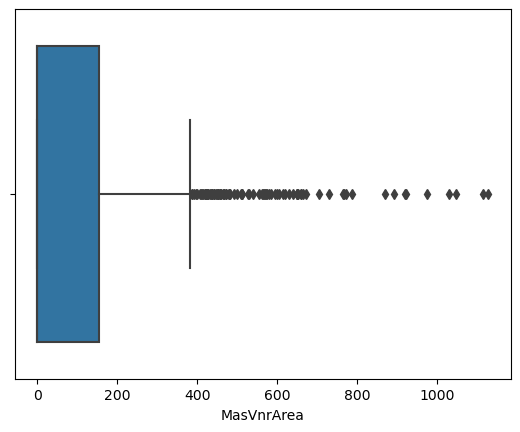

...

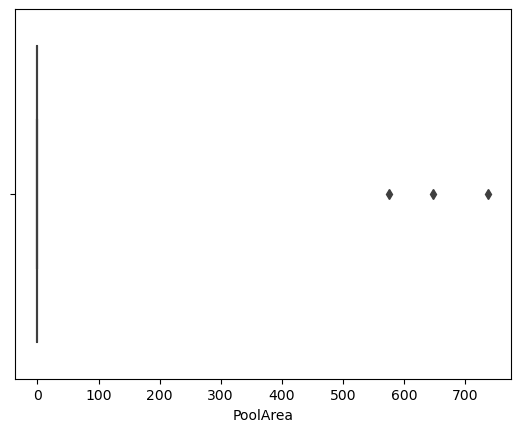

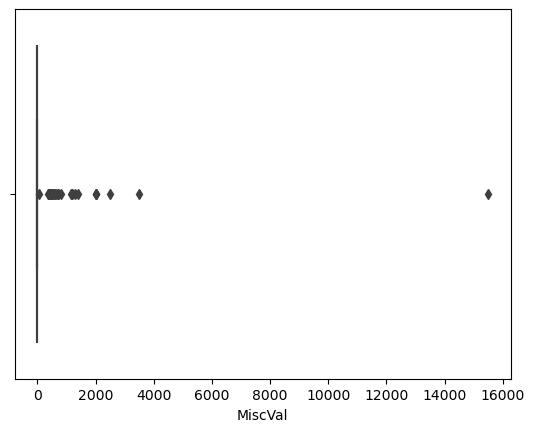

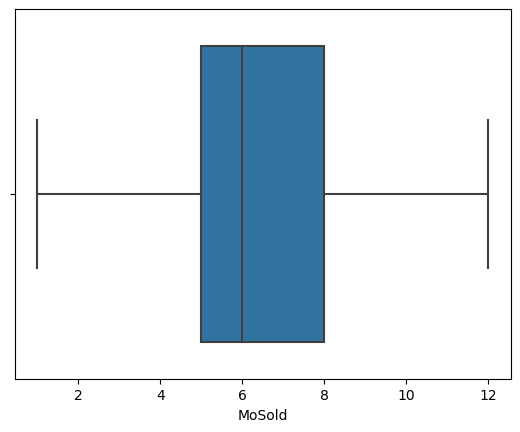

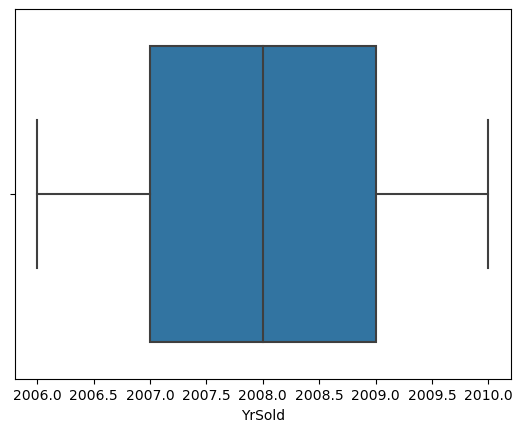

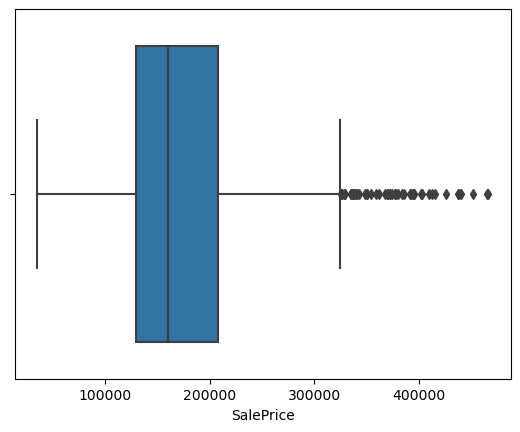

In [81]:
for column_name in numerical_columns:
    box_plot(house[column_name])

<font color='blue'>**Observation**</font> : BsmtFinSF1 has 1 points above 1750 which we will drop

In [82]:
house = house[house.BsmtFinSF1<=1750]

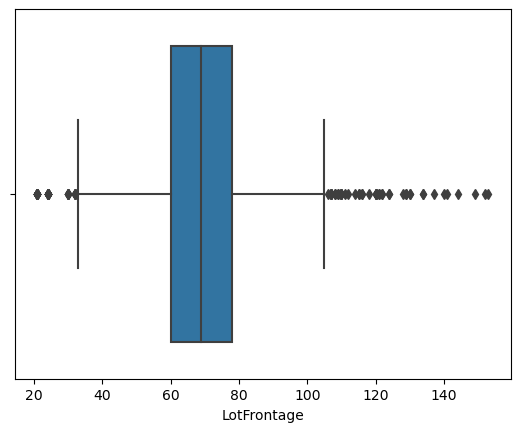

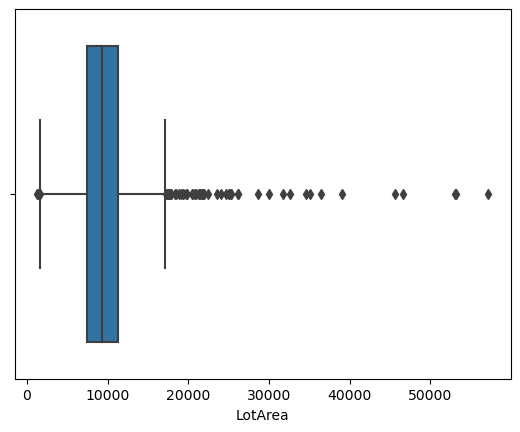

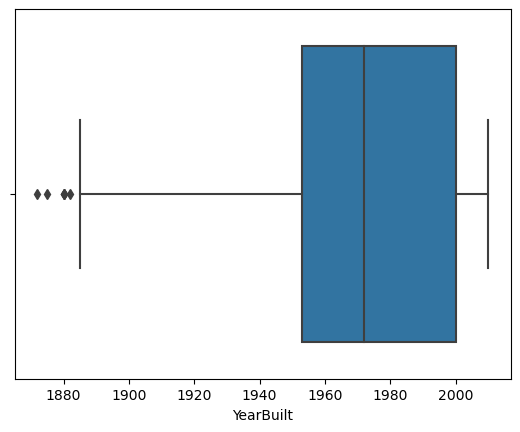

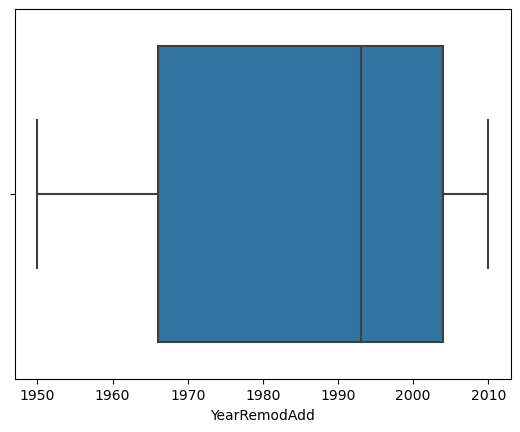

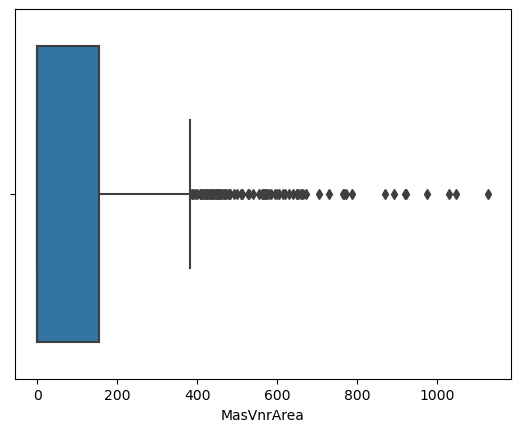

...

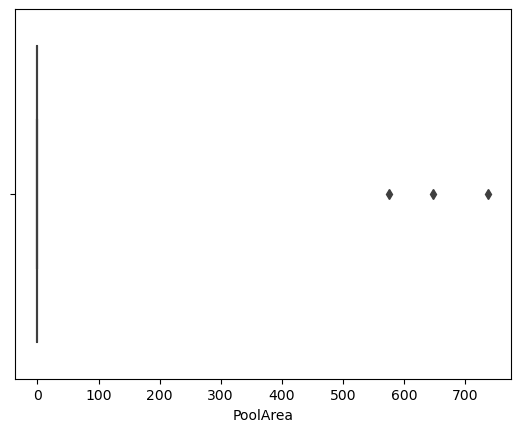

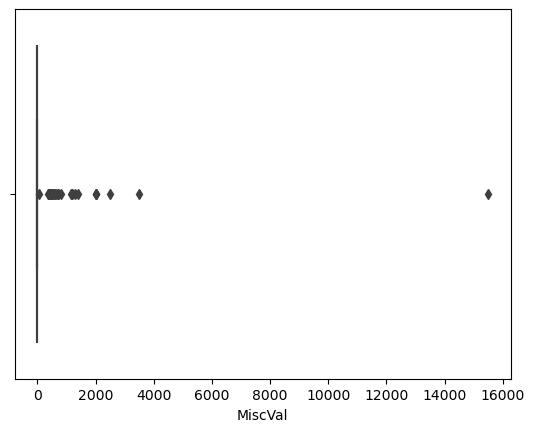

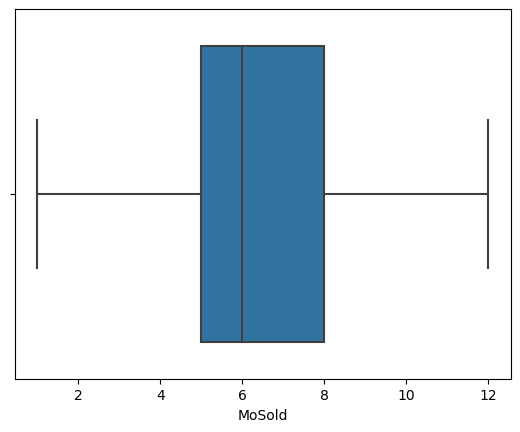

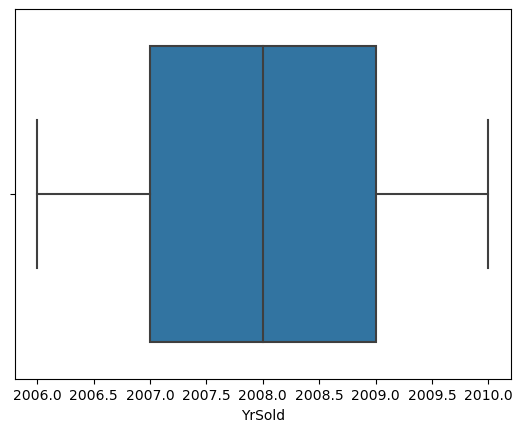

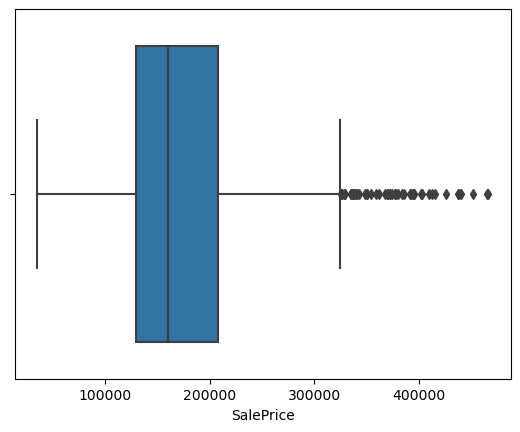

In [83]:
for column_name in numerical_columns:
    box_plot(house[column_name])

<font color='blue'>**Observation**</font> : OpenPorchSF has 4 points above 400 which we will drop

In [84]:
house = house[house.OpenPorchSF<=400]

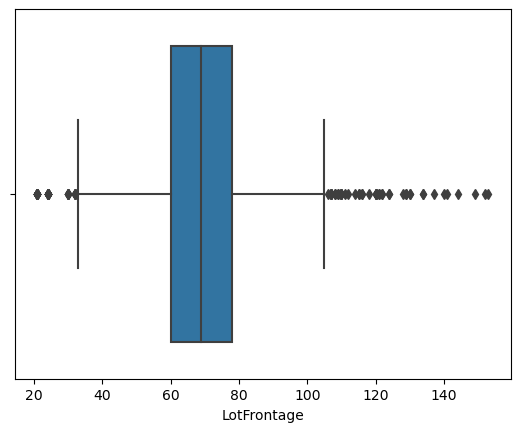

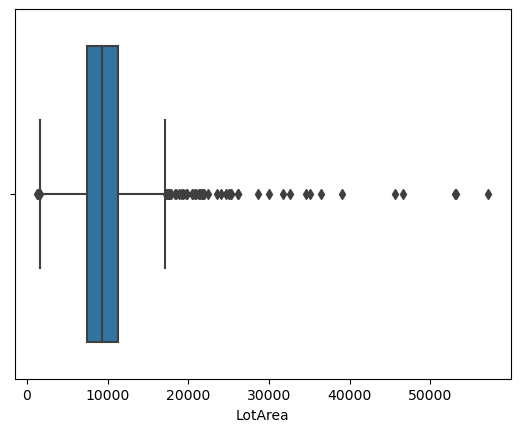

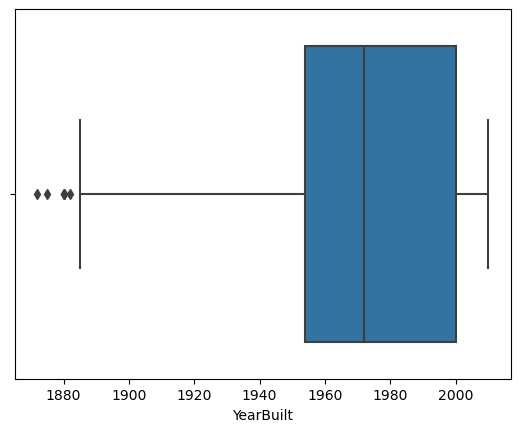

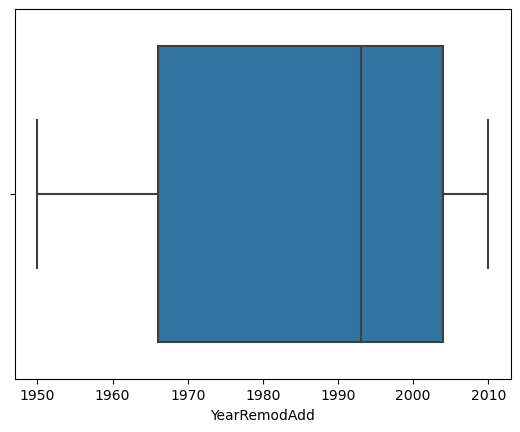

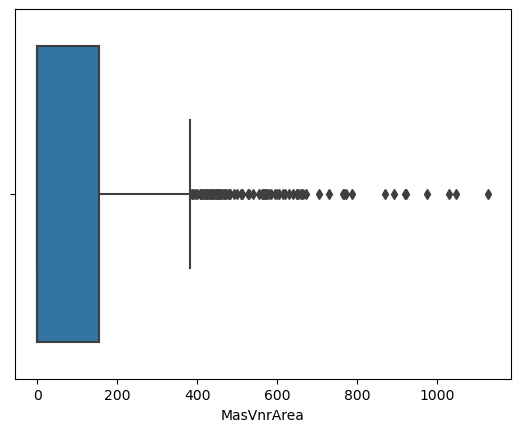

...

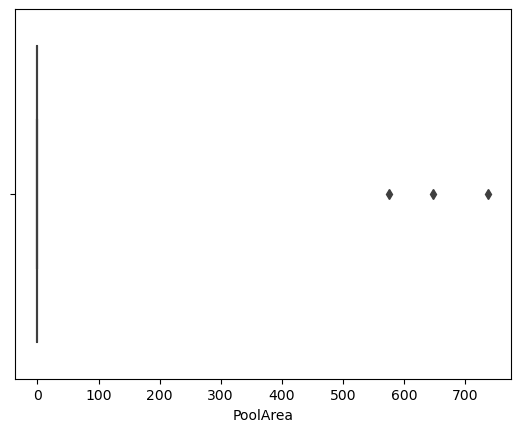

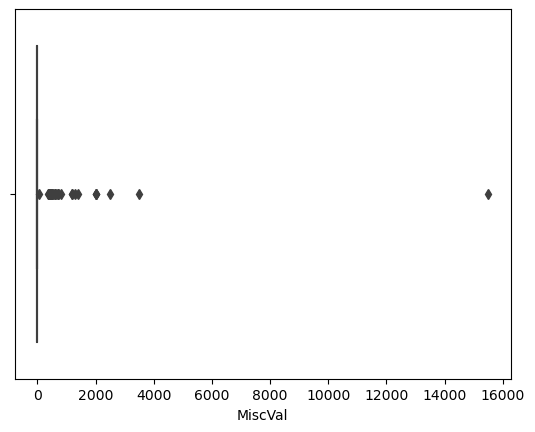

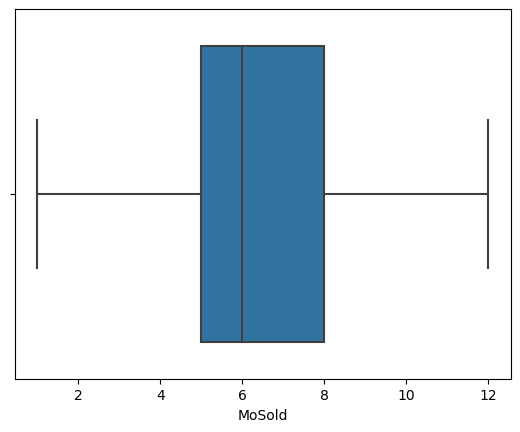

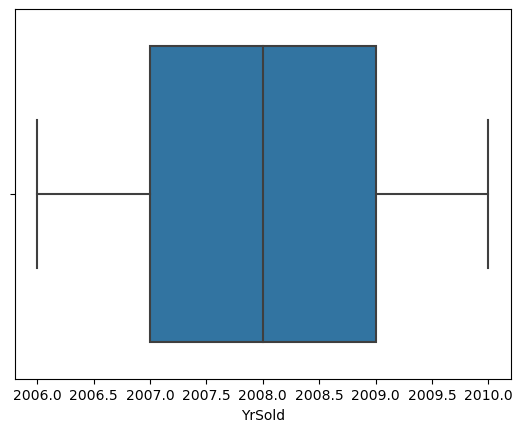

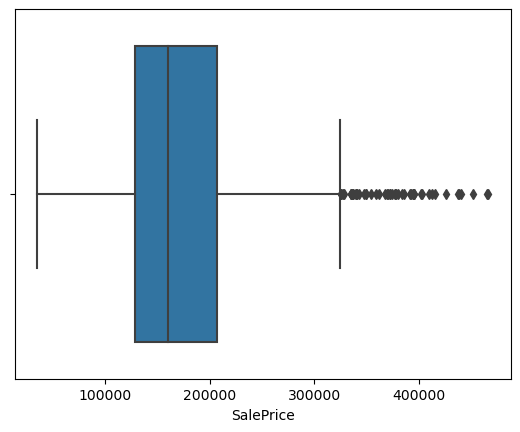

In [85]:
for column_name in numerical_columns:
    box_plot(house[column_name])

<font color='blue'>**Observation**</font> : BsmtFinSF2 has 1 points above 1200 which we will drop<br>
<font color='blue'>**Observation**</font> : 2ndFlrSF has 1 points above 1750 which we will drop

In [86]:
house = house[house.BsmtFinSF2<=1200]
house = house[house["2ndFlrSF"]<=1750]

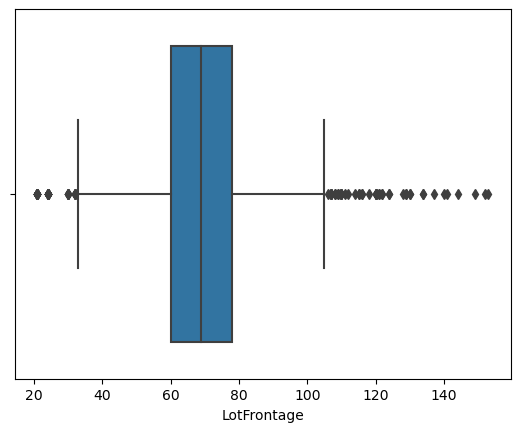

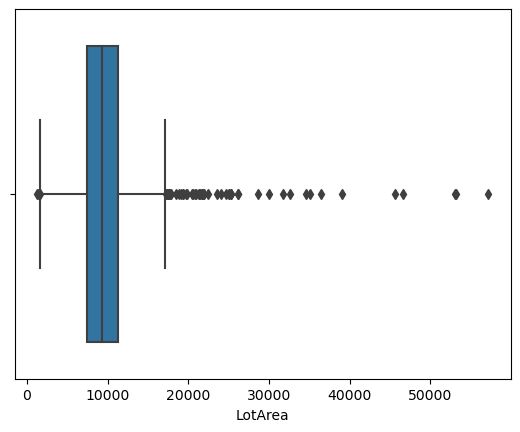

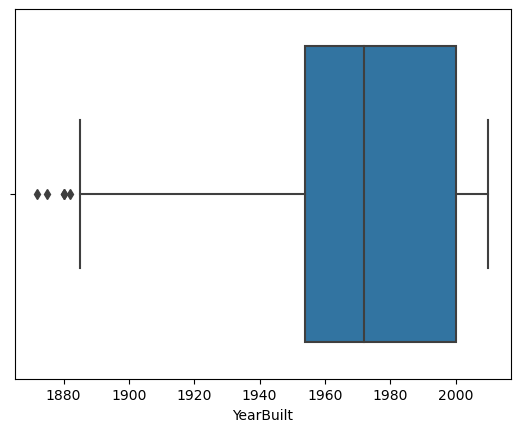

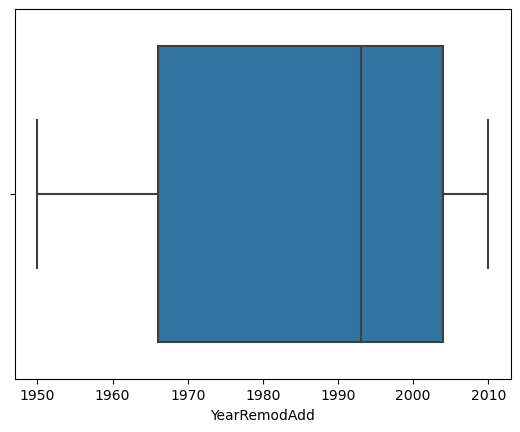

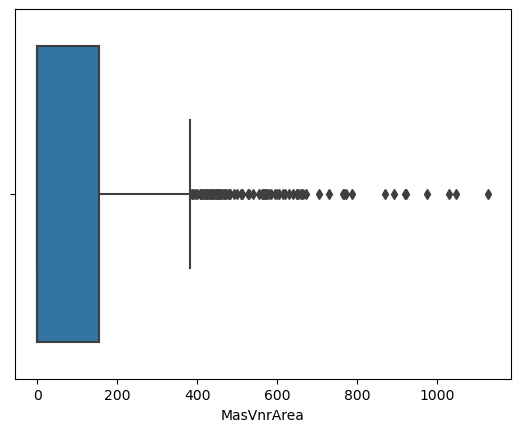

...

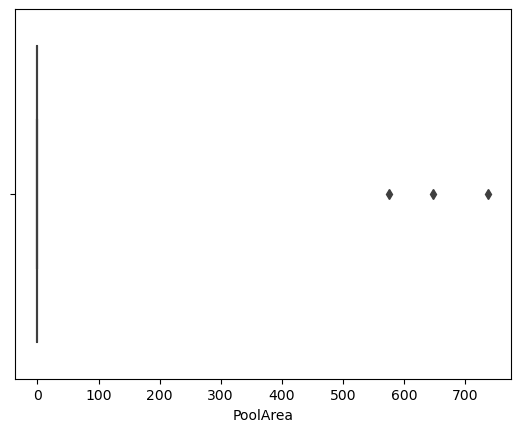

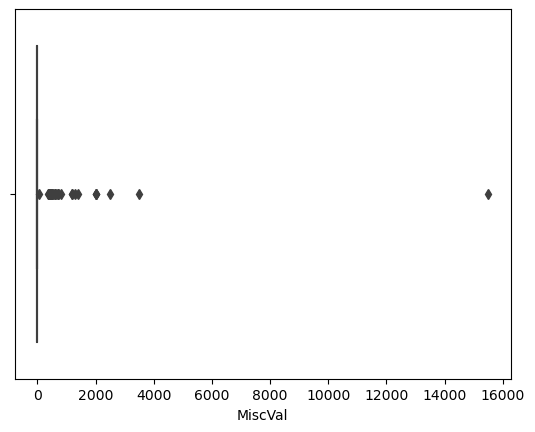

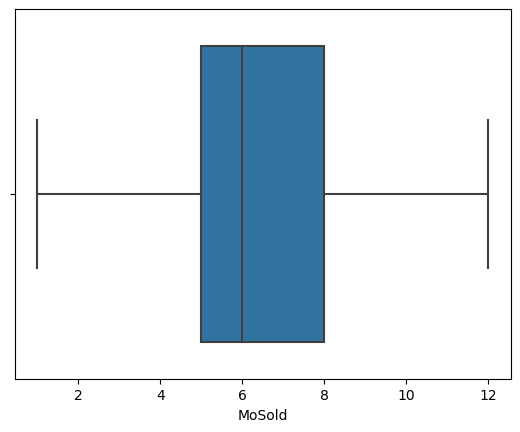

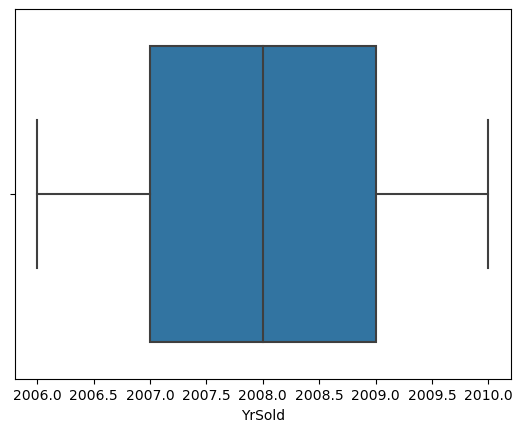

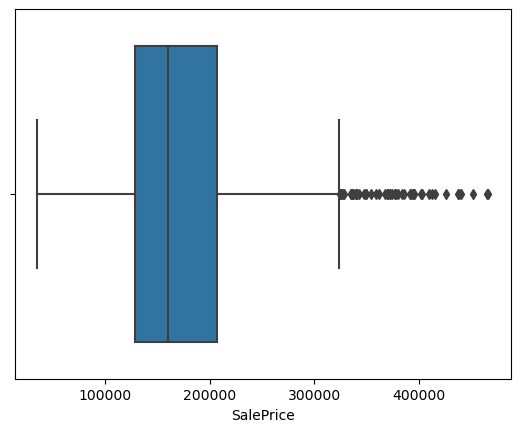

In [87]:
for column_name in numerical_columns:
    box_plot(house[column_name])

<font color='blue'>**Observation**</font> : 1stFlrSF has 5 points above 2300 which we will drop<br>

In [88]:
house = house[house["1stFlrSF"]<=2300]

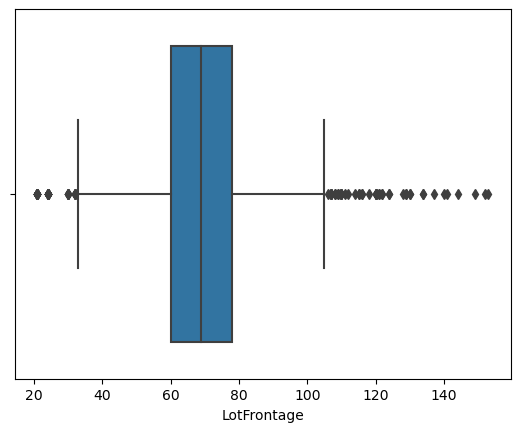

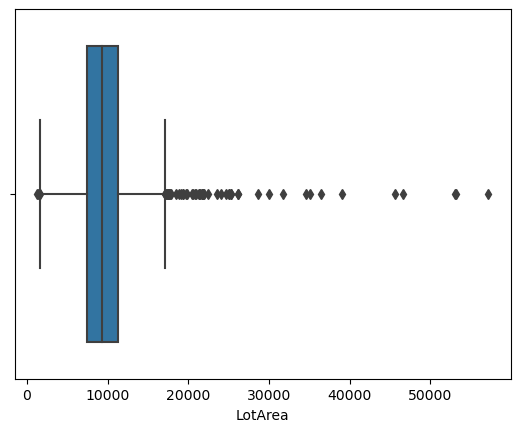

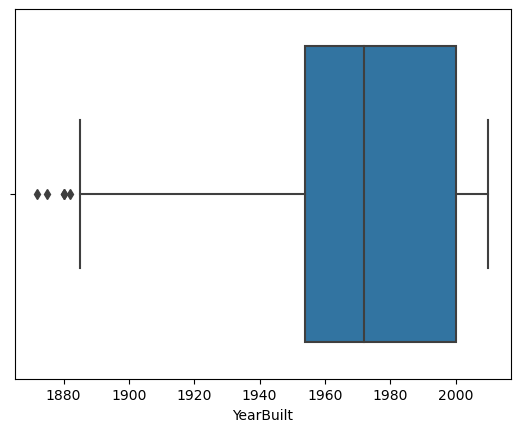

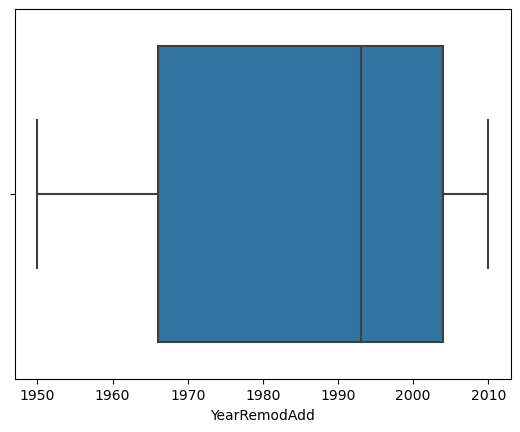

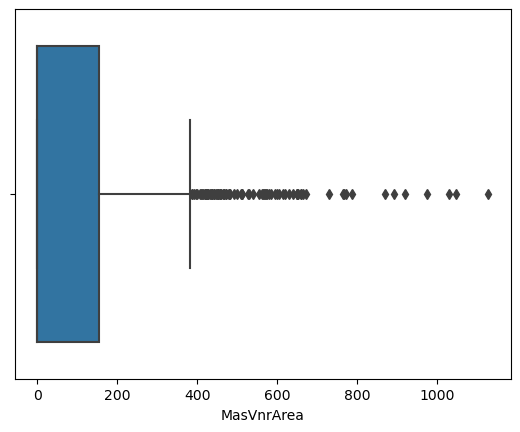

...

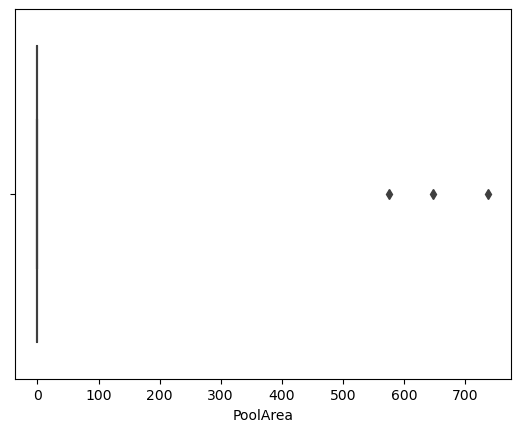

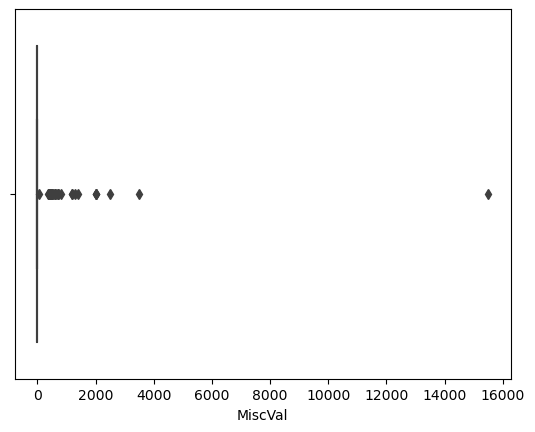

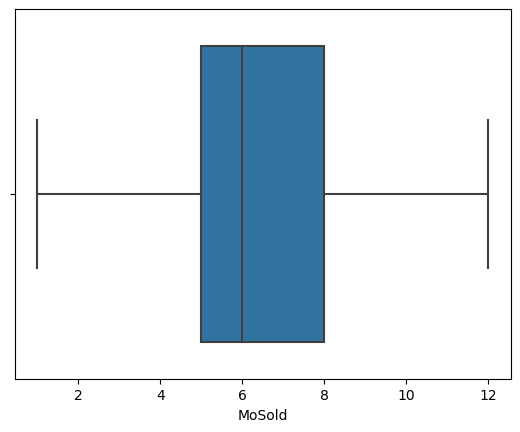

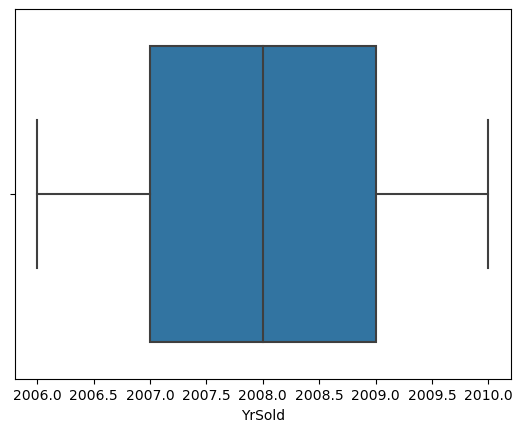

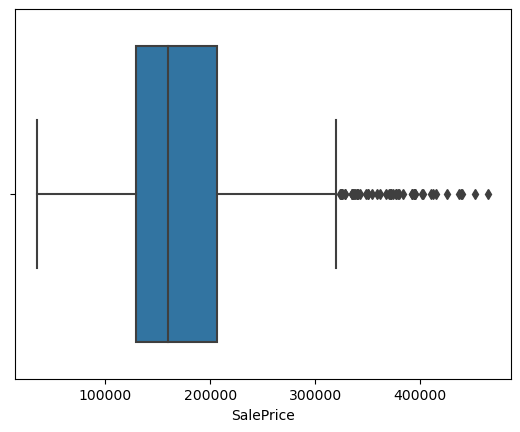

In [89]:
for column_name in numerical_columns:
    box_plot(house[column_name])

<font color='blue'>**Observation**</font> : GrLivArea has 2 points above 3000 which we will drop<br>

In [90]:
house = house[house["GrLivArea"]<=3000]

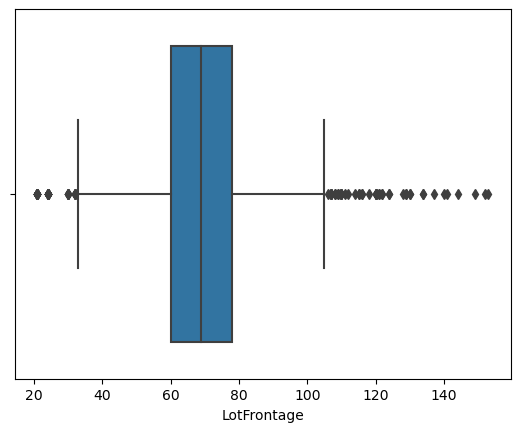

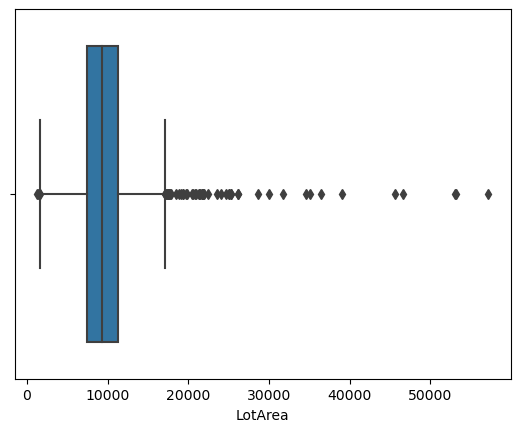

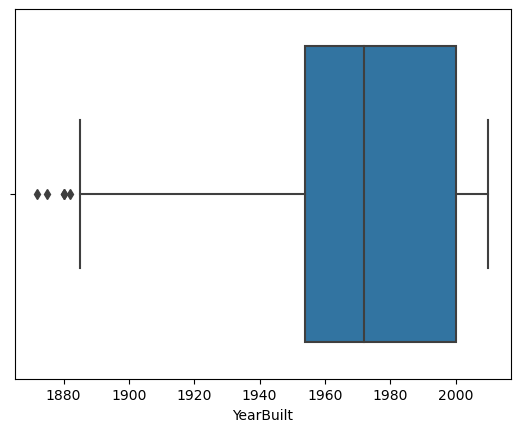

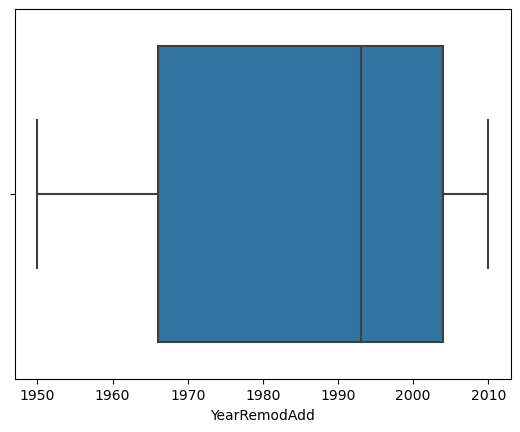

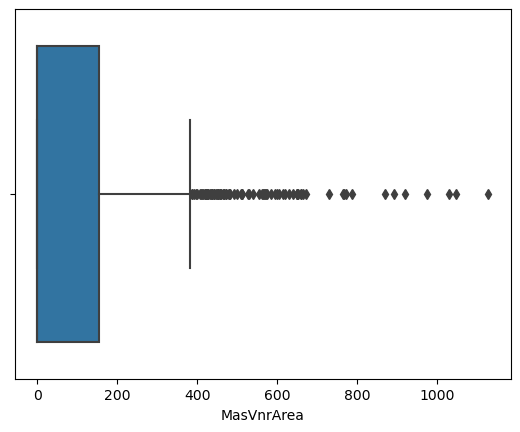

...

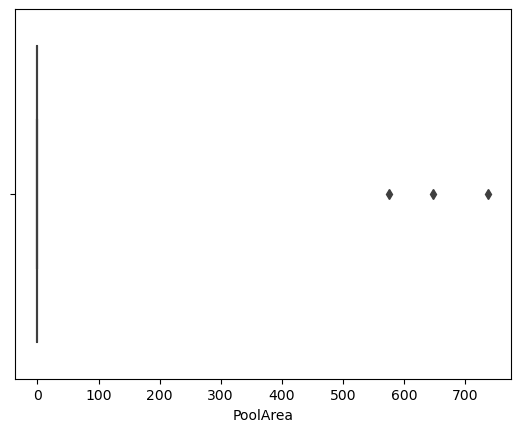

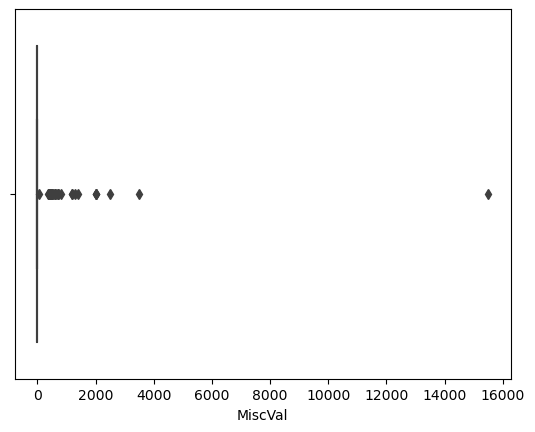

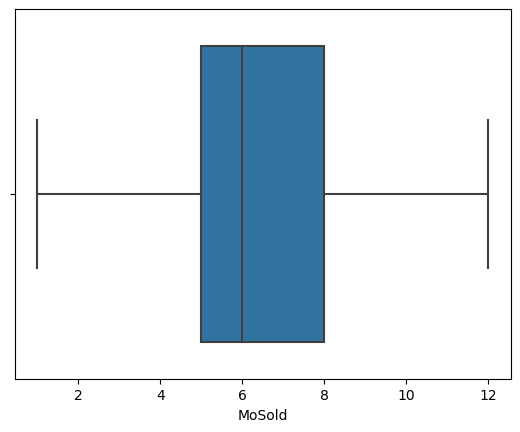

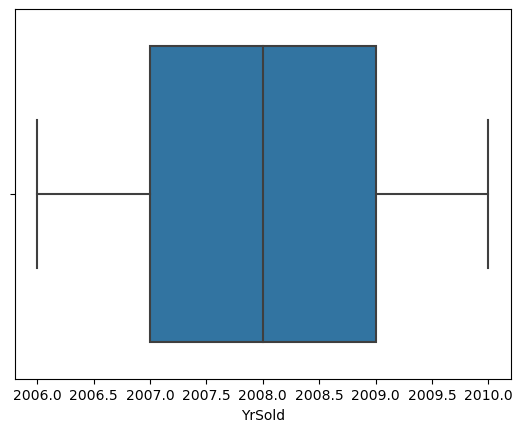

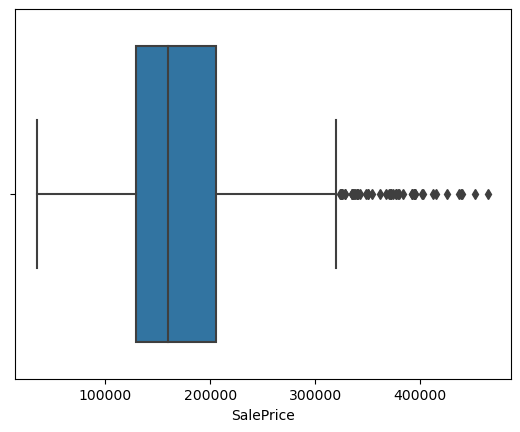

In [91]:
for column_name in numerical_columns:
    box_plot(house[column_name])

#### Using Categorical variables

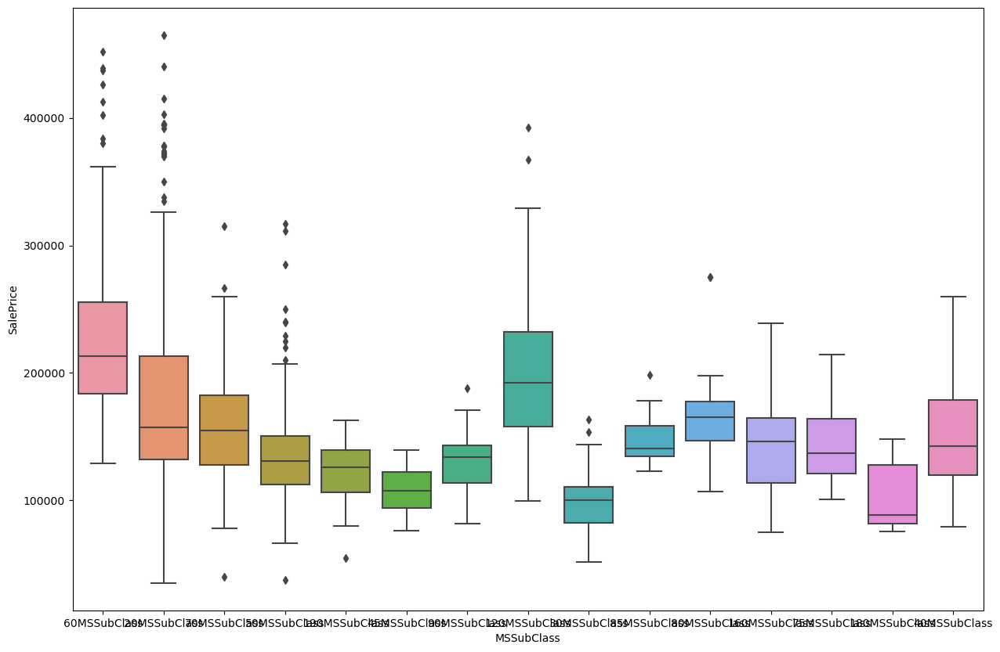

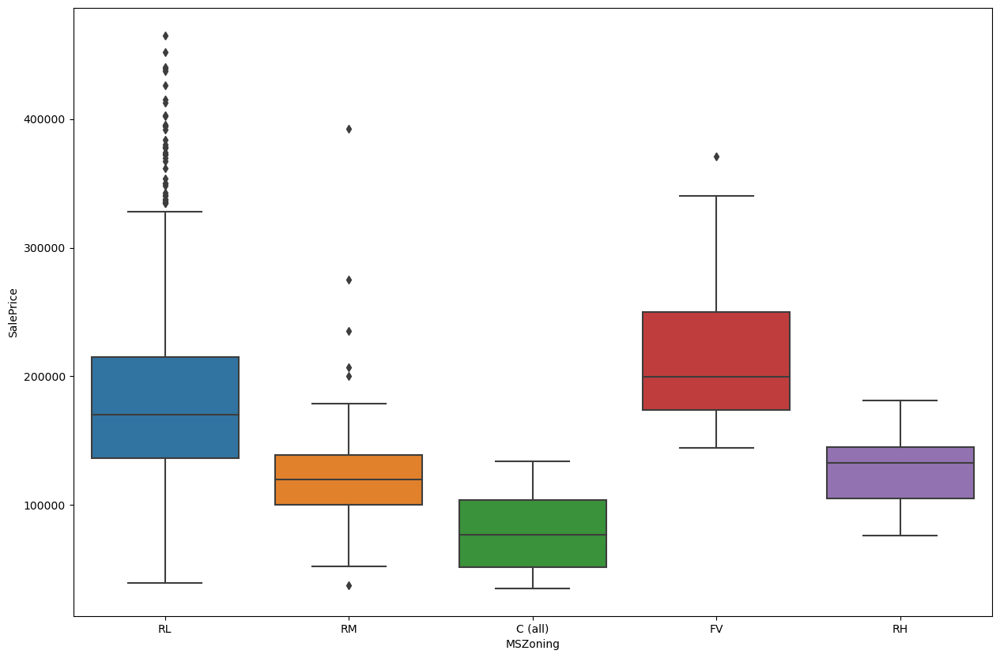

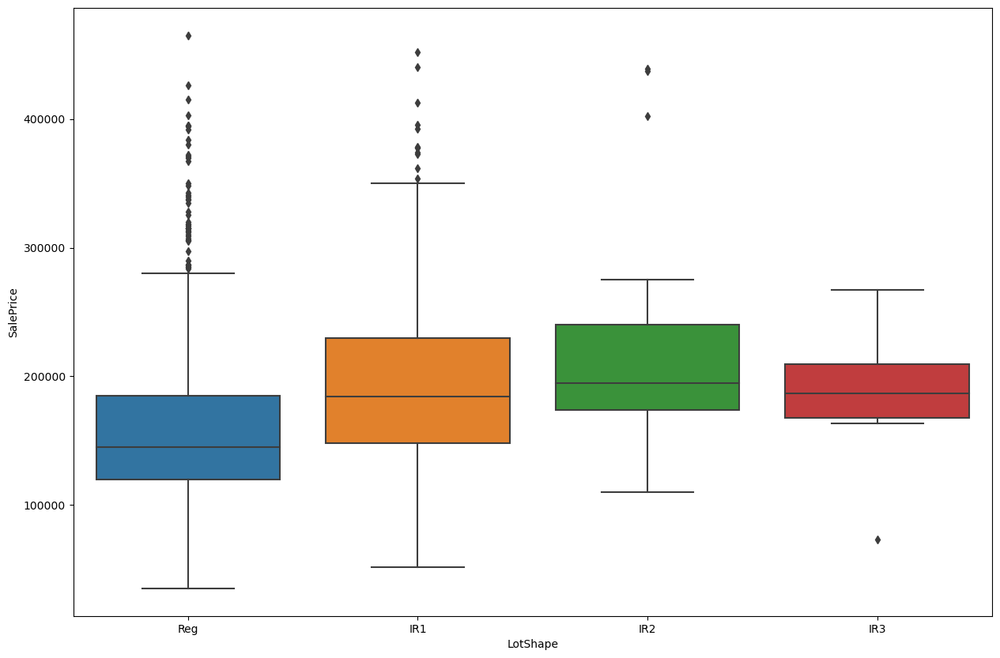

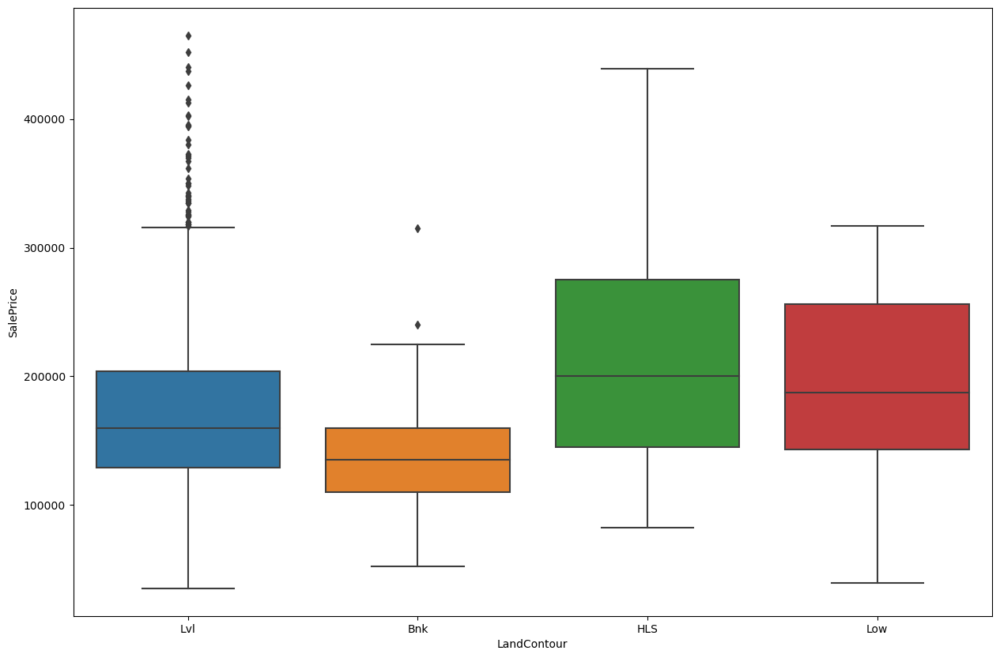

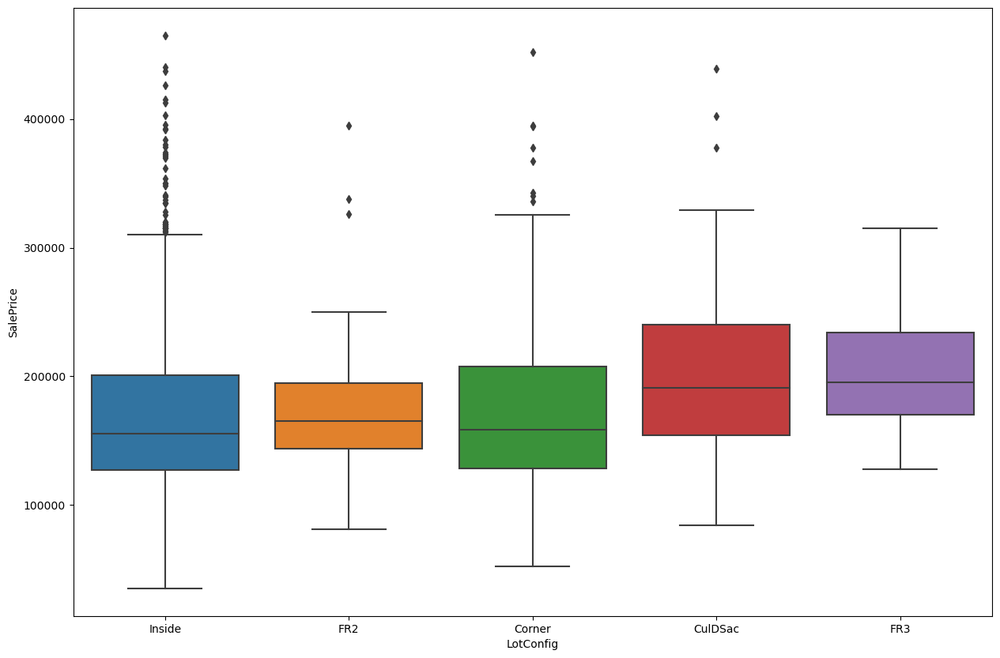

...

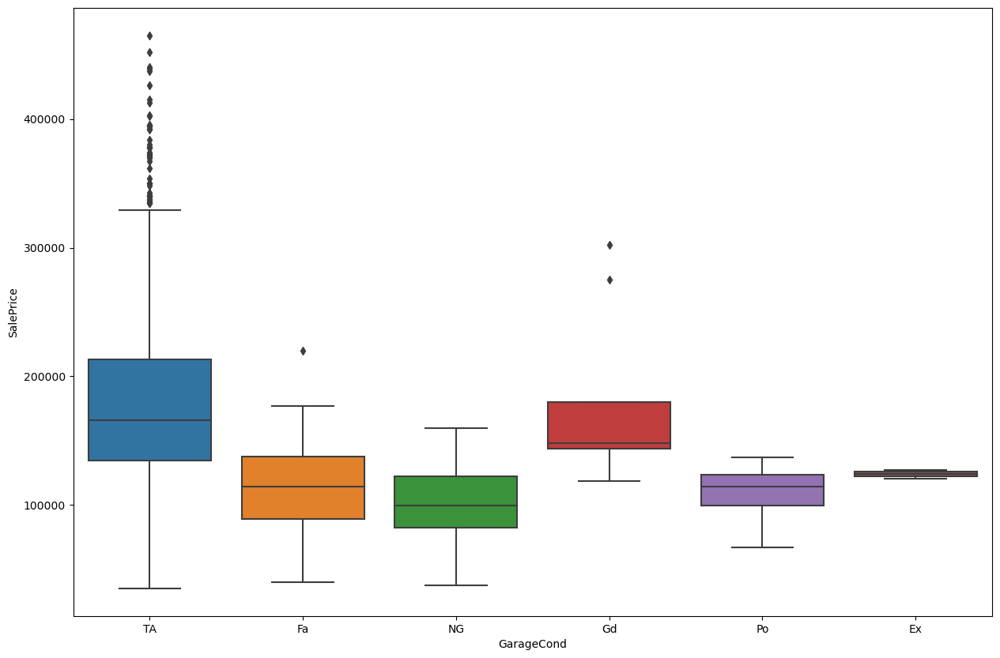

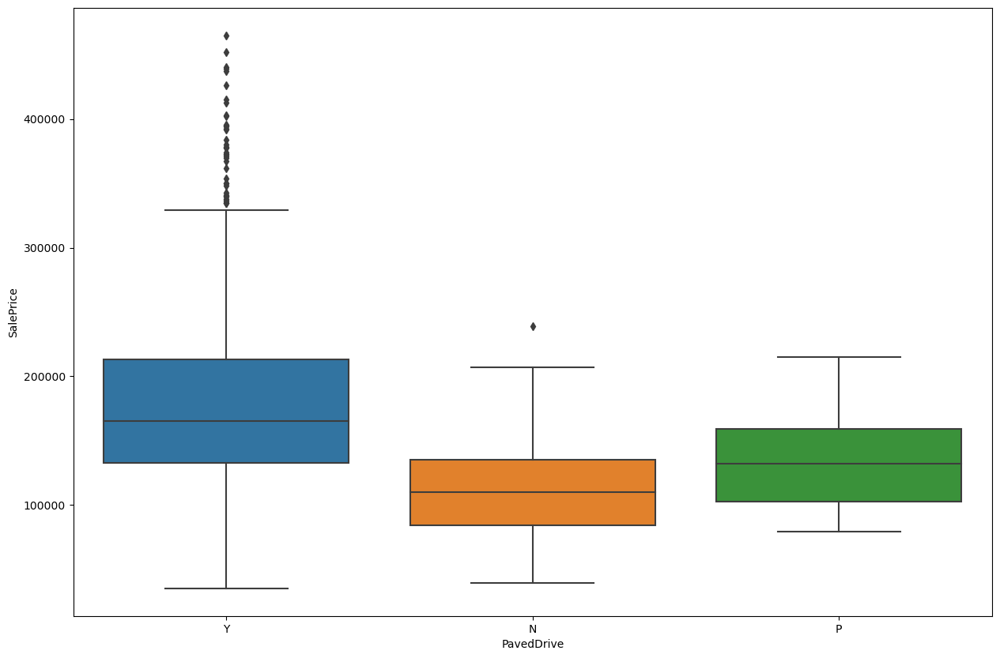

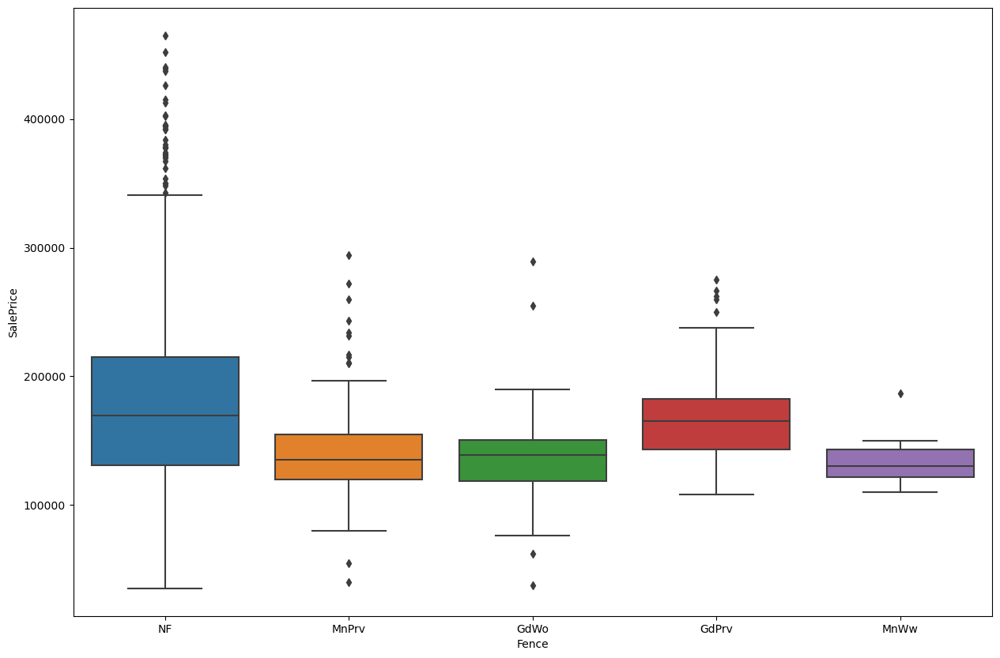

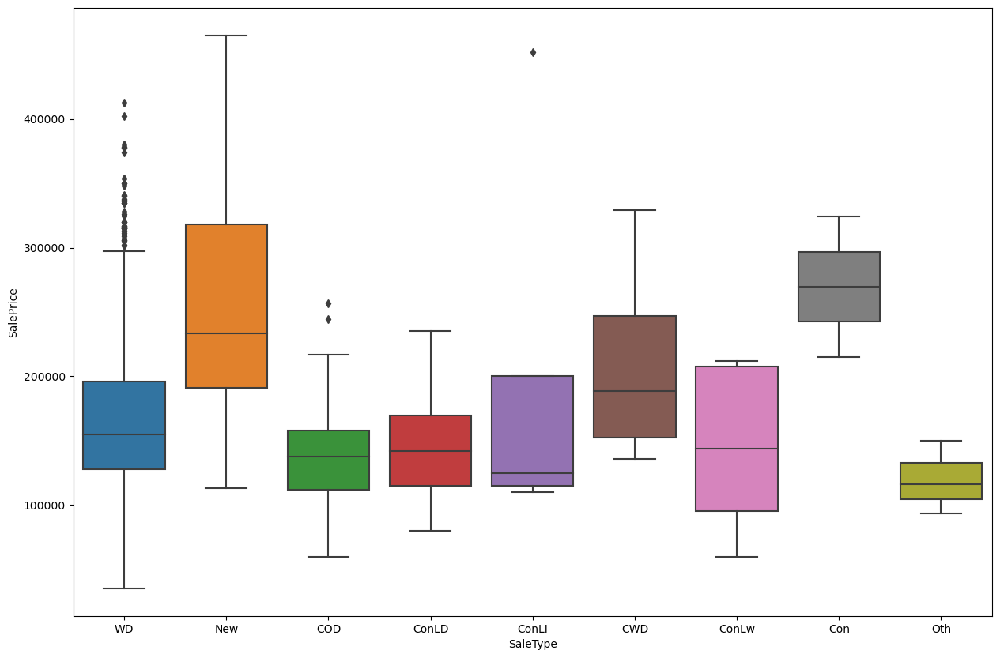

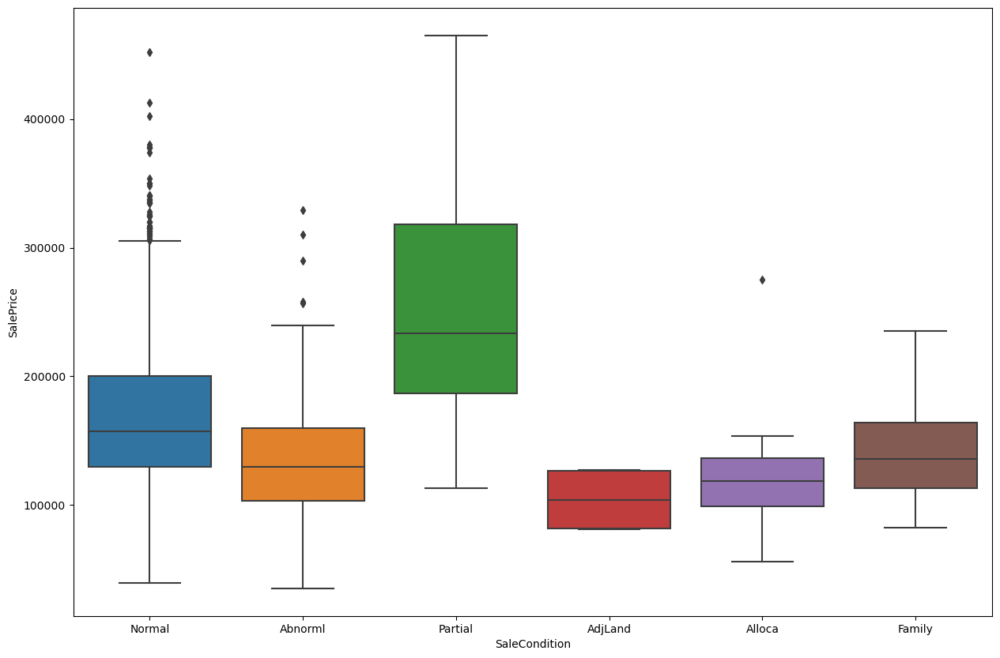

In [92]:
# Plotting all categorical variables in box plot
for col in categorical_columns:
    plt.figure(figsize=(15, 10))
    sns.boxplot(y="SalePrice",x=col, data=house)
    plt.show()


<font color='blue'>**Observation**</font> : We drop multiple outliers in this step based on our charts, <br>
**SaleCondition** : Alloca has a outlier above 200,000 <br>
**SaleType** : ConLI has a outlier above 400,000 <br>
**PavedDrive** : N has a outlier above 200,000 <br>
**Foundation** : Stone has a outlier above 200,000 <br>
**OverallCond** : 2OverallCond has a outlier above 200,000 <br>
**LotShape** : IR3 has a outlier below 100,000

In [93]:
house = house[~((house["SaleCondition"] == 'Alloca') & (house.SalePrice>200000))]
house = house[~((house["SaleType"] == 'N') & (house.SalePrice>200000)) ]
house = house[~((house["PavedDrive"] == 'Alloca') & (house.SalePrice>200000)) ]
house = house[~((house["Foundation"] == 'Stone') & (house.SalePrice>200000)) ]
house = house[~((house["OverallCond"] == '2OverallCond') & (house.SalePrice>200000)) ]
house = house[~((house["LotShape"] == 'IR3') & (house.SalePrice<100000)) ]


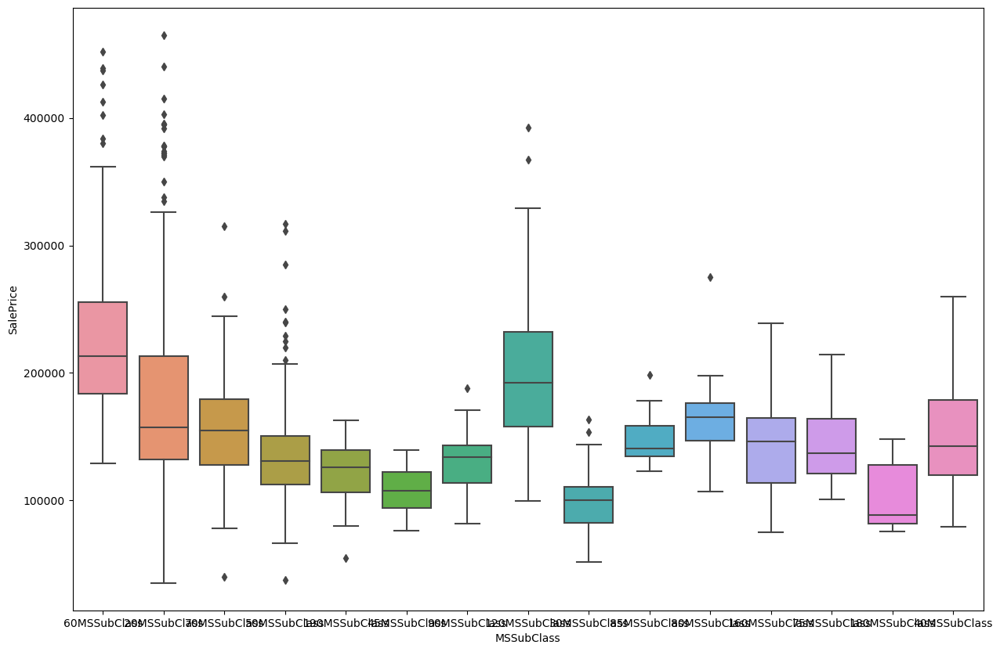

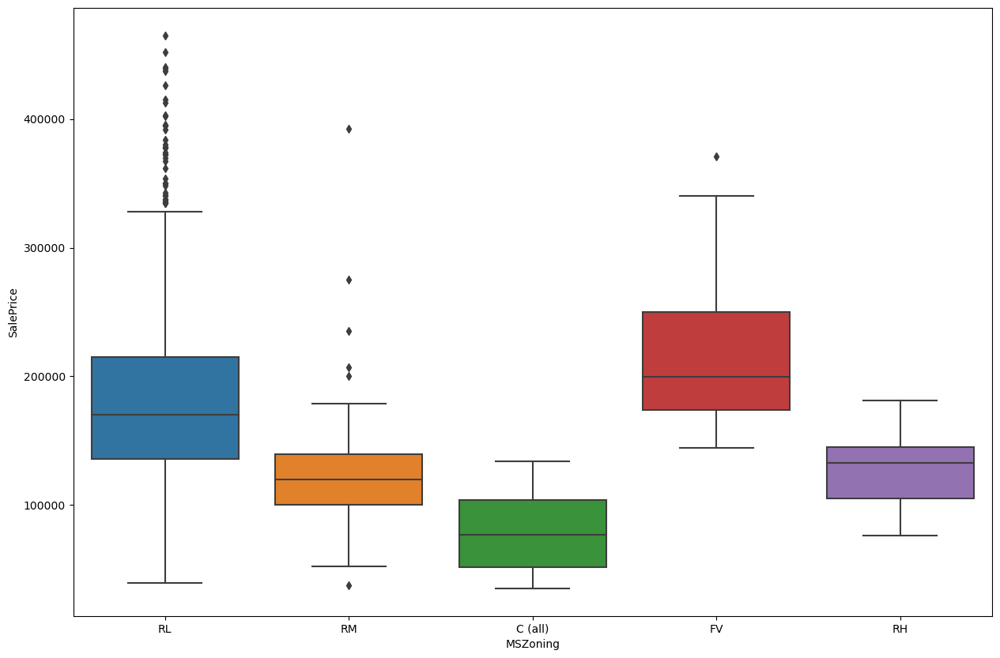

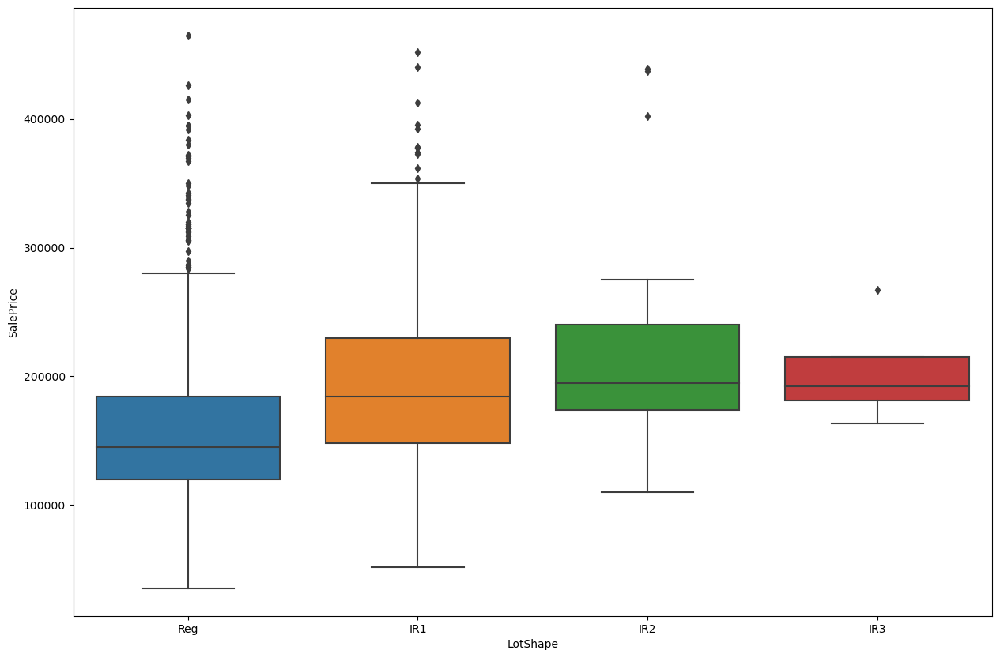

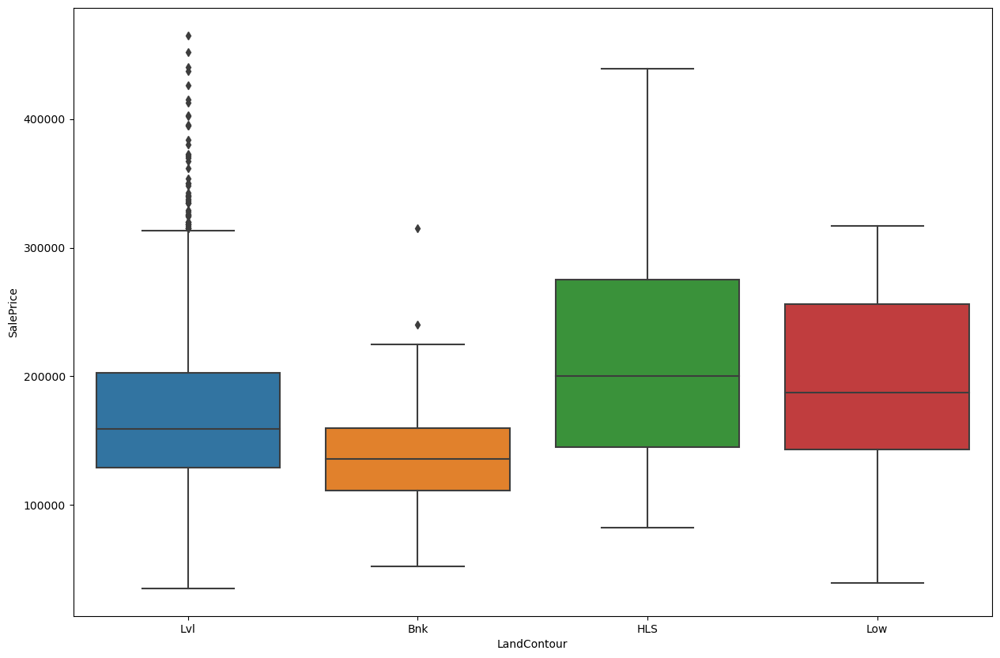

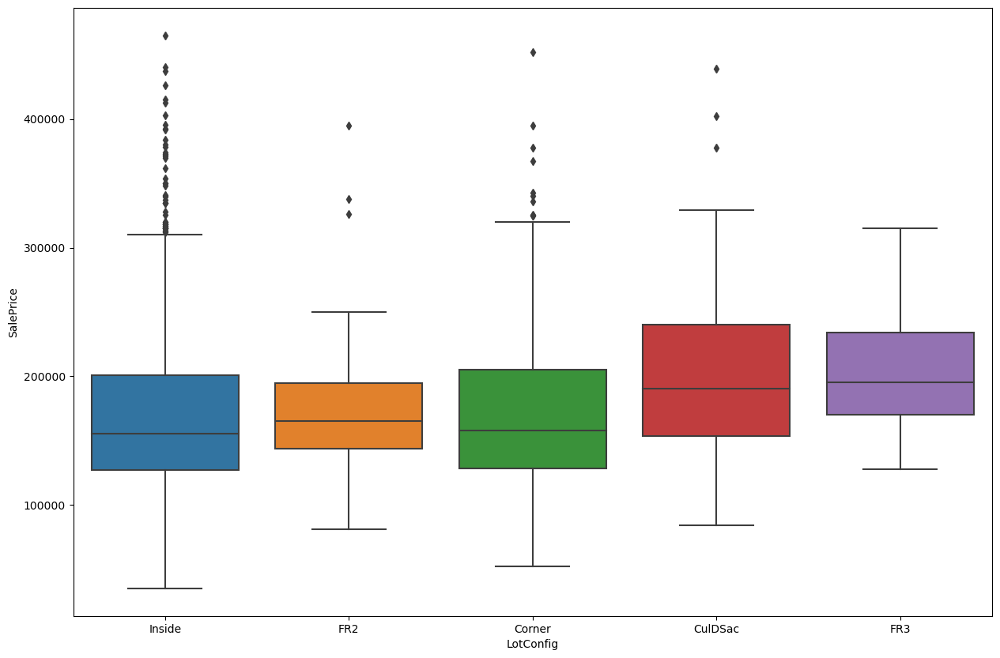

...

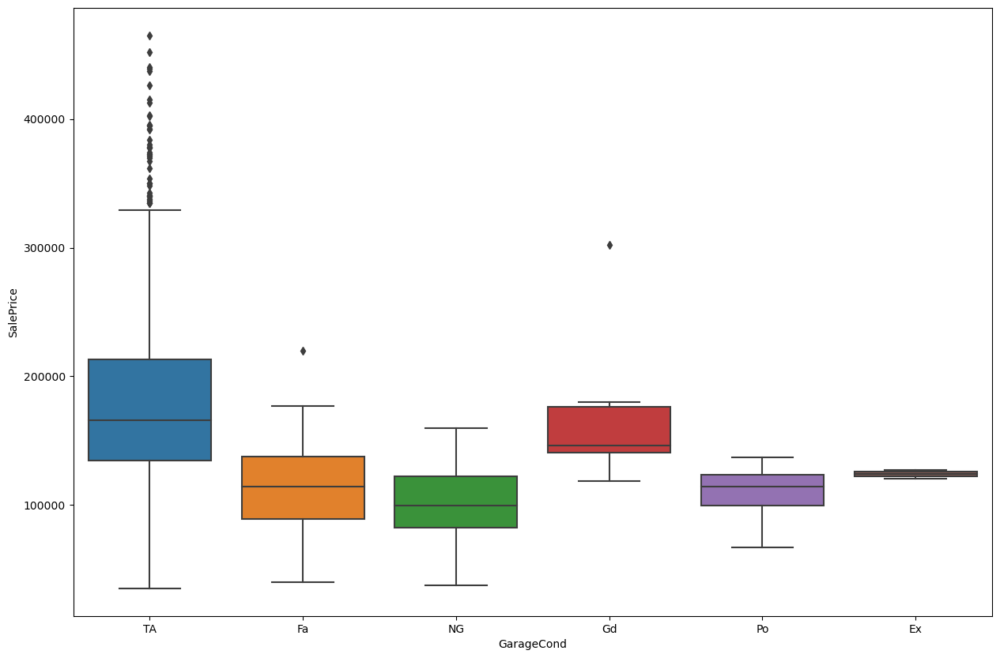

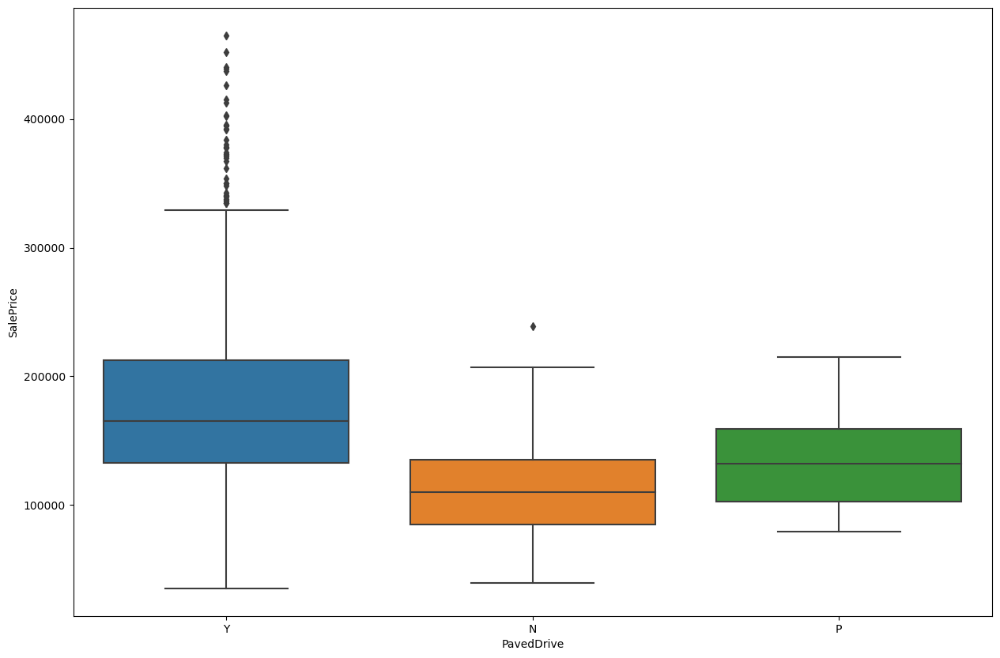

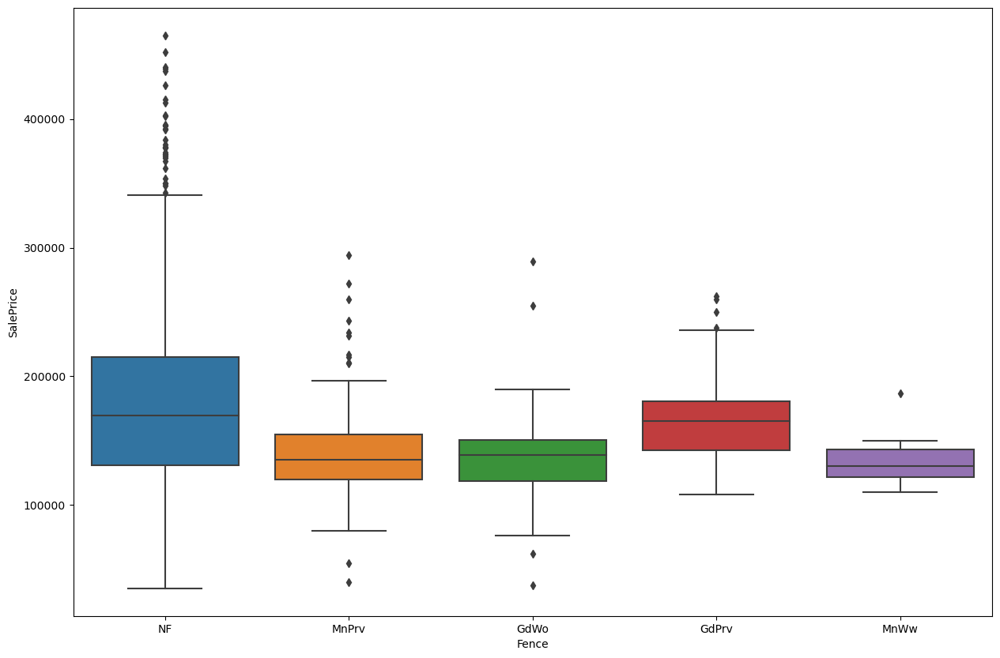

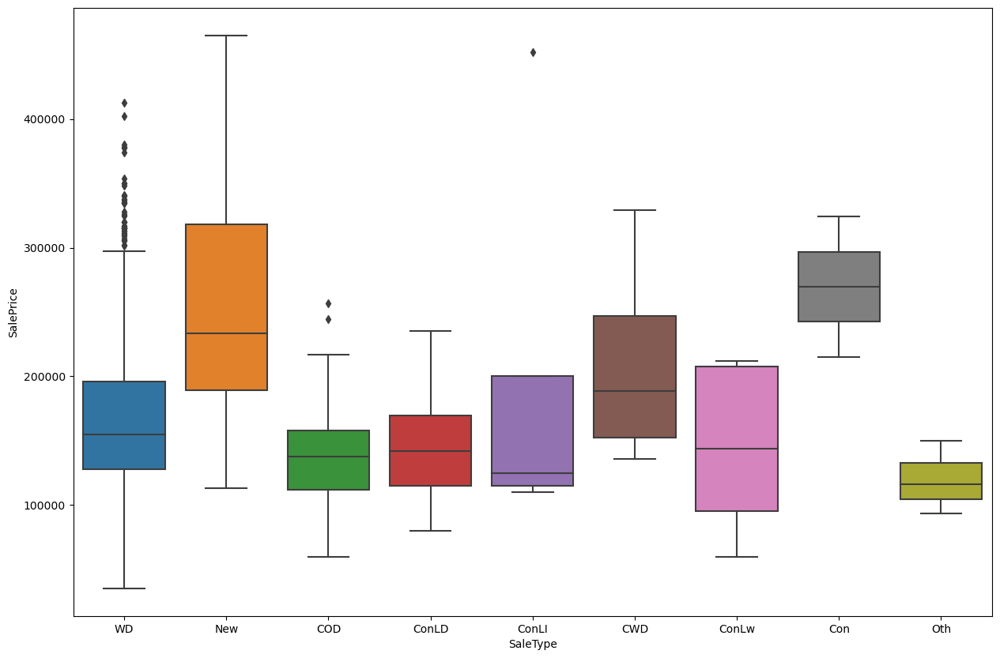

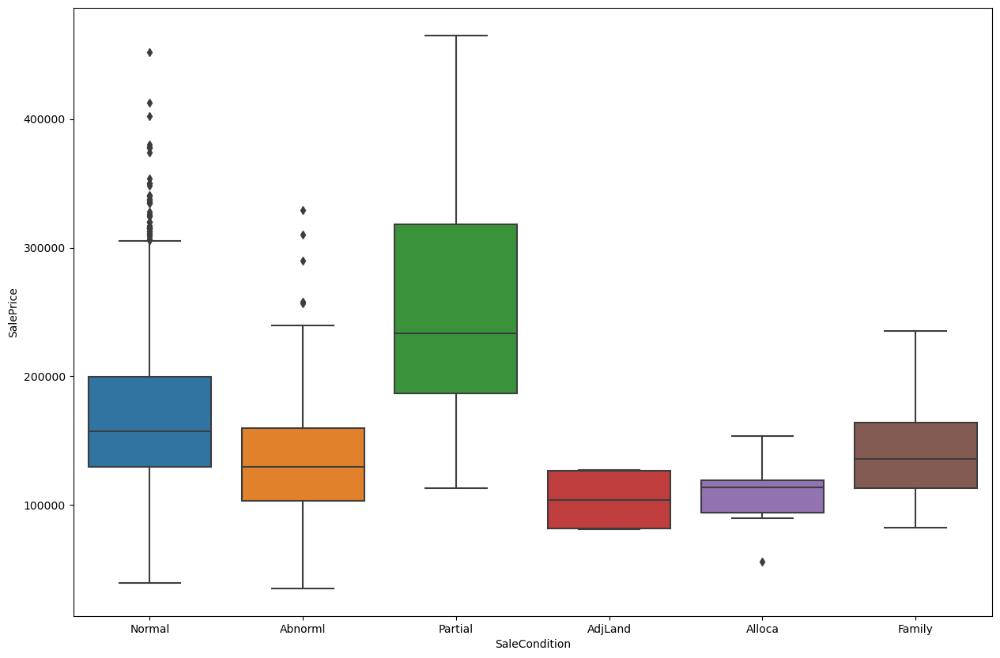

In [94]:
# Plotting all categorical variables in box plot
for col in categorical_columns:
    plt.figure(figsize=(15, 10))
    sns.boxplot(y="SalePrice",x=col, data=house)
    plt.show()

### 3.2 Encoding - Creating dummy variables

Convert categorical variables to dummy variables

In [95]:
len(categorical_columns)

41

<font color='blue'>**Observation**</font> : We have 41 variables which we need to encode to dummy variables in order to feed it to our model. The variables which needs to be encoded are as follows:

In [96]:
categorical_columns

['MSSubClass',
 'MSZoning',
 'LotShape',
 'LandContour',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'OverallQual',
 'OverallCond',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Heating',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 'KitchenQual',
 'Functional',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'Fence',
 'SaleType',
 'SaleCondition']

In [97]:
house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1376 entries, 0 to 1458
Data columns (total 75 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1376 non-null   object 
 1   MSZoning       1376 non-null   object 
 2   LotFrontage    1376 non-null   float64
 3   LotArea        1376 non-null   int64  
 4   LotShape       1376 non-null   object 
 5   LandContour    1376 non-null   object 
 6   LotConfig      1376 non-null   object 
 7   LandSlope      1376 non-null   object 
 8   Neighborhood   1376 non-null   object 
 9   Condition1     1376 non-null   object 
 10  Condition2     1376 non-null   object 
 11  BldgType       1376 non-null   object 
 12  HouseStyle     1376 non-null   object 
 13  OverallQual    1376 non-null   object 
 14  OverallCond    1376 non-null   object 
 15  YearBuilt      1376 non-null   int64  
 16  YearRemodAdd   1376 non-null   int64  
 17  RoofStyle      1376 non-null   object 
 18  RoofMatl

<font color='blue'>**Observation**</font> : We have different categorical columns with same values which will cause trouble while encoding with dummy variables hence we will append the column name along with the values to help us encode. We will not do this for 'MSSubClass', 'OverallQual' and 'OverallCond' as we have done this already

In [98]:
categorical_columns_temp = [ elem for elem in categorical_columns if elem not in ['MSSubClass', 'OverallQual' , 'OverallCond']]

In [99]:
len(categorical_columns_temp)

38

In [100]:
for col in categorical_columns_temp:
    house[col] = house[col].apply(lambda x : x.replace(x,col+'-'+x))

In [101]:
house[categorical_columns]

,MSSubClass,MSZoning,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,Fence,SaleType,SaleCondition
0,60MSSubClass,MSZoning-RL,LotShape-Reg,LandContour-Lvl,LotConfig-Inside,LandSlope-Gtl,Neighborhood-CollgCr,Condition1-Norm,Condition2-Norm,BldgType-1Fam,HouseStyle-2Story,7OverallQual,5OverallCond,RoofStyle-Gable,RoofMatl-CompShg,Exterior1st-VinylSd,Exterior2nd-VinylSd,MasVnrType-BrkFace,ExterQual-Gd,ExterCond-TA,Foundation-PConc,BsmtQual-Gd,BsmtCond-TA,BsmtExposure-No,BsmtFinType1-GLQ,BsmtFinType2-Unf,Heating-GasA,HeatingQC-Ex,CentralAir-Y,Electrical-SBrkr,KitchenQual-Gd,Functional-Typ,FireplaceQu-NF,GarageType-Attchd,GarageFinish-RFn,GarageQual-TA,GarageCond-TA,PavedDrive-Y,Fence-NF,SaleType-WD,SaleCondition-Normal
1,20MSSubClass,MSZoning-RL,LotShape-Reg,LandContour-Lvl,LotConfig-FR2,LandSlope-Gtl,Neighborhood-Veenker,Condition1-Feedr,Condition2-Norm,BldgType-1Fam,HouseStyle-1Story,6OverallQual,8OverallCond,RoofStyle-Gable,RoofMatl-CompShg,Exterior1st-MetalSd,Exterior2nd-MetalSd,MasVnrType-None,ExterQual-TA,ExterCond-TA,Foundation-CBlock,BsmtQual-Gd,BsmtCond-TA,BsmtExposure-Gd,BsmtFinType1-ALQ,BsmtFinType2-Unf,Heating-GasA,HeatingQC-Ex,CentralAir-Y,Electrical-SBrkr,KitchenQual-TA,Functional-Typ,FireplaceQu-TA,GarageType-Attchd,GarageFinish-RFn,GarageQual-TA,GarageCond-TA,PavedDrive-Y,Fence-NF,SaleType-WD,SaleCondition-Normal
2,60MSSubClass,MSZoning-RL,LotShape-IR1,LandContour-Lvl,LotConfig-Inside,LandSlope-Gtl,Neighborhood-CollgCr,Condition1-Norm,Condition2-Norm,BldgType-1Fam,HouseStyle-2Story,7OverallQual,5OverallCond,RoofStyle-Gable,RoofMatl-CompShg,Exterior1st-VinylSd,Exterior2nd-VinylSd,MasVnrType-BrkFace,ExterQual-Gd,ExterCond-TA,Foundation-PConc,BsmtQual-Gd,BsmtCond-TA,BsmtExposure-Mn,BsmtFinType1-GLQ,BsmtFinType2-Unf,Heating-GasA,HeatingQC-Ex,CentralAir-Y,Electrical-SBrkr,KitchenQual-Gd,Functional-Typ,FireplaceQu-TA,GarageType-Attchd,GarageFinish-RFn,GarageQual-TA,GarageCond-TA,PavedDrive-Y,Fence-NF,SaleType-WD,SaleCondition-Normal
3,70MSSubClass,MSZoning-RL,LotShape-IR1,LandContour-Lvl,LotConfig-Corner,LandSlope-Gtl,Neighborhood-Crawfor,Condition1-Norm,Condition2-Norm,BldgType-1Fam,HouseStyle-2Story,7OverallQual,5OverallCond,RoofStyle-Gable,RoofMatl-CompShg,Exterior1st-Wd Sdng,Exterior2nd-Wd Shng,MasVnrType-None,ExterQual-TA,ExterCond-TA,Foundation-BrkTil,BsmtQual-TA,BsmtCond-Gd,BsmtExposure-No,BsmtFinType1-ALQ,BsmtFinType2-Unf,Heating-GasA,HeatingQC-Gd,CentralAir-Y,Electrical-SBrkr,KitchenQual-Gd,Functional-Typ,FireplaceQu-Gd,GarageType-Detchd,GarageFinish-Unf,GarageQual-TA,GarageCond-TA,PavedDrive-Y,Fence-NF,SaleType-WD,SaleCondition-Abnorml
4,60MSSubClass,MSZoning-RL,LotShape-IR1,LandContour-Lvl,LotConfig-FR2,LandSlope-Gtl,Neighborhood-NoRidge,Condition1-Norm,Condition2-Norm,BldgType-1Fam,HouseStyle-2Story,8OverallQual,5OverallCond,RoofStyle-Gable,RoofMatl-CompShg,Exterior1st-VinylSd,Exterior2nd-VinylSd,MasVnrType-BrkFace,ExterQual-Gd,ExterCond-TA,Foundation-PConc,BsmtQual-Gd,BsmtCond-TA,BsmtExposure-Av,BsmtFinType1-GLQ,BsmtFinType2-Unf,Heating-GasA,HeatingQC-Ex,CentralAir-Y,Electrical-SBrkr,KitchenQual-Gd,Functional-Typ,FireplaceQu-TA,GarageType-Attchd,GarageFinish-RFn,GarageQual-TA,GarageCond-TA,PavedDrive-Y,Fence-NF,SaleType-WD,SaleCondition-Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1453,20MSSubClass,MSZoning-RL,LotShape-Reg,LandContour-Lvl,LotConfig-Inside,LandSlope-Gtl,Neighborhood-Mitchel,Condition1-Norm,Condition2-Norm,BldgType-1Fam,HouseStyle-1Story,5OverallQual,5OverallCond,RoofStyle-Gable,RoofMatl-CompShg,Exterior1st-VinylSd,Exterior2nd-

In [102]:
# Creating Dummy variables
for col in categorical_columns:
    dummyCols = pd.get_dummies(house[col],drop_first=True)
    house = pd.concat([house, dummyCols], axis=True)
house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1376 entries, 0 to 1458
Columns: 314 entries, MSSubClass to SaleCondition-Partial
dtypes: float64(3), int64(31), object(41), uint8(239)
memory usage: 1.1+ MB


In [103]:
# Dropping original variables since now they are represented in new dummy variables
house.drop(categorical_columns,axis=1,inplace=True)
house

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,160MSSubClass,180MSSubClass,190MSSubClass,20MSSubClass,30MSSubClass,40MSSubClass,45MSSubClass,50MSSubClass,60MSSubClass,70MSSubClass,75MSSubClass,80MSSubClass,85MSSubClass,90MSSubClass,MSZoning-FV,MSZoning-RH,MSZoning-RL,MSZoning-RM,LotShape-IR2,LotShape-IR3,LotShape-Reg,LandContour-HLS,LandContour-Low,LandContour-Lvl,LotConfig-CulDSac,LotConfig-FR2,LotConfig-FR3,LotConfig-Inside,LandSlope-Mod,LandSlope-Sev,Neighborhood-Blueste,Neighborhood-BrDale,Neighborhood-BrkSide,Neighborhood-ClearCr,Neighborhood-CollgCr,Neighborhood-Crawfor,Neighborhood-Edwards,Neighborhood-Gilbert,Neighborhood-IDOTRR,Neighborhood-MeadowV,Neighborhood-Mitchel,Neighborhood-NAmes,Neighborhood-NPkVill,Neighborhood-NWAmes,Neighborhood-NoRidge,Neighborhood-NridgHt,Neighborhood-OldTown,Neighborhood-SWISU,Neighborhood-Sawyer,Neighborhood-SawyerW,Neighborhood-Somerst,Neighborhood-StoneBr,Neighborhood-Timber,Neighborhood-Veenker,Condition1-Feedr,Condition1-Norm,Condition1-PosA,Condition1-PosN,Condition1-RRAe,Condition1-RRAn,Condition1-RRNe,Condition1-RRNn,Condition2-Feedr,Condition2-Norm,Condition2-RRAn,Condition2-RRNn,BldgType-2fmCon,BldgType-Duplex,BldgType-Twnhs,BldgType-TwnhsE,HouseStyle-1.5Unf,HouseStyle-1Story,HouseStyle-2.5Fin,HouseStyle-2.5Unf,HouseStyle-2Story,HouseStyle-SFoyer,HouseStyle-SLvl,1OverallQual,2OverallQual,3OverallQual,4OverallQual,5OverallQual,6OverallQual,7OverallQual,8OverallQual,9OverallQual,2OverallCond,3OverallCond,4OverallCond,5OverallCond,6OverallCond,7OverallCond,8OverallCond,9OverallCond,RoofStyle-Gable,RoofStyle-Gambrel,RoofStyle-Hip,RoofStyle-Mansard,RoofStyle-Shed,RoofMatl-Membran,RoofMatl-Metal,RoofMatl-Roll,RoofMatl-Tar&Grv,RoofMatl-WdShake,RoofMatl-WdShngl,Exterior1st-AsphShn,Exterior1st-BrkComm,Exterior1st-BrkFace,Exterior1st-CBlock,Exterior1st-CemntBd,Exterior1st-HdBoard,Exterior1st-ImStucc,Exterior1st-MetalSd,Exterior1st-Plywood,Exterior1st-Stone,Exterior1st-Stucco,Exterior1st-VinylSd,Exterior1st-Wd Sdng,Exterior1st-WdShing,Exterior2nd-AsphShn,Exterior2nd-Brk Cmn,Exterior2nd-BrkFace,Exterior2nd-CBlock,Exterior2nd-CmentBd,Exterior2nd-HdBoard,Exterior2nd-ImStucc,Exterior2nd-MetalSd,Exterior2nd-Other,Exterior2nd-Plywood,Exterior2nd-Stone,Exterior2nd-Stucco,Exterior2nd-VinylSd,Exterior2nd-Wd Sdng,Exterior2nd-Wd Shng,MasVnrType-BrkFace,MasVnrType-None,MasVnrType-Stone,ExterQual-Fa,ExterQual-Gd,ExterQual-TA,ExterCond-Fa,ExterCond-Gd,ExterCond-Po,ExterCond-TA,Foundation-CBlock,Foundation-PConc,Foundation-Slab,Foundation-Stone,Foundation-Wood,BsmtQual-Fa,BsmtQual-Gd,BsmtQual-NB,BsmtQual-TA,BsmtCond-Gd,BsmtCond-NB,BsmtCond-Po,BsmtCond-TA,BsmtExposure-Gd,BsmtExposure-Mn,BsmtExposure-NB,BsmtExposure-No,BsmtFinType1-BLQ,BsmtFinType1-GLQ,BsmtFinType1-LwQ,BsmtFinType1-NB,BsmtFinType1-Rec,BsmtFinType1-Unf,BsmtFinType2-BLQ,BsmtFinType2-GLQ,BsmtFinType2-LwQ,BsmtFinType2-NB,BsmtFinType2-Rec,BsmtFinType2-Unf,Heating-GasA,Heating-GasW,Heating-Grav,Heating-OthW,Heating-Wall,HeatingQC-Fa,HeatingQC-Gd,HeatingQC-Po,HeatingQC-TA,CentralAir-Y,Electrical-FuseF,Electrical-FuseP,Electrical-Mix,Electrical-SBrkr,KitchenQual-Fa,KitchenQual-Gd,KitchenQual-TA,Functional-Maj2,Functional-Min1,Functional-Min2,Functional-Mod,Functional-Sev,Functional-Typ,FireplaceQu-Fa,FireplaceQu-Gd,FireplaceQu-NF,FireplaceQu-Po,FireplaceQu-TA,GarageType-Attchd,GarageType-Basment,GarageType-BuiltIn,GarageType-CarPort,GarageType-Detchd,GarageType-NG,GarageFinish-NG,GarageFinish-RFn,GarageFinish-Unf,GarageQual-Fa,GarageQual-Gd,GarageQual-NG,GarageQual-Po,GarageQual-TA,GarageCond-Fa,GarageCond-Gd,GarageCond-NG,GarageCond-Po,GarageCond-TA,PavedDrive-P,PavedDrive-Y,Fence-GdWo,Fence-MnPrv,Fence-MnWw,Fence-NF,SaleType-CWD

### 3.3 Create train and test sets (70:30)

In [104]:
# We specify random_state so that the train and test data set always have the same rows, respectively
house_train, house_test = train_test_split(house,train_size=0.7,random_state=100)

In [105]:
print(house_train.shape)
print(house_test.shape)

(963, 273)
(413, 273)


In [106]:
house_train[numerical_columns]

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
819,44.0,6371,2009,2010,128.0,733,0,625,1358,1358,0,0,1358,1,0,2,0,2,1,6,1,2010.0,2,484,192,35,0,0,0,0,0,6,2010,224000
1141,69.0,10304,1976,1976,44.0,381,0,399,780,1088,780,0,1868,1,0,2,1,4,1,9,1,1976.0,2,484,448,96,0,0,0,0,0,10,2009,197500
1384,60.0,9060,1939,1950,0.0,204,0,356,560,698,560,0,1258,0,0,1,0,2,1,6,0,1939.0,1,280,0,0,0,0,0,0,0,10,2009,105000
455,80.0,9600,1973,1973,320.0,916,0,326,1242,1242,0,0,1242,0,0,1,1,3,1,6,1,1973.0,2,528,0,0,0,0,0,0,0,9,2007,175500
169,69.0,16669,1981,1981,653.0,0,0,1686,1686,1707,0,0,1707,0,0,2,1,2,1,6,1,1981.0,2,511,574,64,0,0,0,0,0,1,2006,228000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
849,80.0,9600,1976,1994,360.0,0,0,528,528,1094,761,0,1855,0,0,2,1,3,1,7,1,1976.0,2,512,113,100,0,0,0,0,0,8,2007,187000
55,100.0,10175,1964,1964,272.0,490,0,935,1425,1425,0,0,1425,0,0,2,0,3,1,7,1,1964.0,2,576,0,0,0,407,0,0,0,7,2008,180500
370,69.0,8121,2000,2000,0.0,0,0,953,953,953,711,0,1664,0,0,2,1,3,1,7,1,2000.0,2,460,100,40,0,0,0,0,0,1,2006,172400
82,78.0,10206,2007,2007,468.0,33,0,1530,1563,1563,0,0,1563,0,0,2,0,3,1,6,1,2007.0,3,758,144,99,0,0,0,0,0,10,2008,245000


### 3.4 Rescalling of numeric variables

It is extremely important to rescale the variables so that they have a comparable scale<br>
We are using Min-Max scaling

In [107]:
scaler = MinMaxScaler()

In [108]:
# We will do both fit and transform operation on trainig set
house_train[numerical_columns] = scaler.fit_transform(house_train[numerical_columns])
house_train.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,160MSSubClass,180MSSubClass,190MSSubClass,20MSSubClass,30MSSubClass,40MSSubClass,45MSSubClass,50MSSubClass,60MSSubClass,70MSSubClass,75MSSubClass,80MSSubClass,85MSSubClass,90MSSubClass,MSZoning-FV,MSZoning-RH,MSZoning-RL,MSZoning-RM,LotShape-IR2,LotShape-IR3,LotShape-Reg,LandContour-HLS,LandContour-Low,LandContour-Lvl,LotConfig-CulDSac,LotConfig-FR2,LotConfig-FR3,LotConfig-Inside,LandSlope-Mod,LandSlope-Sev,Neighborhood-Blueste,Neighborhood-BrDale,Neighborhood-BrkSide,Neighborhood-ClearCr,Neighborhood-CollgCr,Neighborhood-Crawfor,Neighborhood-Edwards,Neighborhood-Gilbert,Neighborhood-IDOTRR,Neighborhood-MeadowV,Neighborhood-Mitchel,Neighborhood-NAmes,Neighborhood-NPkVill,Neighborhood-NWAmes,Neighborhood-NoRidge,Neighborhood-NridgHt,Neighborhood-OldTown,Neighborhood-SWISU,Neighborhood-Sawyer,Neighborhood-SawyerW,Neighborhood-Somerst,Neighborhood-StoneBr,Neighborhood-Timber,Neighborhood-Veenker,Condition1-Feedr,Condition1-Norm,Condition1-PosA,Condition1-PosN,Condition1-RRAe,Condition1-RRAn,Condition1-RRNe,Condition1-RRNn,Condition2-Feedr,Condition2-Norm,Condition2-RRAn,Condition2-RRNn,BldgType-2fmCon,BldgType-Duplex,BldgType-Twnhs,BldgType-TwnhsE,HouseStyle-1.5Unf,HouseStyle-1Story,HouseStyle-2.5Fin,HouseStyle-2.5Unf,HouseStyle-2Story,HouseStyle-SFoyer,HouseStyle-SLvl,1OverallQual,2OverallQual,3OverallQual,4OverallQual,5OverallQual,6OverallQual,7OverallQual,8OverallQual,9OverallQual,2OverallCond,3OverallCond,4OverallCond,5OverallCond,6OverallCond,7OverallCond,8OverallCond,9OverallCond,RoofStyle-Gable,RoofStyle-Gambrel,RoofStyle-Hip,RoofStyle-Mansard,RoofStyle-Shed,RoofMatl-Membran,RoofMatl-Metal,RoofMatl-Roll,RoofMatl-Tar&Grv,RoofMatl-WdShake,RoofMatl-WdShngl,Exterior1st-AsphShn,Exterior1st-BrkComm,Exterior1st-BrkFace,Exterior1st-CBlock,Exterior1st-CemntBd,Exterior1st-HdBoard,Exterior1st-ImStucc,Exterior1st-MetalSd,Exterior1st-Plywood,Exterior1st-Stone,Exterior1st-Stucco,Exterior1st-VinylSd,Exterior1st-Wd Sdng,Exterior1st-WdShing,Exterior2nd-AsphShn,Exterior2nd-Brk Cmn,Exterior2nd-BrkFace,Exterior2nd-CBlock,Exterior2nd-CmentBd,Exterior2nd-HdBoard,Exterior2nd-ImStucc,Exterior2nd-MetalSd,Exterior2nd-Other,Exterior2nd-Plywood,Exterior2nd-Stone,Exterior2nd-Stucco,Exterior2nd-VinylSd,Exterior2nd-Wd Sdng,Exterior2nd-Wd Shng,MasVnrType-BrkFace,MasVnrType-None,MasVnrType-Stone,ExterQual-Fa,ExterQual-Gd,ExterQual-TA,ExterCond-Fa,ExterCond-Gd,ExterCond-Po,ExterCond-TA,Foundation-CBlock,Foundation-PConc,Foundation-Slab,Foundation-Stone,Foundation-Wood,BsmtQual-Fa,BsmtQual-Gd,BsmtQual-NB,BsmtQual-TA,BsmtCond-Gd,BsmtCond-NB,BsmtCond-Po,BsmtCond-TA,BsmtExposure-Gd,BsmtExposure-Mn,BsmtExposure-NB,BsmtExposure-No,BsmtFinType1-BLQ,BsmtFinType1-GLQ,BsmtFinType1-LwQ,BsmtFinType1-NB,BsmtFinType1-Rec,BsmtFinType1-Unf,BsmtFinType2-BLQ,BsmtFinType2-GLQ,BsmtFinType2-LwQ,BsmtFinType2-NB,BsmtFinType2-Rec,BsmtFinType2-Unf,Heating-GasA,Heating-GasW,Heating-Grav,Heating-OthW,Heating-Wall,HeatingQC-Fa,HeatingQC-Gd,HeatingQC-Po,HeatingQC-TA,CentralAir-Y,Electrical-FuseF,Electrical-FuseP,Electrical-Mix,Electrical-SBrkr,KitchenQual-Fa,KitchenQual-Gd,KitchenQual-TA,Functional-Maj2,Functional-Min1,Functional-Min2,Functional-Mod,Functional-Sev,Functional-Typ,FireplaceQu-Fa,FireplaceQu-Gd,FireplaceQu-NF,FireplaceQu-Po,FireplaceQu-TA,GarageType-Attchd,GarageType-Basment,GarageType-BuiltIn,GarageType-CarPort,GarageType-Detchd,GarageType-NG,GarageFinish-NG,GarageFinish-RFn,GarageFinish-Unf,GarageQual-Fa,GarageQual-Gd,GarageQual-NG,GarageQual-Po,GarageQual-TA,GarageCond-Fa,GarageCond-Gd,GarageCond-NG,GarageCond-Po,GarageCond-TA,PavedDrive-P,PavedDrive-Y,Fence-GdWo,Fence-MnPrv,Fence-MnWw,Fence-NF,SaleType-CWD

## 4. Building the model

Dividing into X and Y sets for the model building

In [109]:
y_train = house_train.pop('SalePrice')
X_train = house_train

### 4.1 Automatic Feature Selection using REF

We will be using the LinearRegression function from SciKit Learn for its compatibility with RFE (which is a utility from sklearn)

In [110]:
lm = LinearRegression()
lm.fit(X_train,y_train)

# Running RFE with the output number of the variable equal to 20
rfe = RFE(lm,n_features_to_select=20)
rfe = rfe.fit(X_train,y_train)

In [111]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('LotFrontage', False, 193),
 ('LotArea', True, 1),
 ('YearBuilt', True, 1),
 ('YearRemodAdd', False, 123),
 ('MasVnrArea', False, 158),
 ('BsmtFinSF1', True, 1),
 ('BsmtFinSF2', False, 14),
 ('BsmtUnfSF', False, 15),
 ('TotalBsmtSF', True, 1),
 ('1stFlrSF', False, 18),
 ('2ndFlrSF', False, 16),
 ('LowQualFinSF', False, 25),
 ('GrLivArea', True, 1),
 ('BsmtFullBath', False, 184),
 ('BsmtHalfBath', False, 252),
 ('FullBath', False, 130),
 ('HalfBath', False, 179),
 ('BedroomAbvGr', False, 51),
 ('KitchenAbvGr', False, 161),
 ('TotRmsAbvGrd', False, 174),
 ('Fireplaces', False, 142),
 ('GarageYrBlt', False, 128),
 ('GarageCars', False, 86),
 ('GarageArea', False, 42),
 ('WoodDeckSF', False, 113),
 ('OpenPorchSF', False, 114),
 ('EnclosedPorch', False, 148),
 ('3SsnPorch', False, 90),
 ('ScreenPorch', False, 64),
 ('PoolArea', False, 56),
 ('MiscVal', False, 159),
 ('MoSold', False, 225),
 ('YrSold', False, 211),
 ('160MSSubClass', False, 250),
 ('180MSSubClass', False, 251),
 ('190MSSub

<font color='blue'>**Observation**</font> : We can see selected columns by RFE above where rfe.support_ variable is true with rfe ranking 

In [112]:
col = X_train.columns[rfe.support_]
col

Index(['LotArea', 'YearBuilt', 'BsmtFinSF1', 'TotalBsmtSF', 'GrLivArea',
       '1OverallQual', '2OverallQual', '3OverallQual', '4OverallQual',
       '5OverallQual', '6OverallQual', '7OverallQual', '8OverallQual',
       '9OverallQual', '2OverallCond', '3OverallCond', 'Exterior1st-CemntBd',
       'Exterior2nd-CmentBd', 'Heating-OthW', 'Heating-Wall'],
      dtype='object')

In [113]:
X_train.columns[~rfe.support_]

Index(['LotFrontage', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF2', 'BsmtUnfSF',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath',
       ...
       'SaleType-ConLI', 'SaleType-ConLw', 'SaleType-New', 'SaleType-Oth',
       'SaleType-WD', 'SaleCondition-AdjLand', 'SaleCondition-Alloca',
       'SaleCondition-Family', 'SaleCondition-Normal',
       'SaleCondition-Partial'],
      dtype='object', length=252)

Now we will only use columns selected by RFE for our model and build the model

In [114]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

In [115]:
# Adding a constant variable 
X_train_rfe = sm.add_constant(X_train_rfe)

In [116]:
# Running the linear model
lm = sm.OLS(y_train,X_train_rfe).fit()

In [117]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.870
Model:                            OLS   Adj. R-squared:                  0.867
Method:                 Least Squares   F-statistic:                     314.2
Date:                Sun, 31 Dec 2023   Prob (F-statistic):               0.00
Time:                        10:42:59   Log-Likelihood:                 1432.0
No. Observations:                 963   AIC:                            -2822.
Df Residuals:                     942   BIC:                            -2720.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.3500    

In [118]:
lm = LinearRegression()
lm.fit(X_train,y_train)

# Running RFE with the output number of the variable equal to 30
rfe = RFE(lm,n_features_to_select=30)
rfe = rfe.fit(X_train,y_train)
col = X_train.columns[rfe.support_]
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]
# Adding a constant variable 
X_train_rfe = sm.add_constant(X_train_rfe)
# Running the linear model
lm = sm.OLS(y_train,X_train_rfe).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.883
Model:                            OLS   Adj. R-squared:                  0.880
Method:                 Least Squares   F-statistic:                     262.6
Date:                Sun, 31 Dec 2023   Prob (F-statistic):               0.00
Time:                        10:43:10   Log-Likelihood:                 1486.0
No. Observations:                 963   AIC:                            -2916.
Df Residuals:                     935   BIC:                            -2780.
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.2631    

In [119]:
lm = LinearRegression()
lm.fit(X_train,y_train)

# Running RFE with the output number of the variable equal to 40
rfe = RFE(lm,n_features_to_select=40)
rfe = rfe.fit(X_train,y_train)
col = X_train.columns[rfe.support_]
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]
# Adding a constant variable 
X_train_rfe = sm.add_constant(X_train_rfe)
# Running the linear model
lm = sm.OLS(y_train,X_train_rfe).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.886
Model:                            OLS   Adj. R-squared:                  0.881
Method:                 Least Squares   F-statistic:                     211.2
Date:                Sun, 31 Dec 2023   Prob (F-statistic):               0.00
Time:                        10:43:21   Log-Likelihood:                 1494.6
No. Observations:                 963   AIC:                            -2919.
Df Residuals:                     928   BIC:                            -2749.
Df Model:                          34                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.2277    

<font color='blue'>**Observation**</font> : Our model with 30 features is showing 88.3% R-Square value which is good, Adding more 10 features just improved 0.3% which is not significant hence we will stick with 30 features <br>
<font color='blue'>**Observation**</font> : There are significant p values which we will handle

In [120]:
lm = LinearRegression()
lm.fit(X_train,y_train)

# Running RFE with the output number of the variable equal to 30
rfe = RFE(lm,n_features_to_select=30)
rfe = rfe.fit(X_train,y_train)
col = X_train.columns[rfe.support_]
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]
# Adding a constant variable 
X_train_rfe = sm.add_constant(X_train_rfe)
# Running the linear model
lm = sm.OLS(y_train,X_train_rfe).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.883
Model:                            OLS   Adj. R-squared:                  0.880
Method:                 Least Squares   F-statistic:                     262.6
Date:                Sun, 31 Dec 2023   Prob (F-statistic):               0.00
Time:                        10:43:30   Log-Likelihood:                 1486.0
No. Observations:                 963   AIC:                            -2916.
Df Residuals:                     935   BIC:                            -2780.
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.2631    

### 4.2 Fine tune with manual removal of columns

We will only drop 1 column at a time since we know that p value can changes dramatically even if we drop 1 columns

<font color='blue'>**Observation**</font> : We will drop 'Heating-Grav' as it has highest p value

In [121]:
X_train_rfe = X_train_rfe.drop(['Heating-Grav'],axis=1)

X_train_rfe = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe).fit()
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.883
Model:                            OLS   Adj. R-squared:                  0.880
Method:                 Least Squares   F-statistic:                     273.0
Date:                Sun, 31 Dec 2023   Prob (F-statistic):               0.00
Time:                        10:43:31   Log-Likelihood:                 1486.0
No. Observations:                 963   AIC:                            -2918.
Df Residuals:                     936   BIC:                            -2787.
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.2624    

<font color='blue'>**Observation**</font> : There is no drop in r-squared value, We will drop 'Heating-OthW' as it has highest p value

In [122]:
X_train_rfe = X_train_rfe.drop(['Heating-OthW'],axis=1)

X_train_rfe = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe).fit()
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.883
Model:                            OLS   Adj. R-squared:                  0.880
Method:                 Least Squares   F-statistic:                     284.0
Date:                Sun, 31 Dec 2023   Prob (F-statistic):               0.00
Time:                        10:43:31   Log-Likelihood:                 1485.7
No. Observations:                 963   AIC:                            -2919.
Df Residuals:                     937   BIC:                            -2793.
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.2598    

Now we will also check the VIF of the variable since we cannot just determine model based on p value alone

In [123]:
def check_vif(X_train_rfe,const):
    vif= pd.DataFrame()
    X = X_train_rfe.drop([const], axis=1)
    vif['features'] = X.columns
    vif['vif'] = [variance_inflation_factor(X.values,i) for i in range(X.shape[1])]
    vif['vif'] = round(vif['vif'],2)
    vif = vif.sort_values(by = 'vif', ascending = True)
    return vif

check_vif(X_train_rfe,'const')


,features,vif
16,2OverallCond,1.06
20,9OverallCond,1.09
8,2OverallQual,1.15
17,3OverallCond,1.19
7,1OverallQual,1.20
...,...,...
6,BldgType-Duplex,inf
5,90MSSubClass,inf
23,BsmtCond-NB,inf
24,BsmtFinType1-NB,inf


<font color='blue'>**Observation**</font> : We can see that we have high vif values. So we will drop columns one by one and check the model again.

<font color='blue'>**Observation**</font> : We can see that BldgType-Duplex has high vif values. So we will drop columns and check the model again.

In [124]:
X_train_rfe = X_train_rfe.drop(['BldgType-Duplex'],axis=1)

X_train_rfe = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe).fit()
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.883
Model:                            OLS   Adj. R-squared:                  0.880
Method:                 Least Squares   F-statistic:                     284.0
Date:                Sun, 31 Dec 2023   Prob (F-statistic):               0.00
Time:                        10:43:34   Log-Likelihood:                 1485.7
No. Observations:                 963   AIC:                            -2919.
Df Residuals:                     937   BIC:                            -2793.
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.2598    

In [125]:
pd.set_option('display.max_rows', 30)

In [126]:
check_vif(X_train_rfe,'const')

,features,vif
15,2OverallCond,1.06
19,9OverallCond,1.09
7,2OverallQual,1.15
16,3OverallCond,1.19
6,1OverallQual,1.20
18,8OverallCond,1.22
26,Heating-Wall,1.29
5,90MSSubClass,1.32
17,7OverallCond,1.36
8,3OverallQual,1.83


<font color='blue'>**Observation**</font> :  There is no drop in r-squared value, We can see that GrLivArea has high vif values. So we will drop columns and check the model again.

In [127]:
X_train_rfe = X_train_rfe.drop(['GrLivArea'],axis=1)

X_train_rfe = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe).fit()
print(lm.summary())
check_vif(X_train_rfe,'const')

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.809
Model:                            OLS   Adj. R-squared:                  0.804
Method:                 Least Squares   F-statistic:                     165.9
Date:                Sun, 31 Dec 2023   Prob (F-statistic):          2.14e-317
Time:                        10:43:35   Log-Likelihood:                 1248.7
No. Observations:                 963   AIC:                            -2447.
Df Residuals:                     938   BIC:                            -2326.
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.4838    

,features,vif
14,2OverallCond,1.06
18,9OverallCond,1.08
6,2OverallQual,1.15
15,3OverallCond,1.19
5,1OverallQual,1.20
17,8OverallCond,1.22
25,Heating-Wall,1.29
4,90MSSubClass,1.30
16,7OverallCond,1.36
7,3OverallQual,1.80


<font color='blue'>**Observation**</font> : There is no significant drop in r-squared value. We will drop 'TotalBsmtSF' as it has highest VIF

In [128]:
X_train_rfe = X_train_rfe.drop(['TotalBsmtSF'],axis=1)

X_train_rfe = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe).fit()
print(lm.summary())
check_vif(X_train_rfe,'const')

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.799
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     162.1
Date:                Sun, 31 Dec 2023   Prob (F-statistic):          1.22e-307
Time:                        10:43:38   Log-Likelihood:                 1222.9
No. Observations:                 963   AIC:                            -2398.
Df Residuals:                     939   BIC:                            -2281.
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.5604    

,features,vif
13,2OverallCond,1.05
17,9OverallCond,1.07
5,2OverallQual,1.15
14,3OverallCond,1.18
4,1OverallQual,1.20
16,8OverallCond,1.22
3,90MSSubClass,1.26
24,Heating-Wall,1.29
15,7OverallCond,1.36
6,3OverallQual,1.78


<font color='blue'>**Observation**</font> : There is no significant drop in r-squared value. We will drop 'YearBuilt' as it has highest VIF

In [129]:
X_train_rfe = X_train_rfe.drop(['YearBuilt'],axis=1)

X_train_rfe = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe).fit()
print(lm.summary())
check_vif(X_train_rfe,'const')

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.782
Model:                            OLS   Adj. R-squared:                  0.777
Method:                 Least Squares   F-statistic:                     153.2
Date:                Sun, 31 Dec 2023   Prob (F-statistic):          1.81e-292
Time:                        10:43:39   Log-Likelihood:                 1184.2
No. Observations:                 963   AIC:                            -2322.
Df Residuals:                     940   BIC:                            -2210.
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.6359    

,features,vif
16,9OverallCond,1.02
12,2OverallCond,1.05
15,8OverallCond,1.11
4,2OverallQual,1.15
13,3OverallCond,1.18
3,1OverallQual,1.20
2,90MSSubClass,1.26
14,7OverallCond,1.26
23,Heating-Wall,1.28
5,3OverallQual,1.78


<font color='blue'>**Observation**</font> : There is no significant drop in r-squared value, we lost 1.7% r-square value, We will drop 'BsmtFinType2-NB' as it has highest p value

In [130]:
X_train_rfe = X_train_rfe.drop(['BsmtFinType2-NB'],axis=1)

X_train_rfe = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe).fit()
print(lm.summary())
check_vif(X_train_rfe,'const')

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.782
Model:                            OLS   Adj. R-squared:                  0.777
Method:                 Least Squares   F-statistic:                     153.2
Date:                Sun, 31 Dec 2023   Prob (F-statistic):          1.81e-292
Time:                        10:43:40   Log-Likelihood:                 1184.2
No. Observations:                 963   AIC:                            -2322.
Df Residuals:                     940   BIC:                            -2210.
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.6359    

,features,vif
16,9OverallCond,1.02
12,2OverallCond,1.05
15,8OverallCond,1.11
4,2OverallQual,1.15
13,3OverallCond,1.18
3,1OverallQual,1.20
2,90MSSubClass,1.26
14,7OverallCond,1.26
22,Heating-Wall,1.28
5,3OverallQual,1.78


In [131]:
X_train_rfe = X_train_rfe.drop(['BsmtFinType1-NB'],axis=1)

X_train_rfe = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe).fit()
print(lm.summary())
check_vif(X_train_rfe,'const')

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.782
Model:                            OLS   Adj. R-squared:                  0.777
Method:                 Least Squares   F-statistic:                     153.2
Date:                Sun, 31 Dec 2023   Prob (F-statistic):          1.81e-292
Time:                        10:43:41   Log-Likelihood:                 1184.2
No. Observations:                 963   AIC:                            -2322.
Df Residuals:                     940   BIC:                            -2210.
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.6359    

,features,vif
16,9OverallCond,1.02
12,2OverallCond,1.05
15,8OverallCond,1.11
4,2OverallQual,1.15
13,3OverallCond,1.18
3,1OverallQual,1.20
2,90MSSubClass,1.26
14,7OverallCond,1.26
21,Heating-Wall,1.28
19,BsmtCond-NB,1.42


<font color='blue'>**Observation**</font> : There is no drop in r-squared value, We will drop 'BsmtCond-NB' as it has highest p value

In [132]:
X_train_rfe = X_train_rfe.drop(['BsmtCond-NB'],axis=1)

X_train_rfe = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe).fit()
print(lm.summary())
check_vif(X_train_rfe,'const')

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.782
Model:                            OLS   Adj. R-squared:                  0.777
Method:                 Least Squares   F-statistic:                     160.7
Date:                Sun, 31 Dec 2023   Prob (F-statistic):          1.46e-293
Time:                        10:43:42   Log-Likelihood:                 1184.2
No. Observations:                 963   AIC:                            -2324.
Df Residuals:                     941   BIC:                            -2217.
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.6358    

,features,vif
16,9OverallCond,1.02
12,2OverallCond,1.05
15,8OverallCond,1.10
3,1OverallQual,1.14
2,90MSSubClass,1.15
4,2OverallQual,1.15
13,3OverallCond,1.18
20,Heating-Wall,1.21
14,7OverallCond,1.26
5,3OverallQual,1.77


<font color='blue'>**Observation**</font> : There is no significant drop in r-squared value, We will drop '90MSSubClass'.

In [133]:
X_train_rfe = X_train_rfe.drop(['90MSSubClass'],axis=1)

X_train_rfe = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe).fit()
print(lm.summary())
check_vif(X_train_rfe,'const')

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.782
Model:                            OLS   Adj. R-squared:                  0.777
Method:                 Least Squares   F-statistic:                     168.8
Date:                Sun, 31 Dec 2023   Prob (F-statistic):          1.27e-294
Time:                        10:43:42   Log-Likelihood:                 1184.1
No. Observations:                 963   AIC:                            -2326.
Df Residuals:                     942   BIC:                            -2224.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.6359    

,features,vif
15,9OverallCond,1.02
11,2OverallCond,1.05
14,8OverallCond,1.10
19,Heating-Wall,1.14
2,1OverallQual,1.14
3,2OverallQual,1.15
12,3OverallCond,1.18
13,7OverallCond,1.24
4,3OverallQual,1.77
10,9OverallQual,2.15


<font color='blue'>**Observation**</font> : There is no significant drop in r-squared value, We will drop 'Heating-Wall'.

In [134]:
X_train_rfe = X_train_rfe.drop(['Heating-Wall'],axis=1)

X_train_rfe = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe).fit()
print(lm.summary())
check_vif(X_train_rfe,'const')

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.782
Model:                            OLS   Adj. R-squared:                  0.777
Method:                 Least Squares   F-statistic:                     177.8
Date:                Sun, 31 Dec 2023   Prob (F-statistic):          1.17e-295
Time:                        10:43:42   Log-Likelihood:                 1183.8
No. Observations:                 963   AIC:                            -2328.
Df Residuals:                     943   BIC:                            -2230.
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.6400    

,features,vif
15,9OverallCond,1.02
11,2OverallCond,1.04
14,8OverallCond,1.10
2,1OverallQual,1.13
3,2OverallQual,1.14
12,3OverallCond,1.18
13,7OverallCond,1.24
4,3OverallQual,1.58
10,9OverallQual,2.07
1,BsmtFinSF1,2.31


<font color='blue'>**Observation**</font> : There is no significant drop in r-squared value.We will drop 'Heating-GasA' as it has highest VIF

In [135]:
X_train_rfe = X_train_rfe.drop(['Heating-GasA'],axis=1)

X_train_rfe = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe).fit()
print(lm.summary())
check_vif(X_train_rfe,'const')

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.780
Model:                            OLS   Adj. R-squared:                  0.776
Method:                 Least Squares   F-statistic:                     186.2
Date:                Sun, 31 Dec 2023   Prob (F-statistic):          2.43e-295
Time:                        10:43:43   Log-Likelihood:                 1180.4
No. Observations:                 963   AIC:                            -2323.
Df Residuals:                     944   BIC:                            -2230.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.6847    

,features,vif
15,9OverallCond,1.02
11,2OverallCond,1.03
3,2OverallQual,1.05
2,1OverallQual,1.08
4,3OverallQual,1.08
14,8OverallCond,1.10
12,3OverallCond,1.17
10,9OverallQual,1.24
13,7OverallCond,1.24
5,4OverallQual,1.29


<font color='blue'>**Observation**</font> : There is no significant drop in r-squared value. We will drop 'Exterior1st-CemntBd' as it has highest p value

In [136]:
X_train_rfe = X_train_rfe.drop(['Exterior1st-CemntBd'],axis=1)

X_train_rfe = sm.add_constant(X_train_rfe)
lm = sm.OLS(y_train,X_train_rfe).fit()
print(lm.summary())
check_vif(X_train_rfe,'const')

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.780
Model:                            OLS   Adj. R-squared:                  0.776
Method:                 Least Squares   F-statistic:                     196.6
Date:                Sun, 31 Dec 2023   Prob (F-statistic):          6.94e-296
Time:                        10:43:43   Log-Likelihood:                 1179.0
No. Observations:                 963   AIC:                            -2322.
Df Residuals:                     945   BIC:                            -2234.
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.6827    

,features,vif
15,9OverallCond,1.02
11,2OverallCond,1.03
3,2OverallQual,1.05
2,1OverallQual,1.08
4,3OverallQual,1.08
16,Exterior2nd-CmentBd,1.09
14,8OverallCond,1.10
12,3OverallCond,1.17
10,9OverallQual,1.19
13,7OverallCond,1.24


<font color='blue'>**Observation**</font> : There is no significant drop in r-squared value Also our VIF and p value are under control now. 

<font color='blue'>**Observation**</font> : We can consider this as stable model and now we will proced with residual analysis of the model

## 5. Residual Analysis

So, now to check if the error terms are also normally distributed (which is infact, one of the major assumptions of linear regression), let us plot the histogram of the error terms and see what it looks like.

In [137]:
# Predicting training data to calculate error
y_train_pred = lm.predict(X_train_rfe)

Text(0.5, 0, 'Errors')

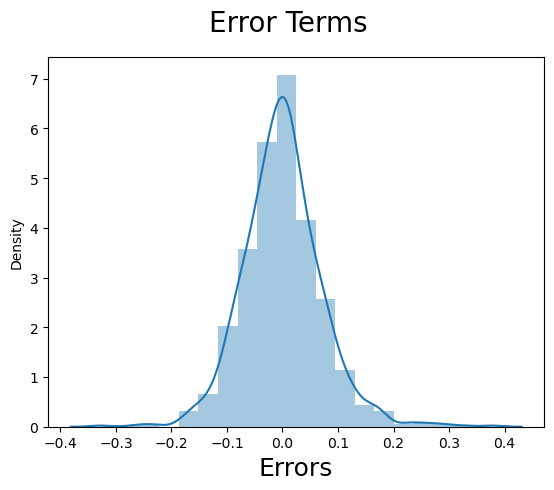

In [138]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_train_pred), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label

<font color='blue'>**Observation**</font> : We can clearly see error terms are nicely distributed around zero

Text(0, 0.5, 'y_train_pred')

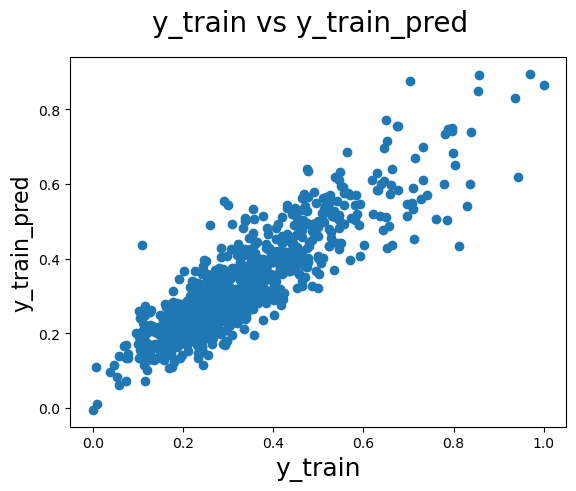

In [139]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_train, y_train_pred)
fig.suptitle('y_train vs y_train_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_train', fontsize=18)                                # X-label
plt.ylabel('y_train_pred', fontsize=16)                           # Y-labe

<font color='blue'>**Observation**</font> : We can see our model is mostly predicting correctly

In [140]:
#create function to calculate metrices such as R2, RSS, MSE and RMSE

def calculate_metrices(actual, pred):
    #R2
    r2 = r2_score(actual, pred)
    print('R2 : ',r2)
    #Residual Sum of Squares = Mean_Squared_Error * Total number of datapoints
    rss = np.sum(np.square(actual - pred))
    print('RSS : ',rss)
    mse = mean_squared_error(actual, pred)
    print('MSE : ',mse)
    # Root Mean Squared Error
    rmse = mse**0.5
    print('RMSE : ',rmse)
    
    return r2,rss,mse,rmse

In [141]:
# Calculate metrices such as R2, RSS, MSE and RMSE
print("Training Set")
r2_train,rss_train,mse_train,rmse_train = calculate_metrices(y_train, y_train_pred)

Training Set
R2 :  0.7795534763314396
RSS :  4.872821770034891
MSE :  0.005060043374906429
RMSE :  0.07113398185752312


## 6. Making Predictions Using the Final Model of Liner Regression

#### Applying the scaling on the test sets

In [142]:
# Observe that we are not using fit and transform. Instead we are using only transform
house_test[numerical_columns] = scaler.transform(house_test[numerical_columns])
house_test.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,160MSSubClass,180MSSubClass,190MSSubClass,20MSSubClass,30MSSubClass,40MSSubClass,45MSSubClass,50MSSubClass,60MSSubClass,70MSSubClass,75MSSubClass,80MSSubClass,85MSSubClass,90MSSubClass,MSZoning-FV,MSZoning-RH,MSZoning-RL,MSZoning-RM,LotShape-IR2,LotShape-IR3,LotShape-Reg,LandContour-HLS,LandContour-Low,LandContour-Lvl,LotConfig-CulDSac,LotConfig-FR2,LotConfig-FR3,LotConfig-Inside,LandSlope-Mod,LandSlope-Sev,Neighborhood-Blueste,Neighborhood-BrDale,Neighborhood-BrkSide,Neighborhood-ClearCr,Neighborhood-CollgCr,Neighborhood-Crawfor,Neighborhood-Edwards,Neighborhood-Gilbert,Neighborhood-IDOTRR,Neighborhood-MeadowV,Neighborhood-Mitchel,Neighborhood-NAmes,Neighborhood-NPkVill,Neighborhood-NWAmes,Neighborhood-NoRidge,Neighborhood-NridgHt,Neighborhood-OldTown,Neighborhood-SWISU,Neighborhood-Sawyer,Neighborhood-SawyerW,Neighborhood-Somerst,Neighborhood-StoneBr,Neighborhood-Timber,Neighborhood-Veenker,Condition1-Feedr,Condition1-Norm,Condition1-PosA,Condition1-PosN,Condition1-RRAe,Condition1-RRAn,Condition1-RRNe,Condition1-RRNn,Condition2-Feedr,Condition2-Norm,Condition2-RRAn,Condition2-RRNn,BldgType-2fmCon,BldgType-Duplex,BldgType-Twnhs,BldgType-TwnhsE,HouseStyle-1.5Unf,HouseStyle-1Story,HouseStyle-2.5Fin,HouseStyle-2.5Unf,HouseStyle-2Story,HouseStyle-SFoyer,HouseStyle-SLvl,1OverallQual,2OverallQual,3OverallQual,4OverallQual,5OverallQual,6OverallQual,7OverallQual,8OverallQual,9OverallQual,2OverallCond,3OverallCond,4OverallCond,5OverallCond,6OverallCond,7OverallCond,8OverallCond,9OverallCond,RoofStyle-Gable,RoofStyle-Gambrel,RoofStyle-Hip,RoofStyle-Mansard,RoofStyle-Shed,RoofMatl-Membran,RoofMatl-Metal,RoofMatl-Roll,RoofMatl-Tar&Grv,RoofMatl-WdShake,RoofMatl-WdShngl,Exterior1st-AsphShn,Exterior1st-BrkComm,Exterior1st-BrkFace,Exterior1st-CBlock,Exterior1st-CemntBd,Exterior1st-HdBoard,Exterior1st-ImStucc,Exterior1st-MetalSd,Exterior1st-Plywood,Exterior1st-Stone,Exterior1st-Stucco,Exterior1st-VinylSd,Exterior1st-Wd Sdng,Exterior1st-WdShing,Exterior2nd-AsphShn,Exterior2nd-Brk Cmn,Exterior2nd-BrkFace,Exterior2nd-CBlock,Exterior2nd-CmentBd,Exterior2nd-HdBoard,Exterior2nd-ImStucc,Exterior2nd-MetalSd,Exterior2nd-Other,Exterior2nd-Plywood,Exterior2nd-Stone,Exterior2nd-Stucco,Exterior2nd-VinylSd,Exterior2nd-Wd Sdng,Exterior2nd-Wd Shng,MasVnrType-BrkFace,MasVnrType-None,MasVnrType-Stone,ExterQual-Fa,ExterQual-Gd,ExterQual-TA,ExterCond-Fa,ExterCond-Gd,ExterCond-Po,ExterCond-TA,Foundation-CBlock,Foundation-PConc,Foundation-Slab,Foundation-Stone,Foundation-Wood,BsmtQual-Fa,BsmtQual-Gd,BsmtQual-NB,BsmtQual-TA,BsmtCond-Gd,BsmtCond-NB,BsmtCond-Po,BsmtCond-TA,BsmtExposure-Gd,BsmtExposure-Mn,BsmtExposure-NB,BsmtExposure-No,BsmtFinType1-BLQ,BsmtFinType1-GLQ,BsmtFinType1-LwQ,BsmtFinType1-NB,BsmtFinType1-Rec,BsmtFinType1-Unf,BsmtFinType2-BLQ,BsmtFinType2-GLQ,BsmtFinType2-LwQ,BsmtFinType2-NB,BsmtFinType2-Rec,BsmtFinType2-Unf,Heating-GasA,Heating-GasW,Heating-Grav,Heating-OthW,Heating-Wall,HeatingQC-Fa,HeatingQC-Gd,HeatingQC-Po,HeatingQC-TA,CentralAir-Y,Electrical-FuseF,Electrical-FuseP,Electrical-Mix,Electrical-SBrkr,KitchenQual-Fa,KitchenQual-Gd,KitchenQual-TA,Functional-Maj2,Functional-Min1,Functional-Min2,Functional-Mod,Functional-Sev,Functional-Typ,FireplaceQu-Fa,FireplaceQu-Gd,FireplaceQu-NF,FireplaceQu-Po,FireplaceQu-TA,GarageType-Attchd,GarageType-Basment,GarageType-BuiltIn,GarageType-CarPort,GarageType-Detchd,GarageType-NG,GarageFinish-NG,GarageFinish-RFn,GarageFinish-Unf,GarageQual-Fa,GarageQual-Gd,GarageQual-NG,GarageQual-Po,GarageQual-TA,GarageCond-Fa,GarageCond-Gd,GarageCond-NG,GarageCond-Po,GarageCond-TA,PavedDrive-P,PavedDrive-Y,Fence-GdWo,Fence-MnPrv,Fence-MnWw,Fence-NF,SaleType-CWD

#### Dividing into X_test and y_test

In [143]:
y_test = house_test.pop('SalePrice')
X_test = house_test

In [144]:
# Now let's use our model to make predictions.
X = X_train_rfe.drop(['const'], axis=1)
# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X.columns]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)
X_test_new.columns

Index(['const', 'LotArea', 'BsmtFinSF1', '1OverallQual', '2OverallQual',
       '3OverallQual', '4OverallQual', '5OverallQual', '6OverallQual',
       '7OverallQual', '8OverallQual', '9OverallQual', '2OverallCond',
       '3OverallCond', '7OverallCond', '8OverallCond', '9OverallCond',
       'Exterior2nd-CmentBd'],
      dtype='object')

In [145]:
y_test_pred = lm.predict(X_test_new)

Text(0, 0.5, 'y_pred')

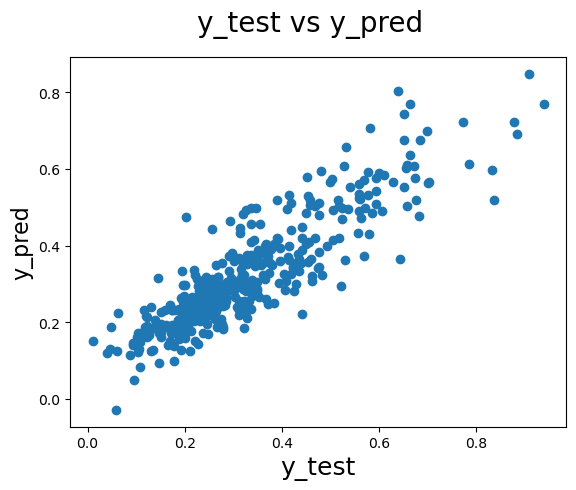

In [146]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_test,y_test_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-labe

In [147]:
# Calculate metrices such as R2, RSS, MSE and RMSE
print("Testing Set")
r2_test,rss_test,mse_test,rmse_test = calculate_metrices(y_test, y_test_pred)

Testing Set
R2 :  0.7806989997151355
RSS :  2.386306876068735
MSE :  0.005777982750771756
RMSE :  0.07601304329371214


<font color='blue'>**Observation**</font> : We can see that our model does a decent job on both test and train data set and it does not over or underfit but has lower R2 value, earlier it was having high multicolinerity which we got out by dropping features which resulted in loss of R2. Lets see if we can improve our R2 value with regularization

In [148]:
# Create a metric table for later evaluation
linear_metric=[]
linear_metric.append(r2_train)
linear_metric.append(r2_test)
linear_metric.append(r2_train-r2_test)
linear_metric.append(rss_train)
linear_metric.append(rss_test)
linear_metric.append(mse_train)
linear_metric.append(mse_test)
linear_metric.append(rmse_train)
linear_metric.append(rmse_test)

## 7. Regularization

We will try to model with Ridge and Lasso regression to check if we get any better result and we will choose the best one among three models which we will build

### 7.1 Ridge Regression

In [149]:
# list of alphas to tune - if value too high it will lead to underfitting, if it is too low, 
# it will not handle the overfitting
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

#### 7.1.1 Cross Validation

In [150]:
# cross validation
folds = KFold(n_splits = 25, shuffle = True, random_state = 100)

ridge = Ridge()

ridge_model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)   

ridge_model_cv.fit(X_train, y_train) 
#https://scikit-learn.org/stable/modules/model_evaluation.html

Fitting 25 folds for each of 28 candidates, totalling 700 fits


GridSearchCV(cv=KFold(n_splits=25, random_state=100, shuffle=True),
             estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [151]:
# Printing the best hyperparameter alpha
print(ridge_model_cv.best_params_)

{'alpha': 3.0}


In [152]:
# define function to plot cv results
def plotNegativeMeanSquare(model_cv):
    model_cv_results = pd.DataFrame(model_cv.cv_results_)

    plt.figure(figsize=(15,5))
    model_cv_results['param_alpha'] = model_cv_results['param_alpha'].astype('float32')

    # plotting
    plt.plot(model_cv_results['param_alpha'], model_cv_results['mean_train_score'])
    plt.plot(model_cv_results['param_alpha'], model_cv_results['mean_test_score'])
    plt.xlabel('Alpha')
    plt.ylabel('Negative Mean Absolute Error')

    plt.title('Negative Mean Absolute Error and alpha')
    plt.legend(['train score', 'test score'], loc='upper right')
    plt.show()
    
    return model_cv_results

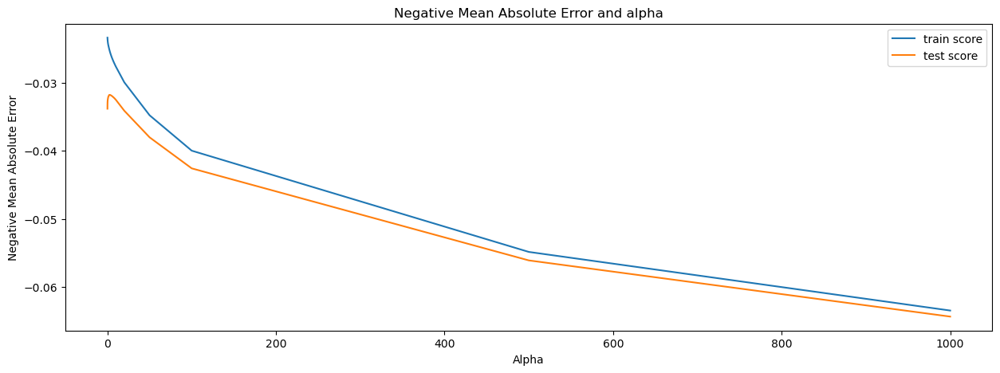

In [153]:
# plotting ridge_model_cv results
ridge_model_cv_result = plotNegativeMeanSquare(ridge_model_cv)

In [154]:
ridge_model_cv_result[['param_alpha', 'mean_train_score', 'mean_test_score', 'rank_test_score']].sort_values(by='rank_test_score').head()

,param_alpha,mean_train_score,mean_test_score,rank_test_score
15,3.0,-0.025489,-0.031779,1
14,2.0,-0.025024,-0.031800,2
16,4.0,-0.025883,-0.031846,3
17,5.0,-0.026233,-0.031923,4
18,6.0,-0.026548,-0.032019,5


In [155]:
print(ridge_model_cv.best_estimator_)

Ridge(alpha=3.0)


#### 7.1.2 Fitting the Model on Training Set

In [156]:
ridge_model = Ridge(alpha=ridge_model_cv.best_estimator_.alpha)
ridge_model.fit(X_train, y_train)

Ridge(alpha=3.0)

#### 7.1.3 Predicting using the Model on training set

In [157]:
y_train_pred = ridge_model.predict(X_train)

In [158]:
# Calculate metrices such as R2, RSS, MSE and RMSE
print("Training Set")
r2_train,rss_train,mse_train,rmse_train = calculate_metrices(y_train, y_train_pred)

Training Set
R2 :  0.9405624882341205
RSS :  1.31382612195299
MSE :  0.0013643054225887749
RMSE :  0.036936505283916274


#### 7.1.3 Checking the assumptions

Text(0, 0.5, 'Error')

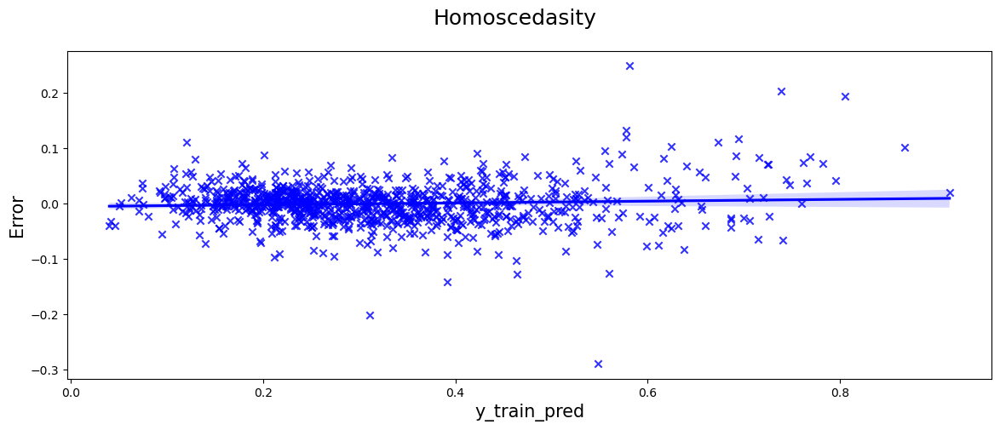

In [159]:
# Plot for Homoscedasity
fig = plt.figure(figsize=(14,5))
sns.regplot(x=y_train_pred, y=y_train-y_train_pred,  color="blue", marker='x')
fig.suptitle('Homoscedasity', fontsize=18)
plt.xlabel('y_train_pred', fontsize=15)   
plt.ylabel('Error', fontsize=15)

Text(0.5, 0, 'Errors')

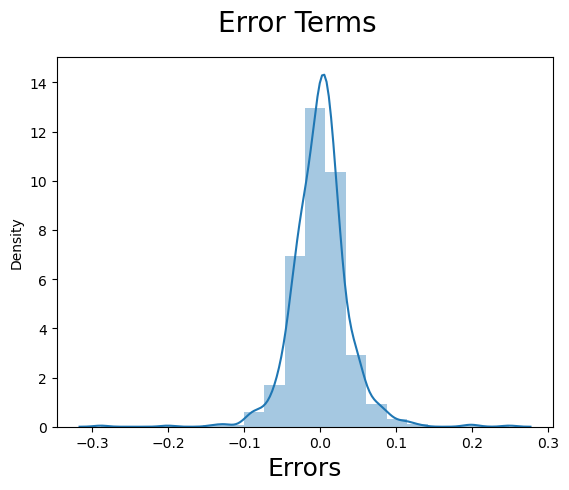

In [160]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot(y_train-y_train_pred, bins=20)
fig.suptitle('Error Terms', fontsize = 20)
plt.xlabel('Errors', fontsize = 18)   

<font color='blue'>**Observation**</font> : Both error terms and prediction looks fairly distributed around zero and no patter is observed we can continute with test data for prediction

#### 7.1.4 Predicting using the Model on test set

In [161]:
y_test_pred = ridge_model.predict(X_test)

In [162]:
# Calculate metrices such as R2, RSS, MSE and RMSE
print("Testing Set")
r2_test,rss_test,mse_test,rmse_test = calculate_metrices(y_test, y_test_pred)

Testing Set
R2 :  0.9222608247383728
RSS :  0.8459128240444097
MSE :  0.0020482150703254472
RMSE :  0.045257210147394714


<font color='blue'>**Observation**</font> : We can observe that there is no significant drop in R2 score between Train and Test set in our model, difference is just about 2%, we can colclude that our model is stable

In [163]:
# Create a metric table for later evaluation
ridge_metric=[]
ridge_metric.append(r2_train)
ridge_metric.append(r2_test)
ridge_metric.append(r2_train-r2_test)
ridge_metric.append(rss_train)
ridge_metric.append(rss_test)
ridge_metric.append(mse_train)
ridge_metric.append(mse_test)
ridge_metric.append(rmse_train)
ridge_metric.append(rmse_test)

Lets go ahead and now build the model using Lasso Regression

### 7.2 Lasso Regression

In [164]:
# list of alphas to tune - if value too high it will lead to underfitting, if it is too low, 
# it will not handle the overfitting
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

#### 7.2.1 Cross Validation

In [165]:
# cross validation
folds = KFold(n_splits = 25, shuffle = True, random_state = 100)

lasso = Lasso()

lasso_model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)   

lasso_model_cv.fit(X_train, y_train) 
#https://scikit-learn.org/stable/modules/model_evaluation.html

Fitting 25 folds for each of 28 candidates, totalling 700 fits


GridSearchCV(cv=KFold(n_splits=25, random_state=100, shuffle=True),
             estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [166]:
# Printing the best hyperparameter alpha
print(lasso_model_cv.best_params_)

{'alpha': 0.0001}


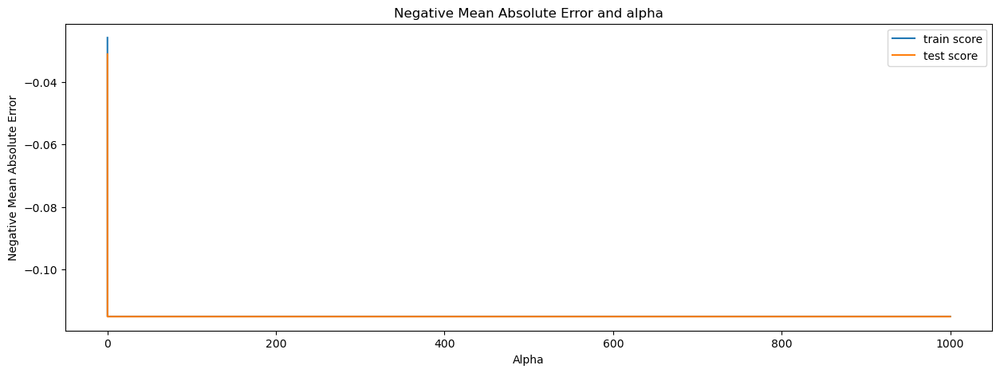

In [167]:
# plotting ridge_model_cv results
lasso_model_cv_result = plotNegativeMeanSquare(lasso_model_cv)

In [168]:
lasso_model_cv_result[['param_alpha', 'mean_train_score', 'mean_test_score', 'rank_test_score']].sort_values(by='rank_test_score').head()

,param_alpha,mean_train_score,mean_test_score,rank_test_score
0,0.0001,-0.025880,-0.031147,1
1,0.0010,-0.034697,-0.037238,2
2,0.0100,-0.067808,-0.068717,3
25,100.0000,-0.114942,-0.114991,4
24,50.0000,-0.114942,-0.114991,4


In [169]:
print(lasso_model_cv.best_estimator_)

Lasso(alpha=0.0001)


#### 7.2.2 Fitting the Model on Training Set

In [170]:
lasso_model = Lasso(alpha=lasso_model_cv.best_estimator_.alpha)
lasso_model.fit(X_train, y_train)

Lasso(alpha=0.0001)

#### 7.2.3 Predicting using the Model on training set

In [171]:
y_train_pred = lasso_model.predict(X_train)

In [172]:
# Calculate metrices such as R2, RSS, MSE and RMSE
print("Training Set")
r2_train,rss_train,mse_train,rmse_train = calculate_metrices(y_train, y_train_pred)

Training Set
R2 :  0.9385963317088479
RSS :  1.357286686266757
MSE :  0.0014094358112842751
RMSE :  0.03754245345318118


#### 7.2.3 Checking the assumptions

Text(0, 0.5, 'Error')

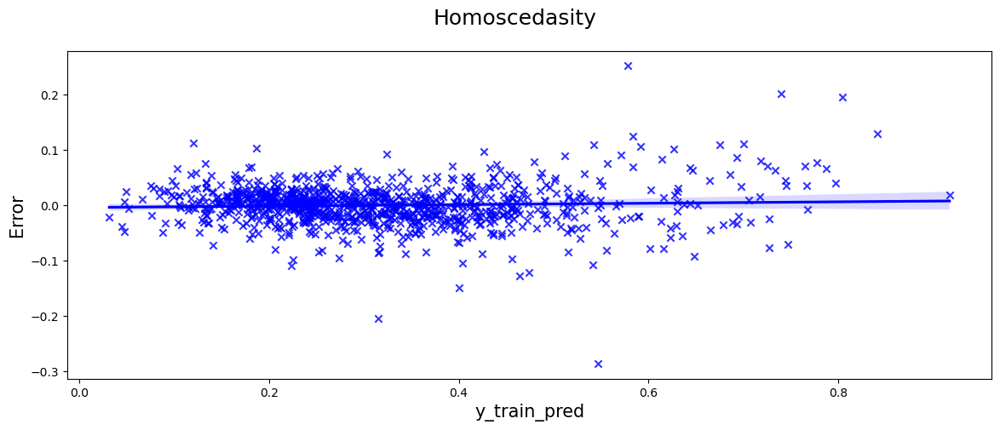

In [173]:
# Plot for Homoscedasity
fig = plt.figure(figsize=(14,5))
sns.regplot(x=y_train_pred, y=y_train-y_train_pred,  color="blue", marker='x')
fig.suptitle('Homoscedasity', fontsize=18)
plt.xlabel('y_train_pred', fontsize=15)   
plt.ylabel('Error', fontsize=15)

Text(0.5, 0, 'Errors')

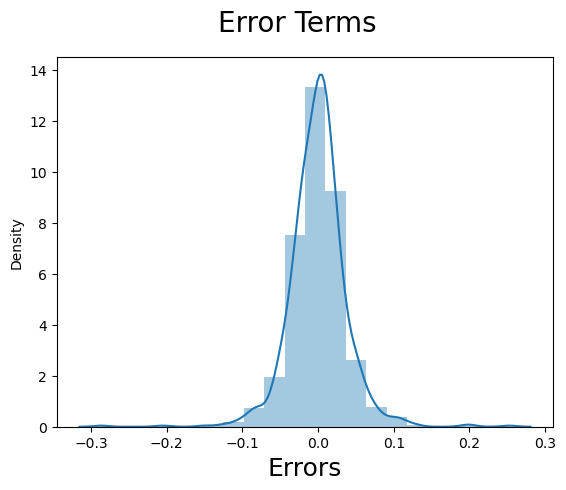

In [174]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot(y_train-y_train_pred, bins=20)
fig.suptitle('Error Terms', fontsize = 20)
plt.xlabel('Errors', fontsize = 18)   

<font color='blue'>**Observation**</font> : Both error terms and prediction looks fairly distributed around zero and no patter is observed we can continute with test data for prediction

#### 7.2.4 Predicting using the Model on test set

In [175]:
y_test_pred = lasso_model.predict(X_test)

In [176]:
# Calculate metrices such as R2, RSS, MSE and RMSE
print("Testing Set")
r2_test,rss_test,mse_test,rmse_test = calculate_metrices(y_test, y_test_pred)

Testing Set
R2 :  0.9211054691851466
RSS :  0.8584847361532759
MSE :  0.002078655535480087
RMSE :  0.0455922749539885


<font color='blue'>**Observation**</font> : We can observe that there is no significant drop in R2 score between Train and Test set in our model, difference is just about 1%, we can colclude that our model is stable

In [177]:
# Create a metric table for later evaluation
lasso_metric=[]
lasso_metric.append(r2_train)
lasso_metric.append(r2_test)
lasso_metric.append(r2_train-r2_test)
lasso_metric.append(rss_train)
lasso_metric.append(rss_test)
lasso_metric.append(mse_train)
lasso_metric.append(mse_test)
lasso_metric.append(rmse_train)
lasso_metric.append(rmse_test)

## 8. Model Evaluation

In [178]:
lr_table = {'Metric': ['R2 Score (Train)','R2 Score (Test)','Diffrence in R2 test and train','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)','RMSE (Train)','RMSE (Test)'], 
        'Linear Regression with RFE': linear_metric }

lr_metric = pd.DataFrame(lr_table ,columns = ['Metric', 'Linear Regression with RFE'] )
rg_metric = pd.Series(ridge_metric, name = 'Ridge Regression')
ls_metric = pd.Series(lasso_metric, name = 'Lasso Regression')

metric = pd.concat([lr_metric, rg_metric, ls_metric], axis = 1)
metric

,Metric,Linear Regression with RFE,Ridge Regression,Lasso Regression
0,R2 Score (Train),0.779553,0.940562,0.938596
1,R2 Score (Test),0.780699,0.922261,0.921105
2,Diffrence in R2 test and train,-0.001146,0.018302,0.017491
3,RSS (Train),4.872822,1.313826,1.357287
4,RSS (Test),2.386307,0.845913,0.858485
5,MSE (Train),0.005060,0.001364,0.001409
6,MSE (Test),0.005778,0.002048,0.002079
7,RMSE (Train),0.071134,0.036937,0.037542
8,RMSE (Test),0.076013,0.045257,0.045592


<font color='blue'>**Observation**</font> : We will compare all values of all three models and choose the best one <br>
- Ridge R2 value is higher than linear regression and lasso regression for both test and train data
- Difference in R2 for test and train is the least for the lasso regression but it is just 0.1% different from ridge regression. Here the best performer is Linear regression with almost no difference in test and train data
- RSS for the train and test is the least for the ridge regression model however not much different than lasso
- MSE for the train and test is the least for the ridge regression model however not much different than lasso
- RMSE for the train and test is the least for the ridge regression model however not much different than lasso

In [179]:
ridge_model.coef_

array([ 0.01436545,  0.07479014,  0.05957207,  0.02209314,  0.02335044,
        0.0657601 ,  0.01828787,  0.0151175 ,  0.07428396,  0.08325252,
        0.06437339, -0.00119685,  0.10237908,  0.00823689, -0.00955   ,
        0.03316132,  0.0181773 , -0.00683466, -0.01105528,  0.02243464,
        0.01938816, -0.00275166,  0.02996951,  0.03778786,  0.02212242,
        0.02141586,  0.00951229,  0.01480113,  0.02622121,  0.01406667,
        0.01008968, -0.0001849 , -0.00154625,  0.00175065, -0.00513919,
       -0.00982169,  0.01383228,  0.00594482,  0.01801337,  0.00981209,
        0.00289581,  0.01858816,  0.01986524,  0.01393216, -0.00172742,
       -0.00909264, -0.01313274,  0.03051662,  0.01304853,  0.01595936,
       -0.00074174,  0.01040622,  0.00075652,  0.00307881,  0.00885174,
       -0.02067791, -0.00168627,  0.0176223 , -0.00863842, -0.0098857 ,
        0.00072786, -0.00856522, -0.03404979,  0.0014652 ,  0.01240822,
        0.00779373, -0.00308285, -0.01344601,  0.03581162, -0.03

In [180]:
lasso_model.coef_

array([ 0.00000000e+00,  1.20001146e-01,  1.09246288e-01,  1.92419987e-02,
        1.72055178e-02,  5.63570940e-02,  1.20602284e-02, -0.00000000e+00,
        9.49718422e-02,  0.00000000e+00,  1.11221387e-02, -6.97993556e-03,
        2.60194350e-01,  5.74614013e-03, -0.00000000e+00,  1.09597630e-02,
        7.51536637e-03, -5.50919525e-03, -6.41466876e-03,  0.00000000e+00,
        1.33235854e-02, -0.00000000e+00,  2.77629097e-02,  3.04573509e-02,
        2.08629922e-02,  1.76579784e-02,  8.54371256e-03,  0.00000000e+00,
        2.32523255e-02,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00,  0.00000000e+00, -0.00000000e+00, -1.60275597e-02,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  8.21977092e-03,
       -0.00000000e+00,  5.98242620e-04,  8.87259699e-03,  0.00000000e+00,
        0.00000000e+00, -4.91785571e-03, -3.29754070e-02,  3.31173855e-02,
        8.58416316e-03,  1.32711250e-02, -1.16353275e-03,  2.53573939e-03,
       -0.00000000e+00,  

We will print the beta coefficient of top 10 the features of ridge regression and corresponding lasso beta coefficients

In [181]:
betas = pd.DataFrame(index=X_train.columns)
pd.set_option('display.max_rows', None)
betas['Ridge'] = ridge_model.coef_
betas['Lasso'] = lasso_model.coef_
betas.sort_values(by=['Ridge'],ascending=False).head(10)

,Ridge,Lasso
GrLivArea,0.102379,0.260194
1stFlrSF,0.083253,0.000000
LotArea,0.074790,0.120001
TotalBsmtSF,0.074284,0.094972
BsmtFinSF1,0.065760,0.056357
2ndFlrSF,0.064373,0.011122
YearBuilt,0.059572,0.109246
Neighborhood-StoneBr,0.057387,0.065945
Neighborhood-NridgHt,0.046188,0.053160
9OverallQual,0.043062,0.046728


## 9. Conclusion

We will conclude that the best model for our prediction is **Lasso regression** model with alpha as **0.0001**, even though all the metric are in favour of Ridge model. But we should take this with pinch of salt, that if we need simpler model with lesser parameters to consider then we should go with Lasso as it tends to reduce the number of features by making their coefficient to zero. Which will avoid overfitting and error in unknown data set.

In [182]:
lasso_zero_betas = filter(lambda x: x == 0, lasso_model.coef_)
print("Lasso Zero Value Betas : ",len(list(lasso_zero_betas)))

Lasso Zero Value Betas :  126


In [183]:
ridge_zero_betas = filter(lambda x: x == 0, ridge_model.coef_)
print("Ridge Zero Value Betas : ",len(list(ridge_zero_betas)))

Ridge Zero Value Betas :  8


## Code for Questions

**Q-1** : What is the optimal value of alpha for ridge and lasso regression? What will be the changes in the model if you choose double the value of alpha for both ridge and lasso? What will be the most important predictor variables after the change is implemented?

**Ans** : Optimal value of alpha for Ridge and Lasso regression are as follows (Printed through code) : 

In [184]:
print('Alpha for Ridge Regression : ', ridge_model_cv.best_estimator_.alpha)
print('Alpha for Lasso Regression : ', lasso_model_cv.best_estimator_.alpha)

Alpha for Ridge Regression :  3.0
Alpha for Lasso Regression :  0.0001


We will double the value of alpha for both ridge and lasso and check the result

In [185]:
lasso_model_double = Lasso(alpha=lasso_model_cv.best_estimator_.alpha*2)
lasso_model_double.fit(X_train, y_train)
y_train_pred_double = lasso_model_double.predict(X_train)
# Calculate metrices such as R2, RSS, MSE and RMSE
print("Training Set")
r2_train,rss_train,mse_train,rmse_train = calculate_metrices(y_train, y_train_pred_double)

# Create a metric table for later evaluation
lasso_metric_double=[]
lasso_metric_double.append(r2_train)
lasso_metric_double.append("NaN")
lasso_metric_double.append("NaN")
lasso_metric_double.append(rss_train)
lasso_metric_double.append("NaN")
lasso_metric_double.append(mse_train)
lasso_metric_double.append("NaN")
lasso_metric_double.append(rmse_train)
lasso_metric_double.append("NaN")



Training Set
R2 :  0.9318674904125939
RSS :  1.5060231862117246
MSE :  0.0015638870054119674
RMSE :  0.03954601124528196


In [186]:
ridge_model_double = Ridge(alpha=ridge_model_cv.best_estimator_.alpha*2)
ridge_model_double.fit(X_train, y_train)
y_train_pred_double = ridge_model_double.predict(X_train)
# Calculate metrices such as R2, RSS, MSE and RMSE
print("Training Set")
r2_train,rss_train,mse_train,rmse_train = calculate_metrices(y_train, y_train_pred_double)
# Create a metric table for later evaluation
ridge_metric_double=[]
ridge_metric_double.append(r2_train)
ridge_metric_double.append("NaN")
ridge_metric_double.append("NaN")
ridge_metric_double.append(rss_train)
ridge_metric_double.append("NaN")
ridge_metric_double.append(mse_train)
ridge_metric_double.append("NaN")
ridge_metric_double.append(rmse_train)
ridge_metric_double.append("NaN")


lr_table_double = {'Metric': ['R2 Score (Train)','R2 Score (Test)','Diffrence in R2 test and train','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)','RMSE (Train)','RMSE (Test)'], 
        'Ridge Regression - Double': ridge_metric_double }

rg_metric_double = pd.DataFrame(lr_table_double ,columns = ['Metric', 'Ridge Regression - Double'] )
ls_metric_double = pd.Series(lasso_metric_double, name = 'Lasso Regression - Double')

rg_metric = pd.Series(ridge_metric ,name = 'Ridge Regression')
ls_metric = pd.Series(lasso_metric, name = 'Lasso Regression')

metric_double = pd.concat([rg_metric_double,rg_metric, ls_metric_double, ls_metric], axis = 1)
metric_double


Training Set
R2 :  0.935623967864804
RSS :  1.422988784928555
MSE :  0.0014776622896454361
RMSE :  0.03844037317255695


,Metric,Ridge Regression - Double,Ridge Regression,Lasso Regression - Double,Lasso Regression
0,R2 Score (Train),0.935624,0.940562,0.931867,0.938596
1,R2 Score (Test),NaN,0.922261,NaN,0.921105
2,Diffrence in R2 test and train,NaN,0.018302,NaN,0.017491
3,RSS (Train),1.422989,1.313826,1.506023,1.357287
4,RSS (Test),NaN,0.845913,NaN,0.858485
5,MSE (Train),0.001478,0.001364,0.001564,0.001409
6,MSE (Test),NaN,0.002048,NaN,0.002079
7,RMSE (Train),0.03844,0.036937,0.039546,0.037542
8,RMSE (Test),NaN,0.045257,NaN,0.045592


In [187]:
betas = pd.DataFrame(index=X_train.columns)
pd.set_option('display.max_rows', None)
betas['Ridge - Doubled'] = ridge_model_double.coef_
betas['Ridge'] = ridge_model.coef_
betas['Lasso - Doubled'] = lasso_model_double.coef_
betas['Lasso'] = lasso_model.coef_
betas.sort_values(by=['Lasso - Doubled'],ascending=False).head(10)

,Ridge - Doubled,Ridge,Lasso - Doubled,Lasso
GrLivArea,0.088662,0.102379,0.263735,0.260194
TotalBsmtSF,0.067986,0.074284,0.093509,0.094972
LotArea,0.053131,0.074790,0.089112,0.120001
YearBuilt,0.041315,0.059572,0.088701,0.109246
9OverallQual,0.047535,0.043062,0.064770,0.046728
BsmtFinSF1,0.061221,0.065760,0.056669,0.056357
Neighborhood-StoneBr,0.048380,0.057387,0.056485,0.065945
Neighborhood-NridgHt,0.045599,0.046188,0.053770,0.053160
SaleType-New,0.031712,0.039041,0.049490,0.044763
Neighborhood-Crawfor,0.034543,0.035812,0.045671,0.045551


<font color='blue'>**Observation**</font> : We can see that if we double the alpha, r2 score got weaker and increase in RSS and MSE values is observed.<br>
<font color='blue'>**Observation**</font> : Coefficients also has reduced a bit compared to the previous alpha values. This is happening because of the higher penalty being being imposed.

In [188]:
betas.sort_values(by=['Lasso'],ascending=False).head(10)

,Ridge - Doubled,Ridge,Lasso - Doubled,Lasso
GrLivArea,0.088662,0.102379,0.263735,0.260194
LotArea,0.053131,0.074790,0.089112,0.120001
YearBuilt,0.041315,0.059572,0.088701,0.109246
TotalBsmtSF,0.067986,0.074284,0.093509,0.094972
Neighborhood-StoneBr,0.048380,0.057387,0.056485,0.065945
BsmtFinSF1,0.061221,0.065760,0.056669,0.056357
Neighborhood-NridgHt,0.045599,0.046188,0.053770,0.053160
9OverallQual,0.047535,0.043062,0.064770,0.046728
Neighborhood-Crawfor,0.034543,0.035812,0.045671,0.045551
SaleType-New,0.031712,0.039041,0.049490,0.044763


<font color='blue'>**Observation**</font> : We can see that all top 10 features remained intact in list but there is change in the influence on the predictions. 'LotArea' was dropped one places from 2rd to 3th, 'YearBuilt' gained 1 places, 'TotalBsmtSF' moved up 2 position, 'Neighborhood-StoneBr' moved up 2 position, 'Neighborhood-NridgHt' gained 1 position, '9OverallQual' dropped 2 positions and so on.

<font color='blue'>**Conclusion**</font> : We can say that increasing the alpha results in increase in penalising the coefficient. The most important predictors are 'GrLivArea', 'LotArea', 'YearBuilt', 'TotalBsmtSF',
       'Neighborhood-StoneBr', 'BsmtFinSF1', 'Neighborhood-NridgHt',
       '9OverallQual', 'Neighborhood-Crawfor' and 'SaleType-New'

**Q-2** : You have determined the optimal value of lambda for ridge and lasso regression during the assignment. Now, which one will you choose to apply and why?

**Ans** : As explained in our coding conclusion that the best model for our prediction is **Lasso regression** model with alpha as **0.0001**, even though all the metric are in favour of Ridge model. But we should take this with pinch of salt, that if we need simpler model with lesser parameters to consider then we should go with Lasso as it tends to reduce the number of features by making their coefficient to zero. Which will avoid overfitting and error in unknown data set.

In [189]:
lr_table = {'Metric': ['R2 Score (Train)','R2 Score (Test)','Diffrence in R2 test and train','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)','RMSE (Train)','RMSE (Test)'], 
        'Linear Regression with RFE': linear_metric }

lr_metric = pd.DataFrame(lr_table ,columns = ['Metric', 'Linear Regression with RFE'] )
rg_metric = pd.Series(ridge_metric, name = 'Ridge Regression')
ls_metric = pd.Series(lasso_metric, name = 'Lasso Regression')

metric = pd.concat([lr_metric, rg_metric, ls_metric], axis = 1)
metric

,Metric,Linear Regression with RFE,Ridge Regression,Lasso Regression
0,R2 Score (Train),0.779553,0.940562,0.938596
1,R2 Score (Test),0.780699,0.922261,0.921105
2,Diffrence in R2 test and train,-0.001146,0.018302,0.017491
3,RSS (Train),4.872822,1.313826,1.357287
4,RSS (Test),2.386307,0.845913,0.858485
5,MSE (Train),0.005060,0.001364,0.001409
6,MSE (Test),0.005778,0.002048,0.002079
7,RMSE (Train),0.071134,0.036937,0.037542
8,RMSE (Test),0.076013,0.045257,0.045592


<font color='blue'>**Observation**</font> : We will compare all values of all three models<br>
- Ridge R2 value is higher than linear regression and lasso regression for both test and train data
- Difference in R2 for test and train is the least for the lasso regression but it is just 0.1% different from ridge regression. Here the best performer is Linear regression with almost no difference in test and train data
- RSS for the train and test is the least for the ridge regression model however not much different than lasso
- MSE for the train and test is the least for the ridge regression model however not much different than lasso
- RMSE for the train and test is the least for the ridge regression model however not much different than lasso

In [190]:
lasso_zero_betas = filter(lambda x: x == 0, lasso_model.coef_)
print("Lasso Zero Value Betas : ",len(list(lasso_zero_betas)))
ridge_zero_betas = filter(lambda x: x == 0, ridge_model.coef_)
print("Ridge Zero Value Betas : ",len(list(ridge_zero_betas)))

Lasso Zero Value Betas :  126
Ridge Zero Value Betas :  8


**Q-3** : After building the model, you realised that the five most important predictor variables in the lasso model are not available in the incoming data. You will now have to create another model excluding the five most important predictor variables. Which are the five most important predictor variables now?

**Ans** : We will check current top 5 variables and drop them from our data set and build the model again with same alpha value for Lasso regression and Ridge regression

In [191]:
Lasso_best_columns = pd.DataFrame(betas.sort_values(by=['Lasso'],ascending=False)['Lasso'].head(5))
Lasso_best_columns

,Lasso
GrLivArea,0.260194
LotArea,0.120001
YearBuilt,0.109246
TotalBsmtSF,0.094972
Neighborhood-StoneBr,0.065945


In [192]:
Lasso_best_columns.index

Index(['GrLivArea', 'LotArea', 'YearBuilt', 'TotalBsmtSF',
       'Neighborhood-StoneBr'],
      dtype='object')

In [193]:
# Dropping the columns
X_train.drop(['GrLivArea', 'LotArea', 'YearBuilt', 'TotalBsmtSF', 'Neighborhood-StoneBr'],axis=1,inplace=True)

In [194]:
# Building the model again with new data set for Lasso Regression
lasso_model_new = Lasso(alpha=lasso_model_cv.best_estimator_.alpha)
lasso_model_new.fit(X_train, y_train)
y_train_pred_new = lasso_model_new.predict(X_train)
# Calculate metrices such as R2, RSS, MSE and RMSE
print("Training Set")
r2_train,rss_train,mse_train,rmse_train = calculate_metrices(y_train, y_train_pred_new)


Training Set
R2 :  0.9319744521777542
RSS :  1.5036588685116246
MSE :  0.0015614318468448853
RMSE :  0.0395149572547521


In [195]:
betas_new = pd.DataFrame(index=X_train.columns)
betas_new['Lasso - New'] = lasso_model_new.coef_
betas_new.sort_values(by=['Lasso - New'],ascending=False).head(5)

,Lasso - New
1stFlrSF,0.211862
2ndFlrSF,0.158900
BsmtFinSF1,0.118434
BsmtUnfSF,0.068014
9OverallQual,0.058390


In [196]:
betas_new.sort_values(by=['Lasso - New'],ascending=False).head(5).index

Index(['1stFlrSF', '2ndFlrSF', 'BsmtFinSF1', 'BsmtUnfSF', '9OverallQual'], dtype='object')

<font color='blue'>**Observation**</font> : The new top features for Lasso Regression are : **'1stFlrSF', '2ndFlrSF', 'BsmtFinSF1', 'BsmtUnfSF' and '9OverallQual'**

In [197]:
# Building the model again with new data set for Ridge Regression
ridge_model_new = Ridge(alpha=ridge_model_cv.best_estimator_.alpha)
ridge_model_new.fit(X_train, y_train)
y_train_pred_new = ridge_model_new.predict(X_train)
# Calculate metrices such as R2, RSS, MSE and RMSE
print("Training Set")
r2_train,rss_train,mse_train,rmse_train = calculate_metrices(y_train, y_train_pred_new)

Training Set
R2 :  0.9337642918155742
RSS :  1.4640956701136618
MSE :  0.0015203485670962221
RMSE :  0.03899164740167081


In [198]:
betas_new = pd.DataFrame(index=X_train.columns)
betas_new['Ridge - New'] = ridge_model_new.coef_
betas_new.sort_values(by=['Ridge - New'],ascending=False).head(5)

,Ridge - New
1stFlrSF,0.148740
BsmtFinSF1,0.098119
2ndFlrSF,0.093084
BsmtUnfSF,0.056865
9OverallQual,0.050714


In [199]:
betas_new.sort_values(by=['Ridge - New'],ascending=False).head(5).index

Index(['1stFlrSF', 'BsmtFinSF1', '2ndFlrSF', 'BsmtUnfSF', '9OverallQual'], dtype='object')

<font color='blue'>**Observation**</font> : The new top features for Ridge Regression are : **'1stFlrSF', 'BsmtFinSF1', '2ndFlrSF', 'BsmtUnfSF' and '9OverallQual'**